In [1]:
import pandas as pd
import datetime
import json
import pandas_datareader as pdr
import numpy as np
import matplotlib.pyplot as plt
from keras import models
from keras import layers
from keras import optimizers
from matplotlib.image import imread
from keras.preprocessing import image
from sklearn.metrics import r2_score
import seaborn as sns

Using TensorFlow backend.


### Pulling stock list from Virtus LifeSci Biotech ETF

In [2]:
stocks = ['ITCI', 'AXSM', 'CVM', 'KRTX', 'APLS', 'PRVB', 'CRTX', 'EPZM',
       'CRBP', 'CCXI', 'TGTX', 'IMGN', 'FATE', 'AKBA', 'DNLI', 'RIGL',
       'PRNB', 'ARVN', 'ZYME', 'MRNA', 'CYTK', 'FTSV', 'ASND',
       'XBIT', 'ALEC', 'ORTX', 'ADVM', 'MGNX', 'AKRO', 'ESPR', 'BHVN',
       'YMAB', 'RGNX', 'MYOK', 'TPTX', 'ATNX', 'BLUE', 'AGEN', 'AVRO',
       'DCPH', 'CTMX', 'SRNE', 'ARDX', 'BCRX', 'RETA', 'KOD', 'DTIL',
       'RARX', 'AUTL', 'GTHX', 'CARA', 'KDMN', 'XNCR', 'ACHN', 'ARNA',
       'RCKT', 'TBIO', 'VYGR', 'SGMO', 'ODT', 'ANAB', 'ATRA', 'CNST',
       'GERN', 'BPMC', 'ALLO', 'BBIO', 'FGEN', 'PGNX', 'MGTX', 'NXTC',
       'IMMU', 'ZIOP', 'CRSP', 'IOVA', 'VKTX', 'EIDX', 'MYOV', 'AMRS',
       'KRYS', 'KURA', 'MDGL', 'UBX', 'TCDA', 'QURE', 'MRTX', 'ASMB',
       'GLYC', 'RYTM', 'FIXX', 'DRNA', 'ARWR', 'ALLK', 'GOSS', 'WVE']

In [3]:
dataframe_dict= {}
for stock in stocks: 

    df = pdr.get_data_yahoo(stock, start='2000-01-01')
    # Change inde to a date  string
    df['Date'] = df.index.strftime("%Y-%m-%d %H:%M:%S")
    
    dataframe_dict[stock] = df.to_dict('records')

In [4]:
data = dataframe_dict

In [5]:
start = datetime.datetime.now()
period = [1, 2]
for stock in stocks:
    
    stock_dict_list = data[stock]
    num_days = len(stock_dict_list)
    for index, dict_ in enumerate(stock_dict_list):
        _open = dict_['Open']
        if index+period[1] >= num_days:
            _low = None
            _max = None
        else:
            _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
            _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
        stock_dict_list[index]['Low_1'] = _low
        stock_dict_list[index]['Max_1'] = _max
    data[stock] = stock_dict_list

# 3 Day Max/Min Value (% Difference from Closing Price)
# The range is from the 2nd day to the 3rd after the input day
start = datetime.datetime.now()
period = [2, 4]
for stock in stocks:
    
    stock_dict_list = data[stock]
    num_days = len(stock_dict_list)
    for index, dict_ in enumerate(stock_dict_list):
        _open = dict_['Open']
        if index+period[1] >= num_days:
            _low = None
            _max = None
        else:
            _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
            _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
        stock_dict_list[index]['Low_3'] = _low
        stock_dict_list[index]['Max_3'] = _max
    data[stock] = stock_dict_list

# 10 Day Max/Min Value (% Difference from Closing Price)
# The range is from the 4th day to the 10th after the input day

start = datetime.datetime.now()
period = [4, 11]
for stock in stocks:
    
    stock_dict_list = data[stock]
    num_days = len(stock_dict_list)
    for index, dict_ in enumerate(stock_dict_list):
        _open = dict_['Open']
        if index+period[1] >= num_days:
            _low = None
            _max = None
        else:
            _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
            _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
        stock_dict_list[index]['Low_10'] = _low
        stock_dict_list[index]['Max_10'] = _max
    data[stock] = stock_dict_list

# 30 Day Max/Min Value (% Difference from Closing Price)
# The range is from the 11th day to the 30th after the input day
start = datetime.datetime.now()
period = [11, 31]
for stock in stocks:
    
    stock_dict_list = data[stock]
    num_days = len(stock_dict_list)
    for index, dict_ in enumerate(stock_dict_list):
        _open = dict_['Open']
        if index+period[1] >= num_days:
            _low = None
            _max = None
        else:
            _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
            _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
        stock_dict_list[index]['Low_30'] = _low
        stock_dict_list[index]['Max_30'] = _max
    data[stock] = stock_dict_list

In [6]:
for stock in stocks:
  df = pd.DataFrame(data[stock])
  max_value = df[['High', 'Low', 'Open', 'Close', 'Adj Close']].max()
  df[['High', 'Low', 'Open', 'Close', 'Adj Close']] = df[['High', 'Low', 'Open', 'Close', 'Adj Close']]/max_value
  df['Volume'] = df['Volume']/ df['Volume'].max()
  df= df.dropna()
  data[stock] = df.to_dict('records')

In [7]:
data_in_list = []
for stock in stocks:
    stock_dict_list = data[stock]
    for index, dict_ in enumerate(stock_dict_list):
        dict_['Ticker'] = stock
        data_in_list.append(dict_)
df = pd.DataFrame(data_in_list) 
df.describe()

,Adj Close,Close,High,Low,Low_1,Low_10,Low_3,Low_30,Max_1,Max_10,Max_3,Max_30,Open,Volume
count,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000,145438.000000
mean,0.259711,0.259711,0.258118,0.261221,14.659278,-0.001624,4.132252,0.087409,14.802867,48.929979,25.653894,60.194856,0.258179,0.025385
std,0.231476,0.231476,0.230770,0.231779,242.069864,18.163335,129.045959,29.660179,243.318700,509.657906,330.879056,675.282457,0.230746,0.051087
min,0.000002,0.000002,0.000003,0.000002,-0.999869,-0.999948,-0.999899,-0.999972,-0.999847,-0.999833,-0.999875,-0.951601,0.000003,0.000000
25%,0.072544,0.072544,0.072000,0.074035,-0.056452,-0.140787,-0.080357,-0.237037,0.000000,0.006601,0.000000,0.017806,0.071795,0.002552
50%,0.187073,0.187073,0.184615,0.188108,-0.025339,-0.070048,-0.036616,-0.124514,0.021560,0.071127,0.033202,0.135802,0.184818,0.010817
75%,0.384906,0.384906,0.382330,0.385231,0.000000,-0.010824,0.000000,-0.021859,0.055172,0.163064,0.083731,0.308539,0.381756,0.030037
max,1.000000,1.000000,1.000000,1.000000,6817.181855,3998.999810,5472.684279,3998.999810,6817.181855,35599.000796,29665.666409,38399.000858,1.000000,1.000000


In [8]:
processed_data = {}

for stock in stocks:
  x = []
  target = []
  dict_ = {}
  for i in data[stock]:
    row =np.array([i['High'], i['Low'], i['Open'], i['Close'], i['Adj Close'], i['Volume']])
    x.append(row)
    row = np.array(i['Low_1'])
    target.append(row)
  dict_['Data'] = x
  dict_['Target'] = target
  processed_data[stock] = dict_

In [9]:
for stock in stocks:
  length_ = len(processed_data[stock]['Data'])
  length_test = len(processed_data[stock]['Data'])//8
  test_start = length_- 50
  test_end = length_test+ test_start
  processed_data[stock]['data_1'] = np.array(processed_data[stock]['Data'][:test_start])
  processed_data[stock]['data_1'] =   processed_data[stock]['data_1'].reshape(len(processed_data[stock]['data_1']), 1, 6)
  processed_data[stock]['data_test'] = np.array(processed_data[stock]['Data'][test_start:-10])
  processed_data[stock]['data_test'] = processed_data[stock]['data_test'].reshape(len(processed_data[stock]['data_test']),1,6)
  transfer_list = np.array(processed_data[stock]['Target'][:test_start])
  processed_data[stock]['target_1'] =transfer_list.reshape(len(transfer_list), 1)
  transfer_list = np.array(processed_data[stock]['Target'][test_start:-10])
  processed_data[stock]['target_test'] = transfer_list.reshape(len(transfer_list),1)

In [10]:
model = models.Sequential()
model.add(layers.GRU(50, return_sequences=True, input_shape=(1,6)))
model.add(layers.Dropout(0.2))
model.add(layers.GRU(100, return_sequences=False))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(1, activation = "linear"))
model.compile(loss='mse', optimizer='adam')


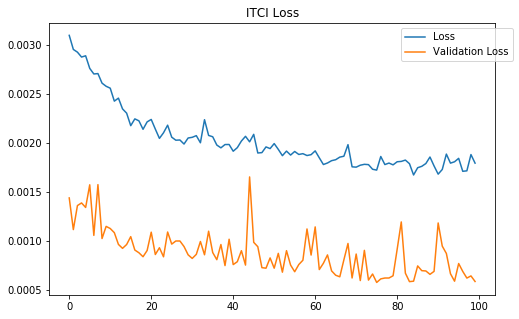

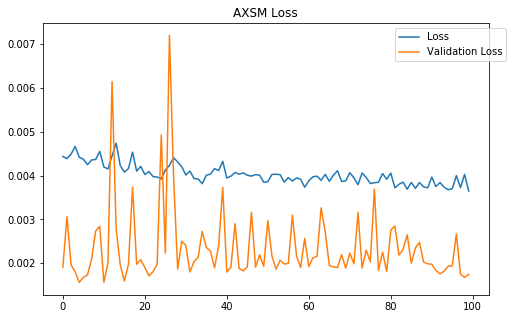

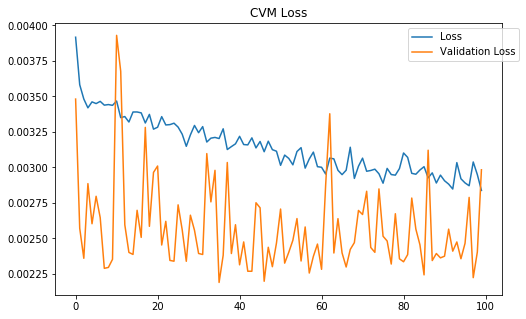

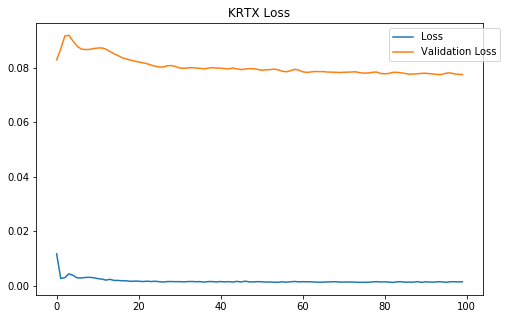

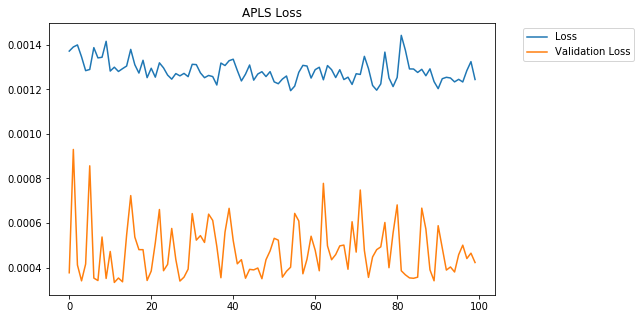

...

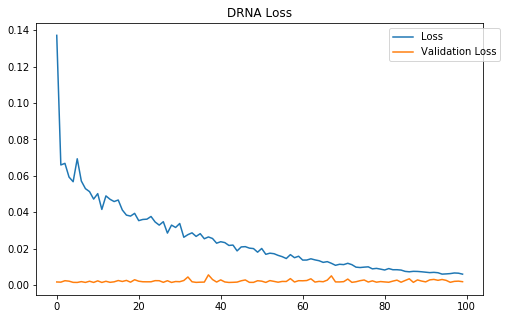

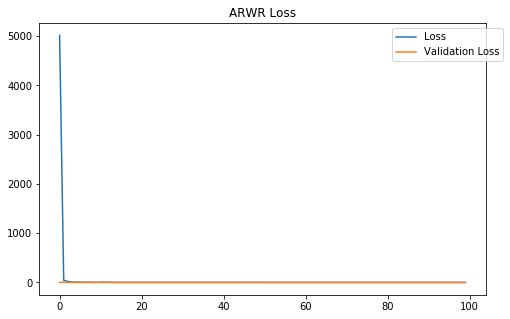

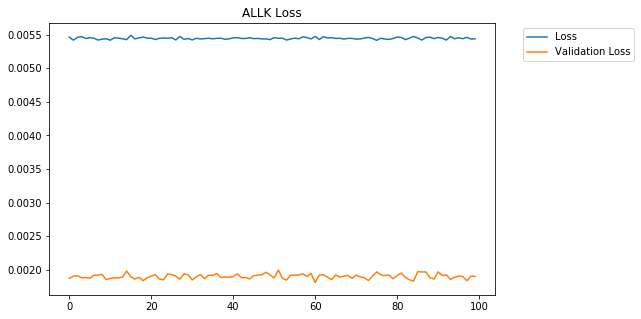

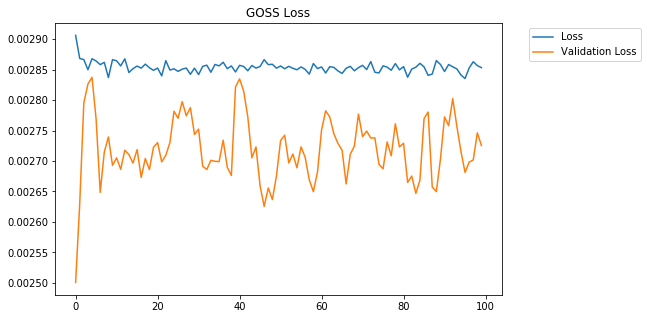

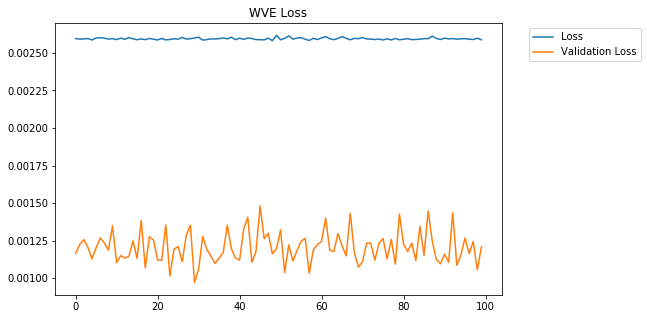

In [11]:
for stock in stocks:

    (feature_train, label_train, feature_test, label_test) = (processed_data[stock]['data_1'],processed_data[stock]['target_1'], 
                                                            processed_data[stock]['data_test'], processed_data[stock]['target_test']) 
    model.fit(feature_train, label_train, batch_size=25, epochs=100, validation_data = (feature_test, label_test), verbose=0)
    dict_ = model.history.history
    plt.figure(figsize=(8,5))
    plt.title(f"{stock} Loss")
    plt.plot(dict_['loss'], label = 'Loss')
    plt.plot(dict_['val_loss'], label= 'Validation Loss')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show()
    model.save('model.h5')


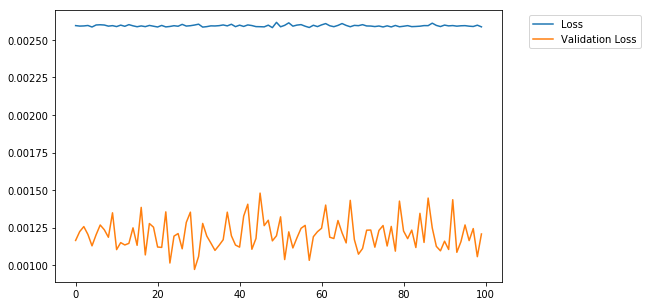

In [12]:
dict_ = model.history.history
plt.figure(figsize=(8,5))
plt.plot(dict_['loss'], label = 'Loss')
plt.plot(dict_['val_loss'], label= 'Validation Loss')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

In [13]:

(feature_train, label_train, feature_test, label_test) = (processed_data['SGMO']['data_1'],processed_data['SGMO']['target_1'], 
                                                            processed_data['SGMO']['data_test'], processed_data['SGMO']['target_test']) 

predict_train = model.predict(feature_train)
predict_test = model.predict(feature_test)
r2_score(label_test, predict_test), r2_score(label_train, predict_train)


(-0.4093812722927004, -0.0036900825080024013)

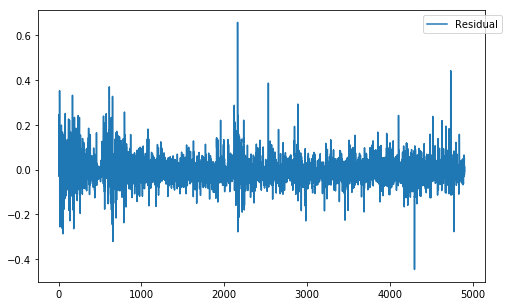

In [14]:
plt.figure(figsize=(8,5))
plt.plot(predict_train- label_train, label = 'Residual')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


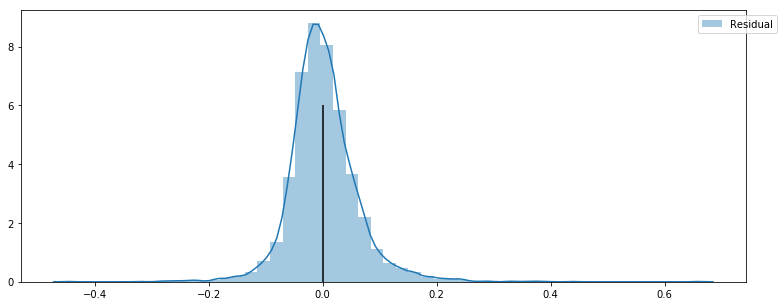

In [15]:
plt.figure(figsize=(13,5))
sns.distplot(predict_train- label_train, label = 'Residual')
plt.vlines(0,0,6)
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

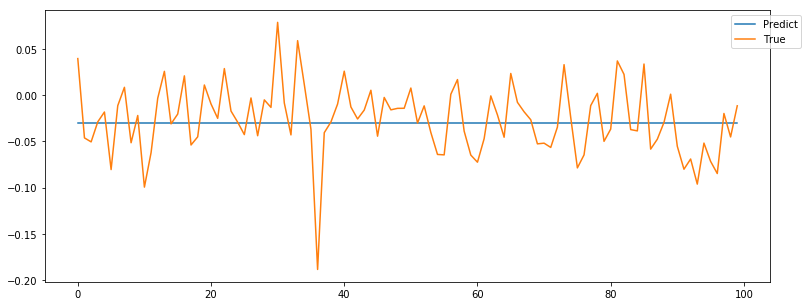

In [16]:
plt.figure(figsize=(13,5))
plt.plot(predict_train[-100:], label = 'Predict')
plt.plot(label_train[-100:], label= 'True')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

Train on 4905 samples, validate on 40 samples
Epoch 1/1000
4905/4905 [==============================] - 0s 95us/step - loss: 0.0037 - val_loss: 0.0011
Epoch 2/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 3/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 4/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 5/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 6/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 7/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 8/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 9/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 10/

Epoch 78/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 79/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 80/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 81/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 82/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 83/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 84/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 85/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0011
Epoch 86/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 87/1000
4905/4905 [=====================

Epoch 155/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0036 - val_loss: 0.0011
Epoch 156/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 157/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 158/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 159/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0036 - val_loss: 0.0014
Epoch 160/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 161/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 162/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0036 - val_loss: 0.0011
Epoch 163/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 164/1000
4905/4905 [===========

4905/4905 [==============================] - 0s 91us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 232/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 233/1000
4905/4905 [==============================] - 1s 104us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 234/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 235/1000
4905/4905 [==============================] - 1s 116us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 236/1000
4905/4905 [==============================] - 0s 92us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 237/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 238/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 239/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 240/1000
4905/4905 [========================

4905/4905 [==============================] - 0s 87us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 308/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 309/1000
4905/4905 [==============================] - 1s 125us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 310/1000
4905/4905 [==============================] - 1s 106us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 311/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0036 - val_loss: 0.0011
Epoch 312/1000
4905/4905 [==============================] - 0s 97us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 313/1000
4905/4905 [==============================] - 0s 100us/step - loss: 0.0036 - val_loss: 0.0014
Epoch 314/1000
4905/4905 [==============================] - 0s 97us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 315/1000
4905/4905 [==============================] - 1s 103us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 316/1000
4905/4905 [======================

4905/4905 [==============================] - 0s 87us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 384/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0035 - val_loss: 0.0013
Epoch 385/1000
4905/4905 [==============================] - 0s 79us/step - loss: 0.0036 - val_loss: 0.0013
Epoch 386/1000
4905/4905 [==============================] - 0s 79us/step - loss: 0.0035 - val_loss: 0.0011
Epoch 387/1000
4905/4905 [==============================] - 0s 79us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 388/1000
4905/4905 [==============================] - 0s 79us/step - loss: 0.0035 - val_loss: 0.0013
Epoch 389/1000
4905/4905 [==============================] - 0s 80us/step - loss: 0.0035 - val_loss: 0.0011
Epoch 390/1000
4905/4905 [==============================] - 0s 79us/step - loss: 0.0036 - val_loss: 0.0012
Epoch 391/1000
4905/4905 [==============================] - 0s 79us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 392/1000
4905/4905 [==========================

4905/4905 [==============================] - 0s 89us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 460/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 461/1000
4905/4905 [==============================] - 0s 91us/step - loss: 0.0035 - val_loss: 0.0011
Epoch 462/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 463/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0035 - val_loss: 0.0011
Epoch 464/1000
4905/4905 [==============================] - 0s 91us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 465/1000
4905/4905 [==============================] - 1s 104us/step - loss: 0.0035 - val_loss: 0.0010
Epoch 466/1000
4905/4905 [==============================] - 1s 107us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 467/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0035 - val_loss: 0.0013
Epoch 468/1000
4905/4905 [========================

4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 536/1000
4905/4905 [==============================] - 0s 80us/step - loss: 0.0035 - val_loss: 0.0013
Epoch 537/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 538/1000
4905/4905 [==============================] - 0s 94us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 539/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 540/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 541/1000
4905/4905 [==============================] - 1s 102us/step - loss: 0.0035 - val_loss: 0.0012
Epoch 542/1000
4905/4905 [==============================] - 0s 92us/step - loss: 0.0034 - val_loss: 0.0013
Epoch 543/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0035 - val_loss: 0.0011
Epoch 544/1000
4905/4905 [=========================

4905/4905 [==============================] - 0s 91us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 612/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0035 - val_loss: 0.0011
Epoch 613/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 614/1000
4905/4905 [==============================] - 0s 100us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 615/1000
4905/4905 [==============================] - 1s 104us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 616/1000
4905/4905 [==============================] - 0s 101us/step - loss: 0.0034 - val_loss: 0.0010
Epoch 617/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 618/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0035 - val_loss: 0.0010
Epoch 619/1000
4905/4905 [==============================] - 0s 91us/step - loss: 0.0034 - val_loss: 0.0010
Epoch 620/1000
4905/4905 [=======================

4905/4905 [==============================] - 0s 90us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 688/1000
4905/4905 [==============================] - 1s 113us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 689/1000
4905/4905 [==============================] - 0s 99us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 690/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 691/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 692/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0013
Epoch 693/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 694/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 695/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0033 - val_loss: 0.0012
Epoch 696/1000
4905/4905 [=========================

4905/4905 [==============================] - 0s 82us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 764/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 765/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 766/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 767/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 768/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 769/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0033 - val_loss: 0.0010
Epoch 770/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 771/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0033 - val_loss: 0.0012
Epoch 772/1000
4905/4905 [==========================

4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 9.9700e-04
Epoch 840/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 841/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0010
Epoch 842/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 843/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 844/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 845/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0034 - val_loss: 0.0012
Epoch 846/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0010
Epoch 847/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 848/1000
4905/4905 [======================

4905/4905 [==============================] - 0s 82us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 916/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 917/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 918/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0012
Epoch 919/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0033 - val_loss: 9.6953e-04
Epoch 920/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 921/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 922/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0033 - val_loss: 0.0012
Epoch 923/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0034 - val_loss: 9.9993e-04
Epoch 924/1000
4905/4905 [==================

4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 992/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 993/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0010
Epoch 994/1000
4905/4905 [==============================] - 0s 82us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 995/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 996/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 9.9633e-04
Epoch 997/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 998/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0033 - val_loss: 0.0010
Epoch 999/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0033 - val_loss: 0.0010
Epoch 1000/1000
4905/4905 [=====================

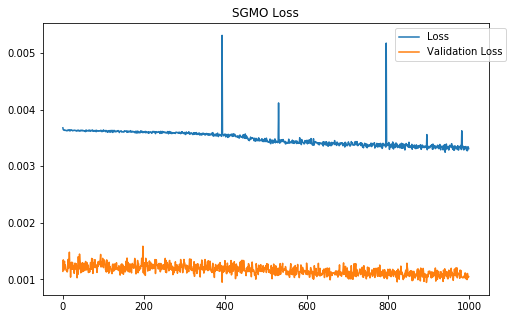

In [17]:
stock = 'SGMO'
(feature_train, label_train, feature_test, label_test) = (processed_data[stock]['data_1'],processed_data[stock]['target_1'], 
                                                            processed_data[stock]['data_test'], processed_data[stock]['target_test']) 
model.fit(feature_train, label_train, batch_size=50, epochs=1000, validation_data = (feature_test, label_test))
dict_ = model.history.history
plt.figure(figsize=(8,5))
plt.title(f"{stock} Loss")
plt.plot(dict_['loss'], label = 'Loss')
plt.plot(dict_['val_loss'], label= 'Validation Loss')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()
model.save('model.h5')

SGMO -0.30377701451437034 0.027180388083212437


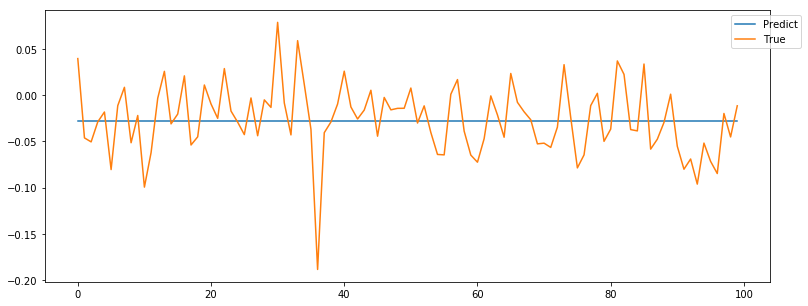

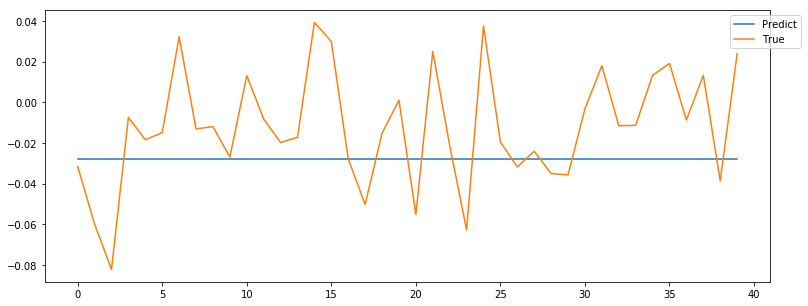

In [18]:
predict_train = model.predict(feature_train)
predict_test = model.predict(feature_test)
print(stock,r2_score(label_test, predict_test), r2_score(label_train, predict_train))
plt.figure(figsize=(13,5))
plt.plot(predict_train[-100:], label = 'Predict')
plt.plot(label_train[-100:], label= 'True')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

plt.figure(figsize=(13,5))
plt.plot(predict_test[-100:], label = 'Predict')
plt.plot(label_test[-100:], label= 'True')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


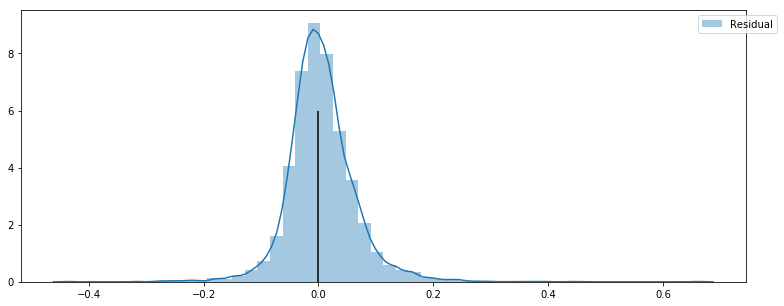

In [19]:
plt.figure(figsize=(13,5))
sns.distplot(predict_train- label_train, label = 'Residual')
plt.vlines(0,0,6)
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

ITCI -302560030073786.7 -71.40937158666294


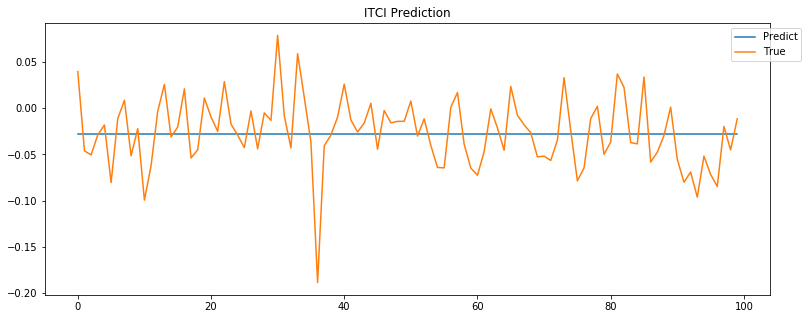

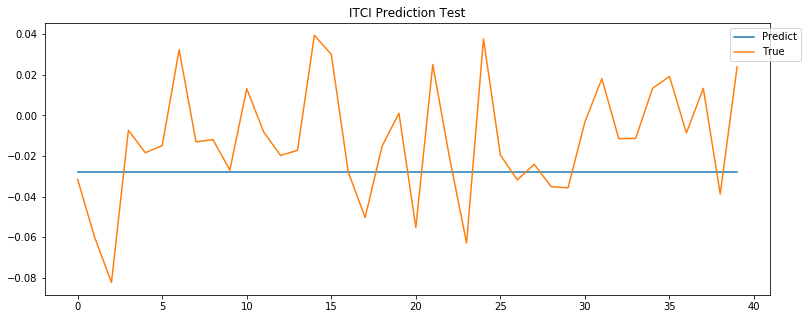

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


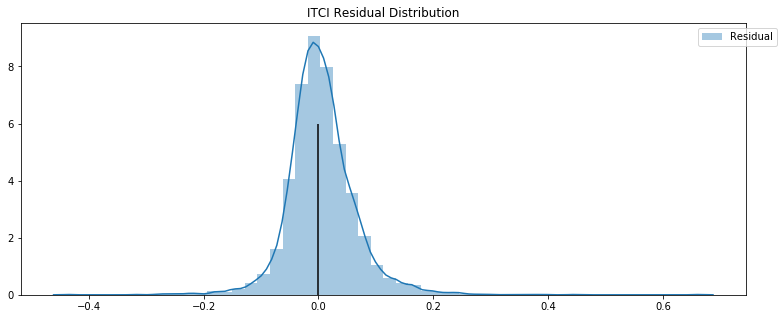

AXSM -302560030073786.7 -71.40937158666294


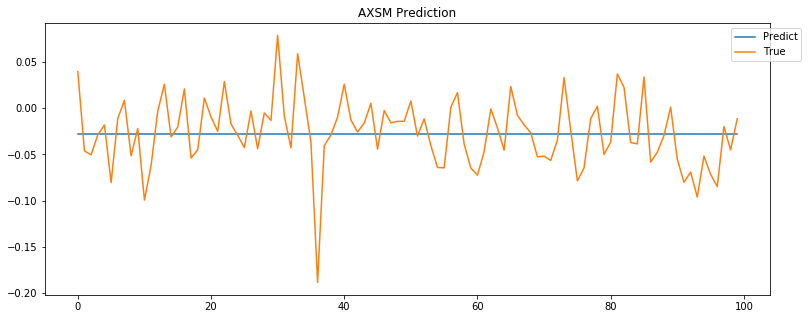

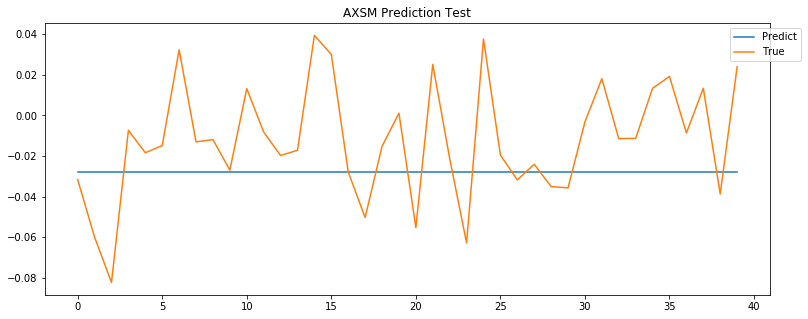

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


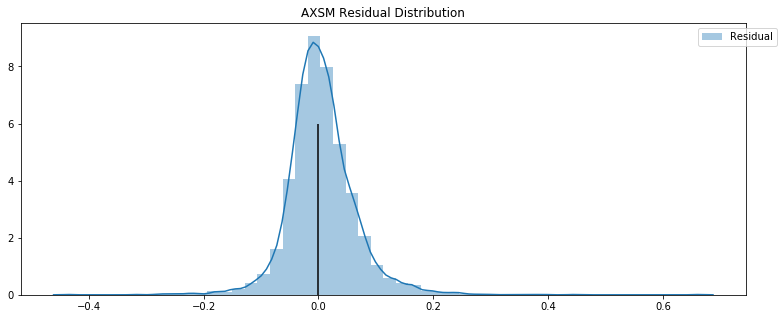

CVM -302560030073786.7 -71.40937158666294


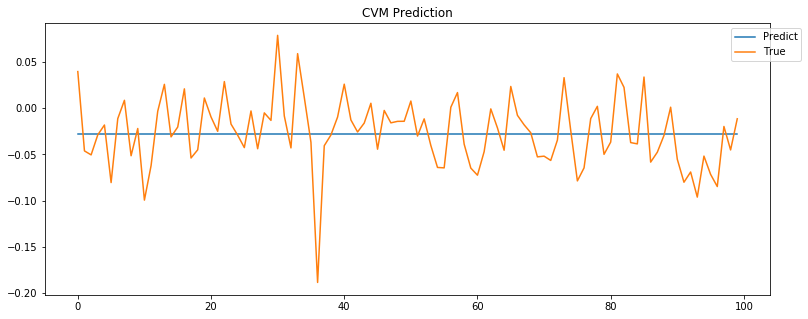

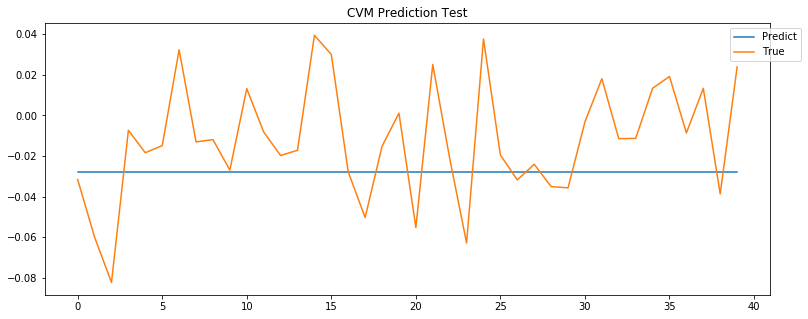

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


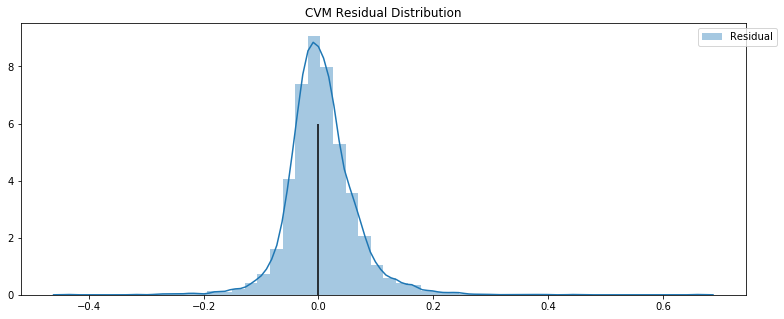

KRTX -302560030073786.7 -71.40937158666294


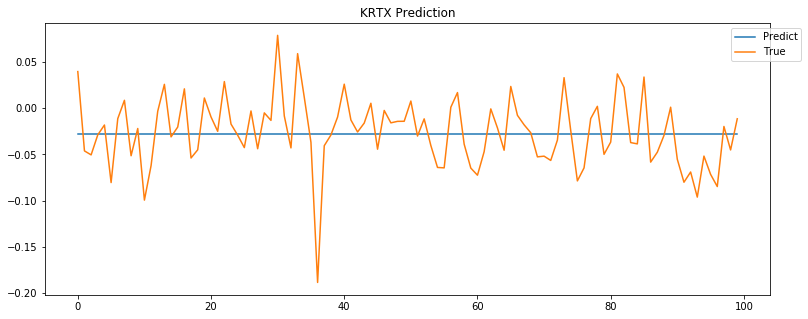

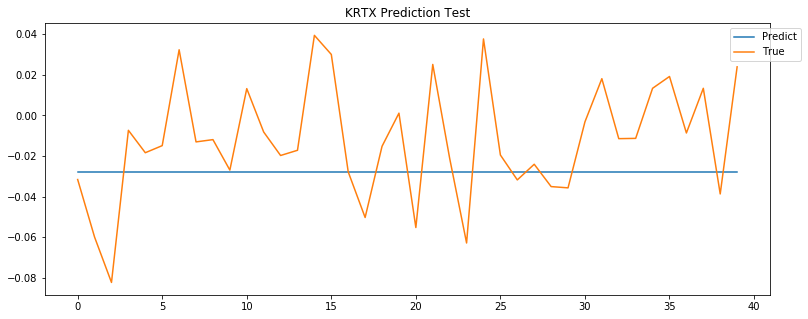

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


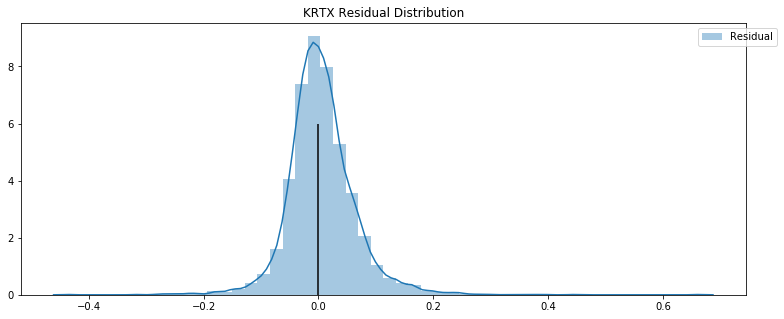

APLS -302560030073786.7 -71.40937158666294


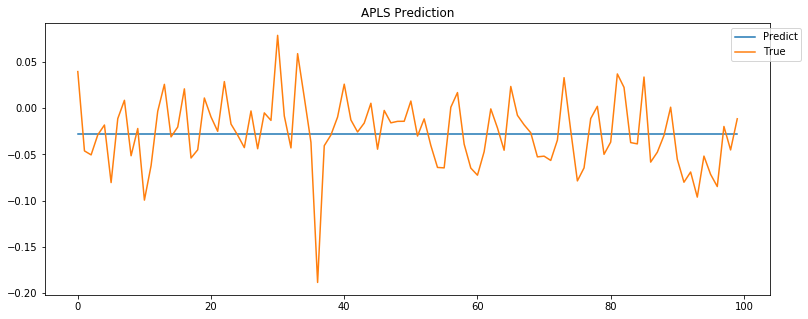

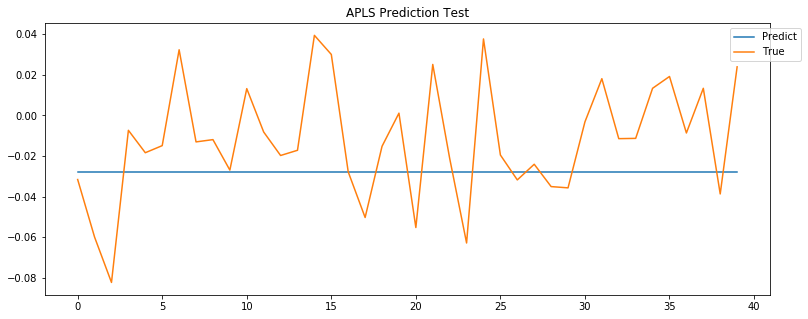

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


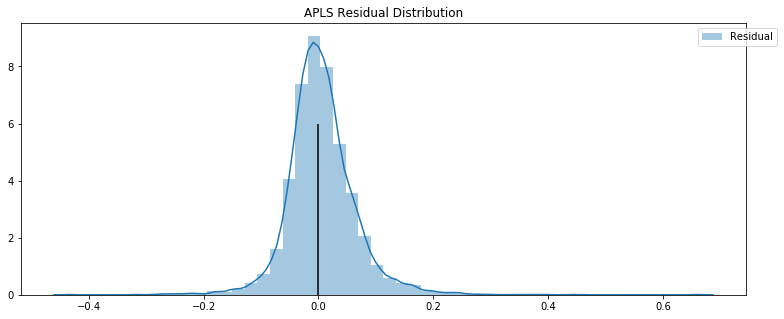

PRVB -302560030073786.7 -71.40937158666294


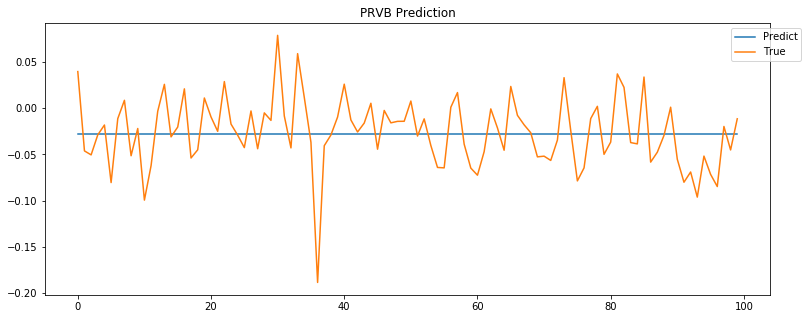

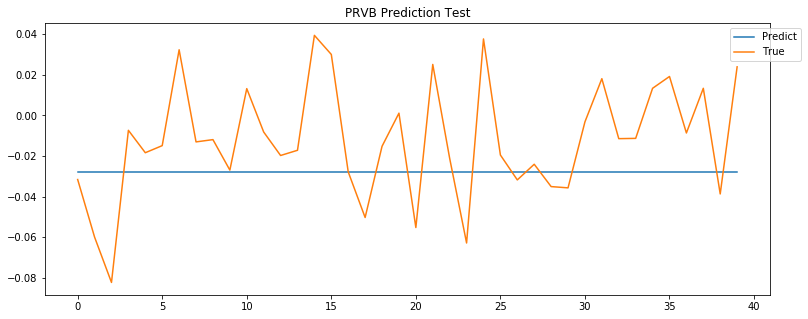

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


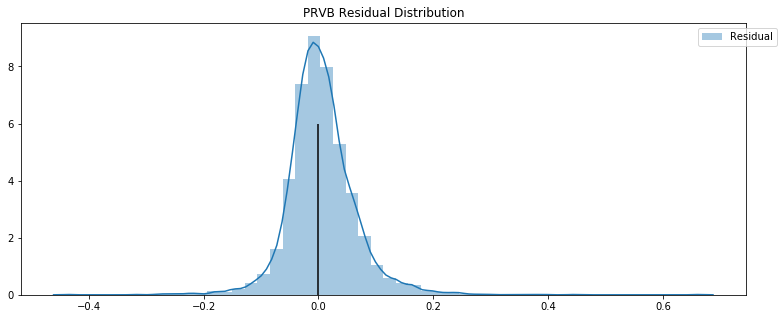

CRTX -302560030073786.7 -71.40937158666294


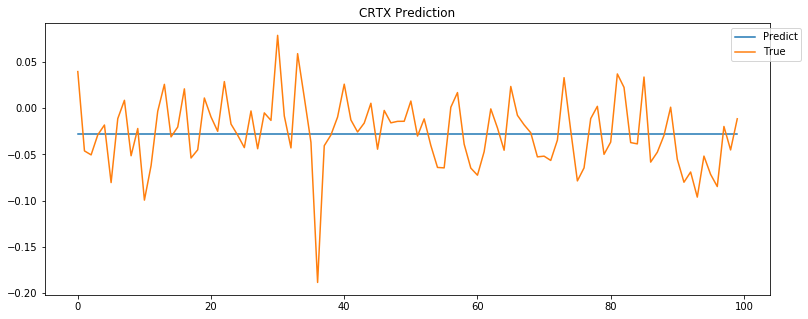

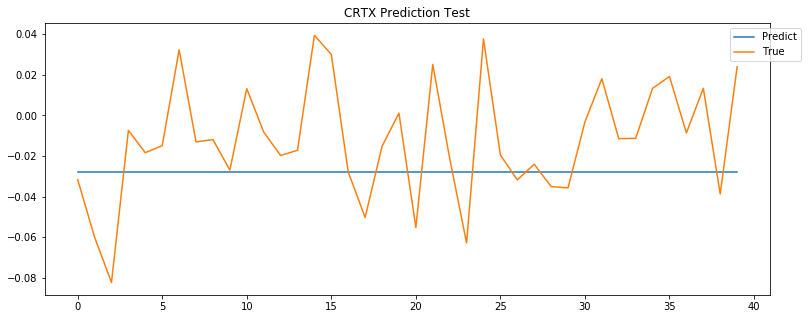

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


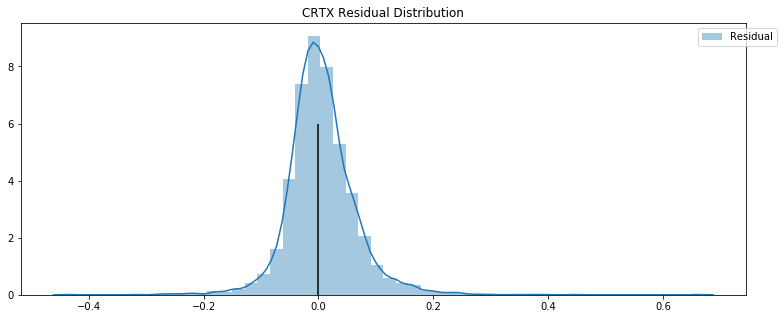

EPZM -302560030073786.7 -71.40937158666294


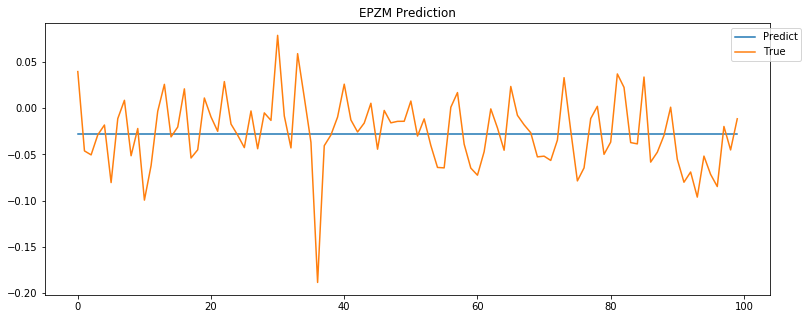

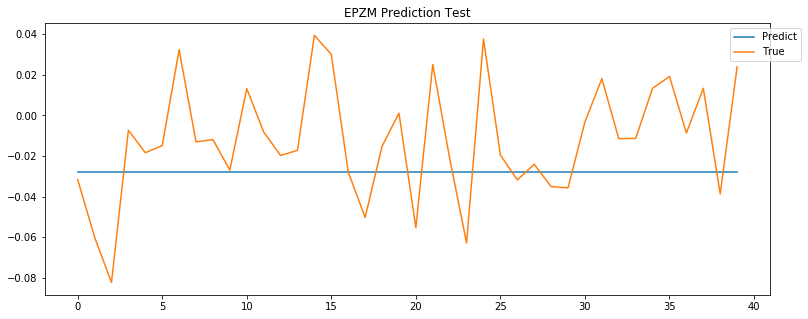

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


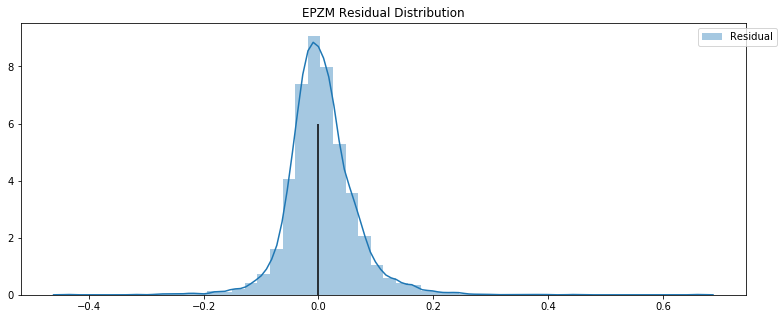

CRBP -302560030073786.7 -71.40937158666294


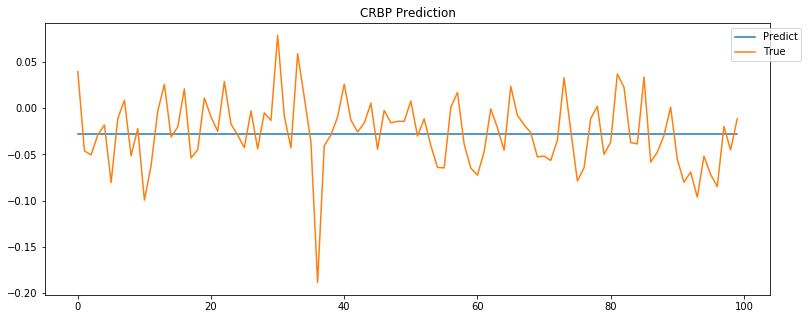

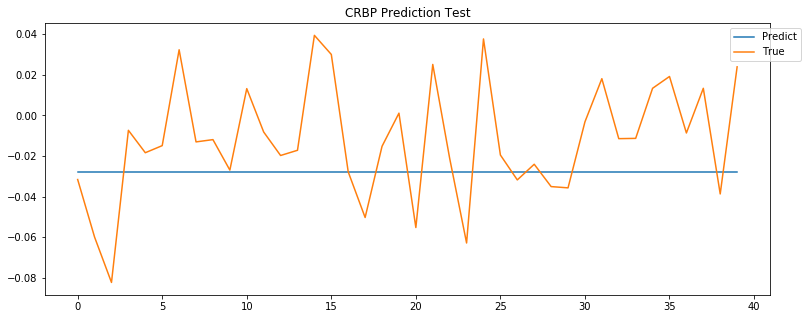

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


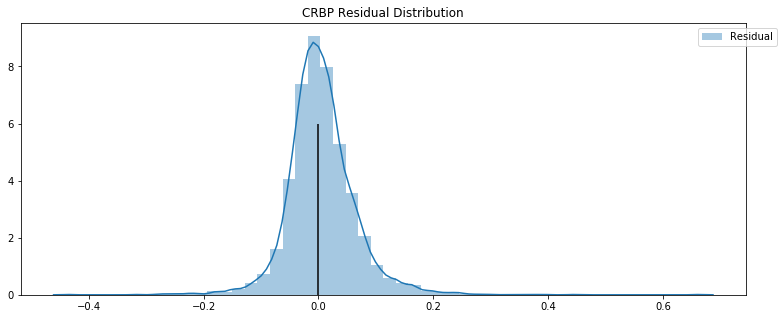

CCXI -302560030073786.7 -71.40937158666294


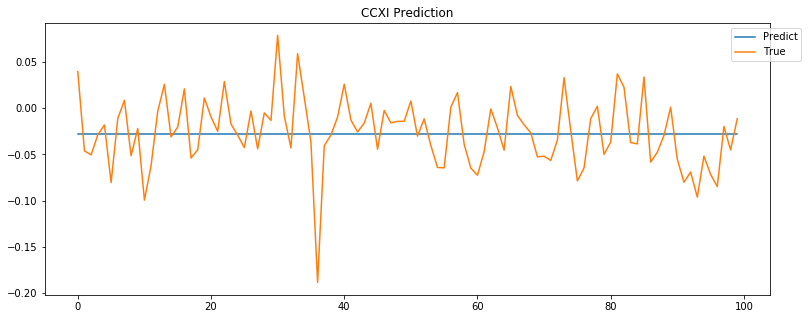

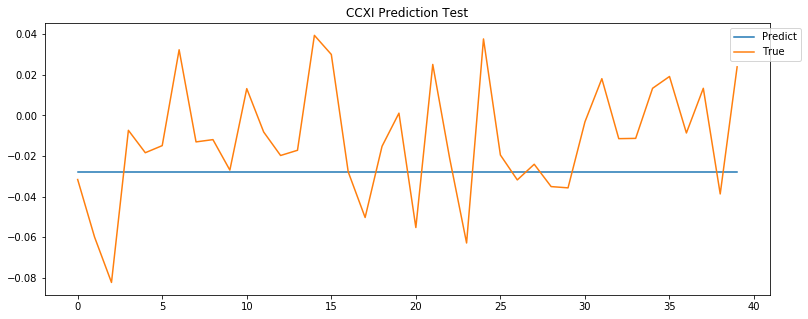

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


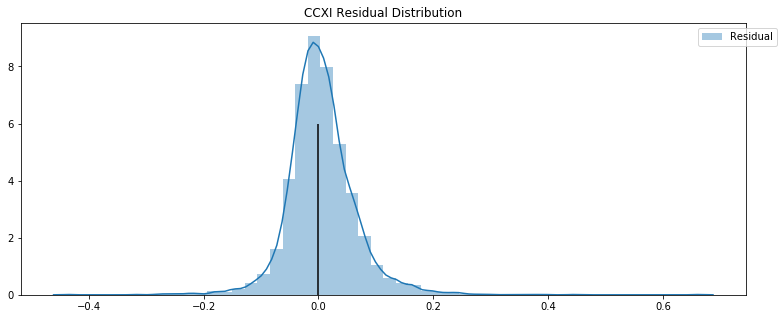

TGTX -302560030073786.7 -71.40937158666294


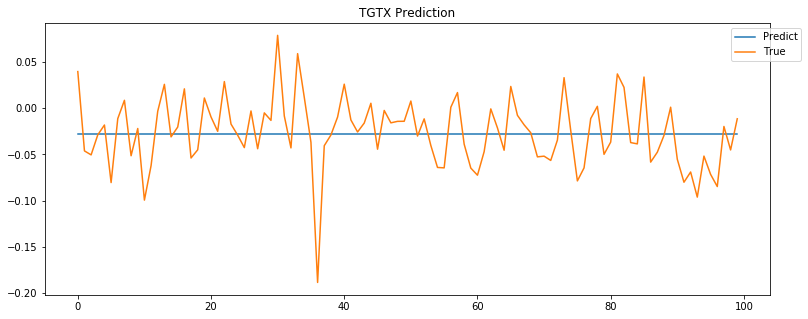

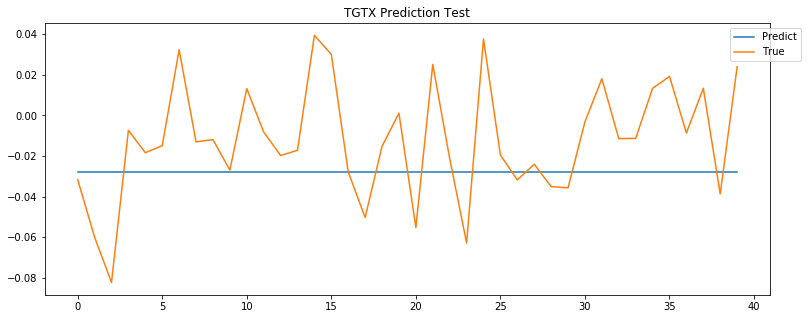

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


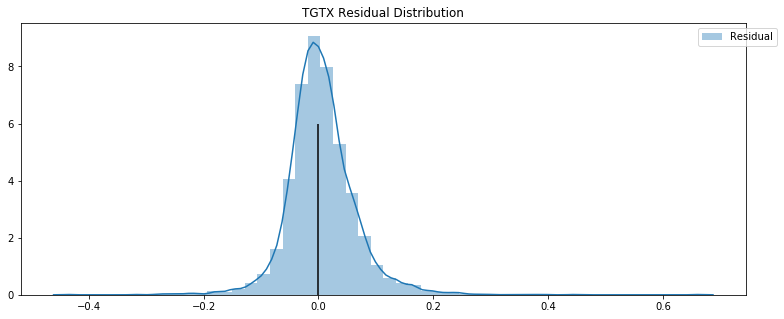

IMGN -302560030073786.7 -71.40937158666294


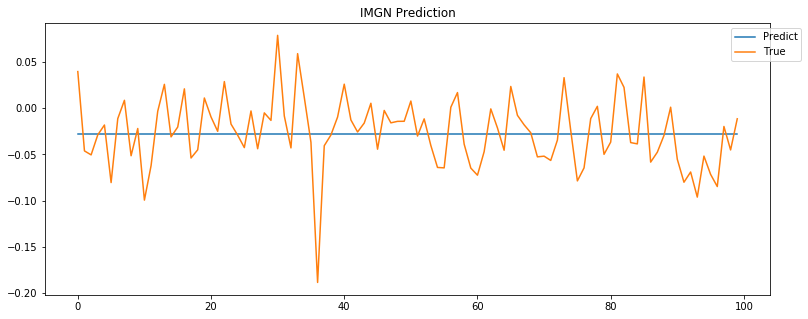

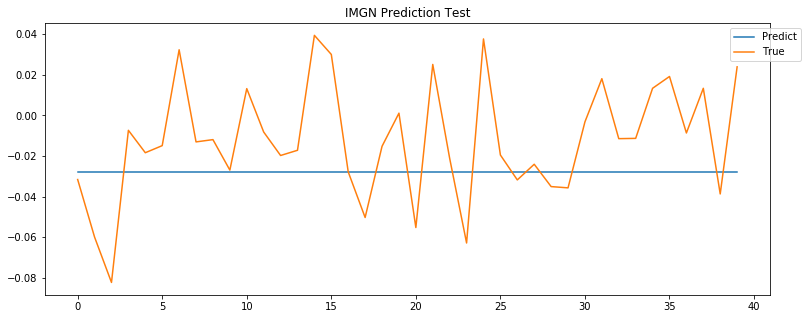

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


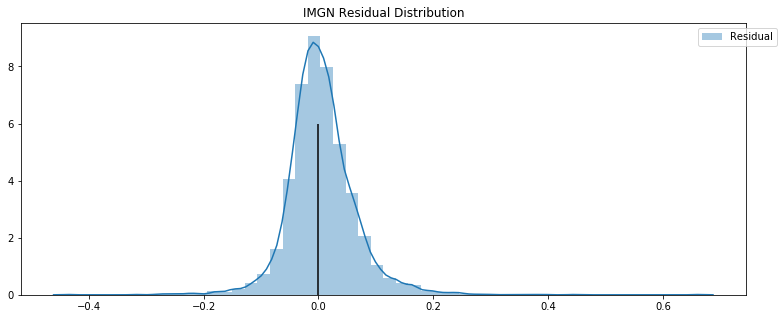

FATE -302560030073786.7 -71.40937158666294


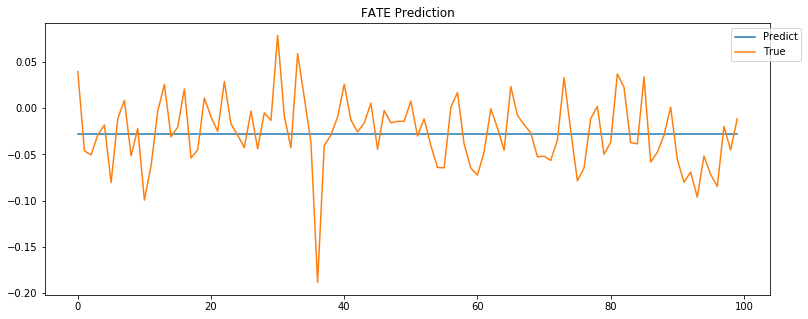

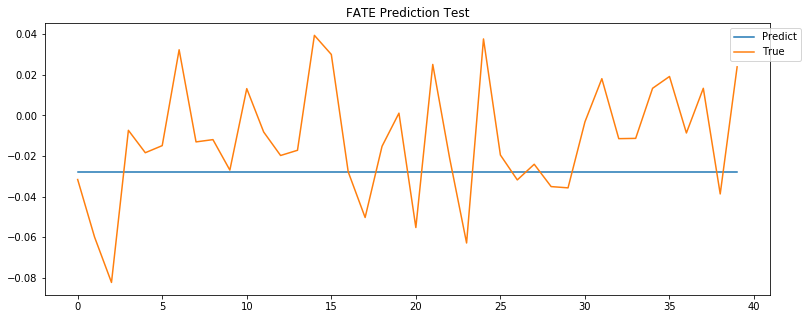

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


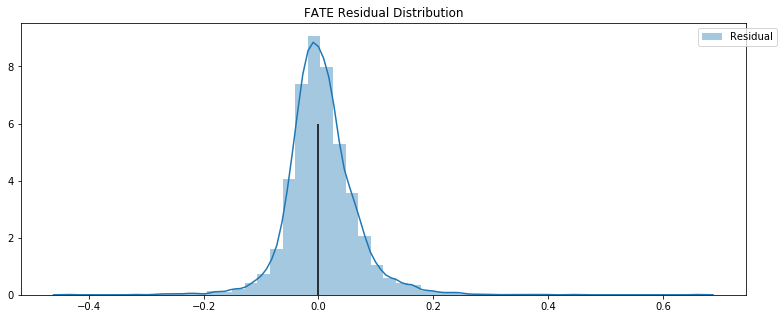

AKBA -302560030073786.7 -71.40937158666294


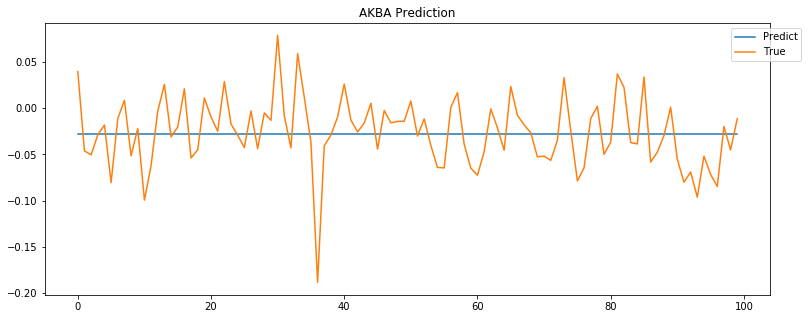

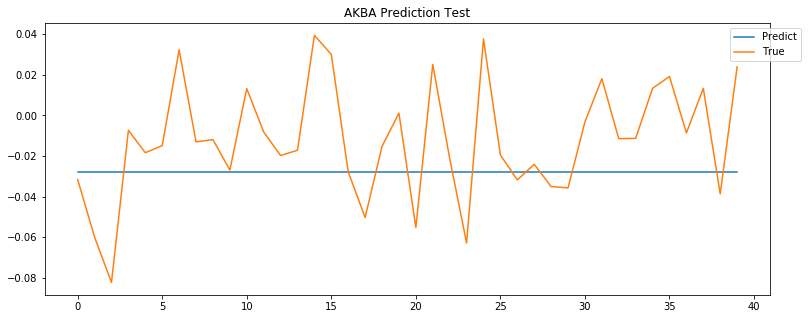

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


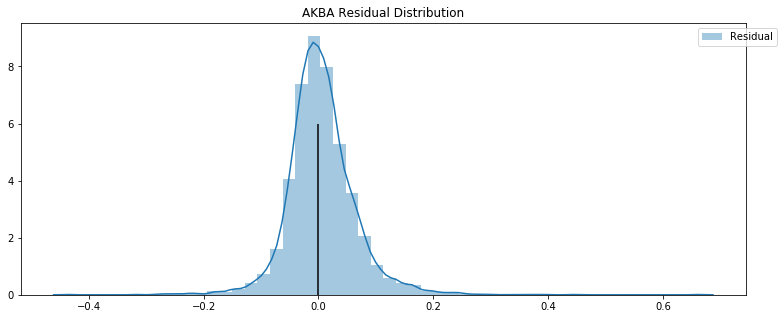

DNLI -302560030073786.7 -71.40937158666294


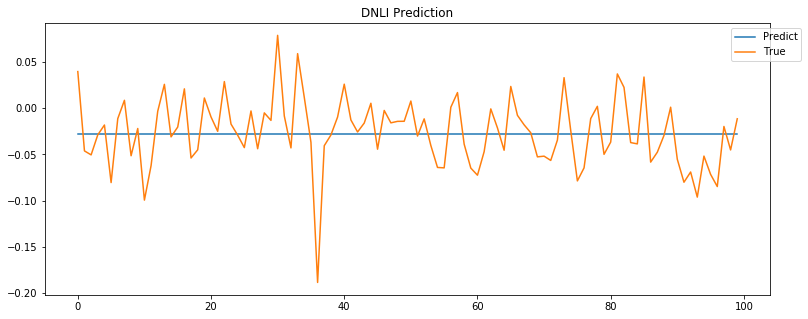

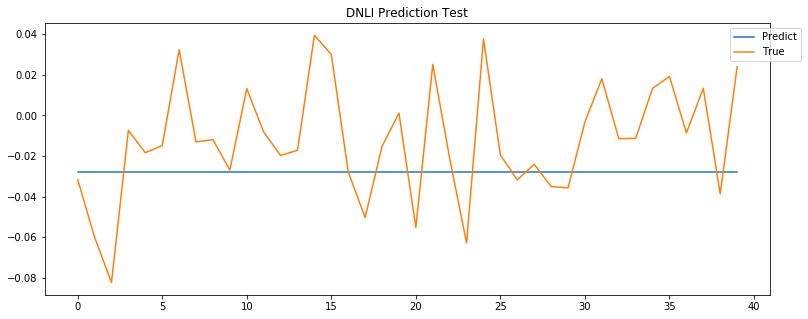

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


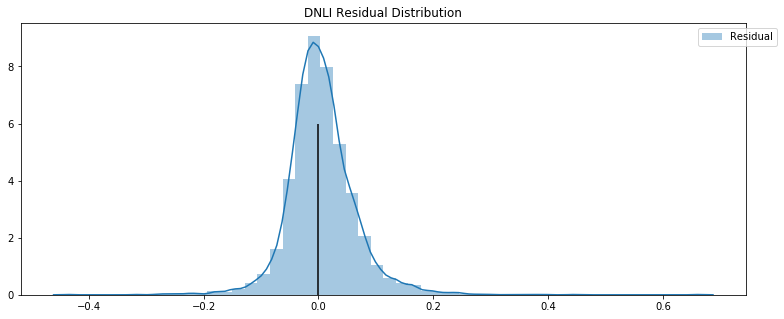

RIGL -302560030073786.7 -71.40937158666294


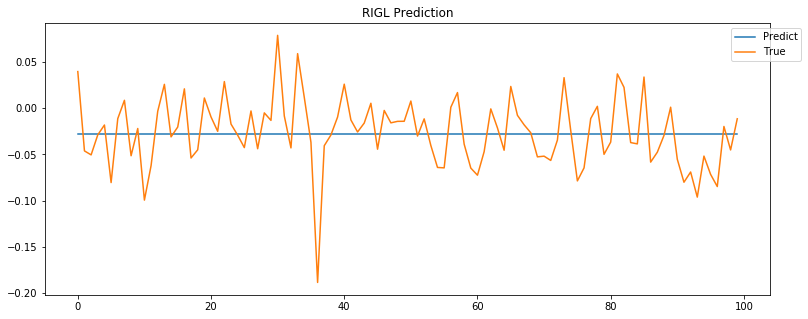

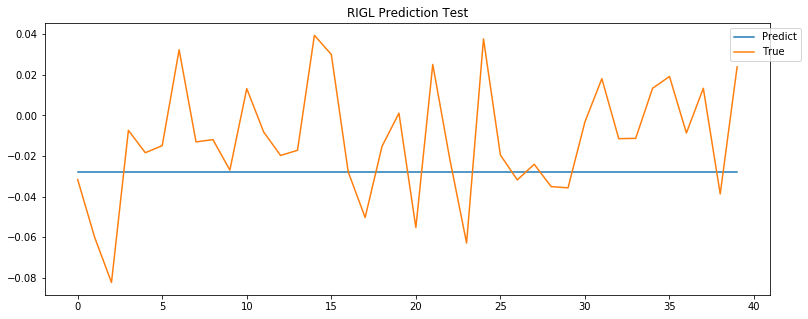

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


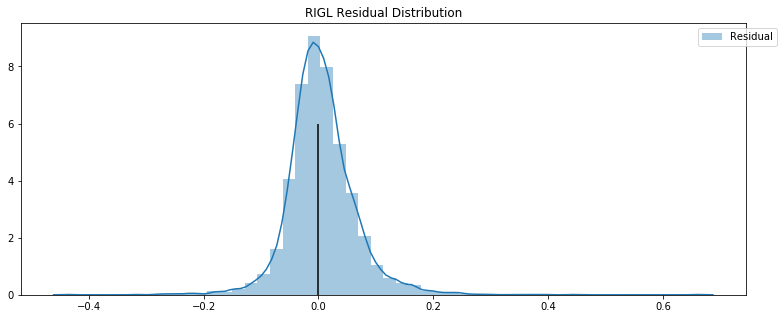

PRNB -302560030073786.7 -71.40937158666294


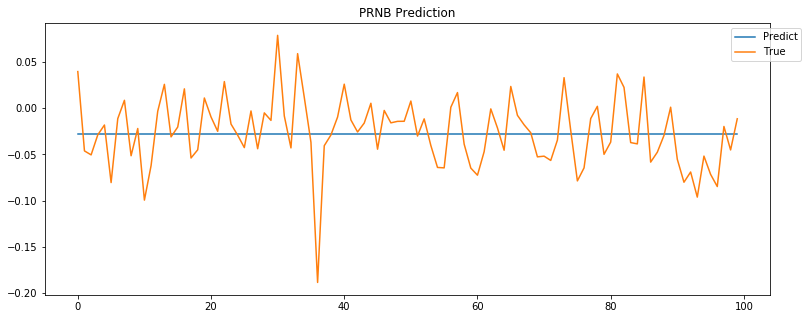

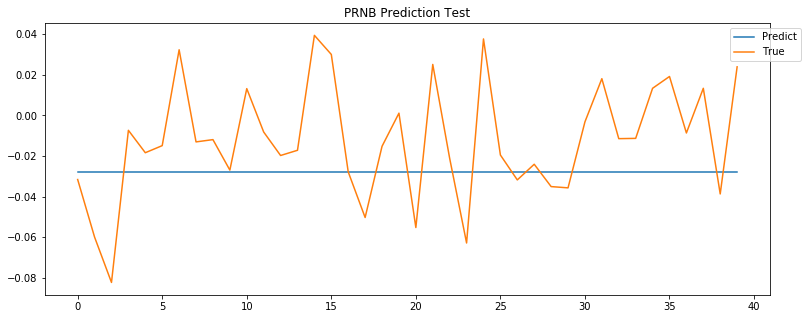

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


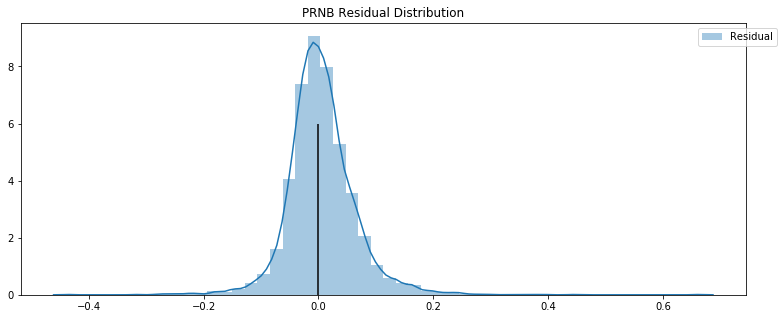

ARVN -302560030073786.7 -71.40937158666294


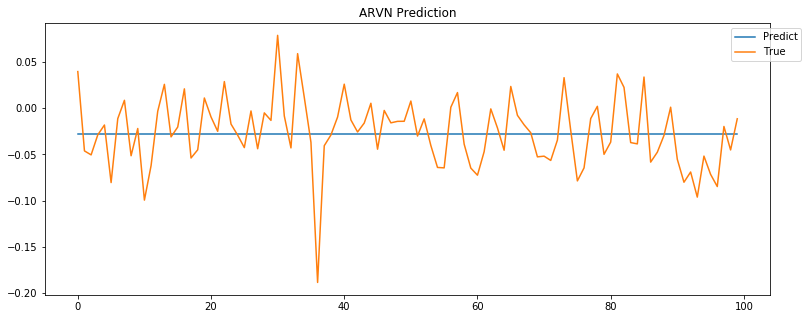

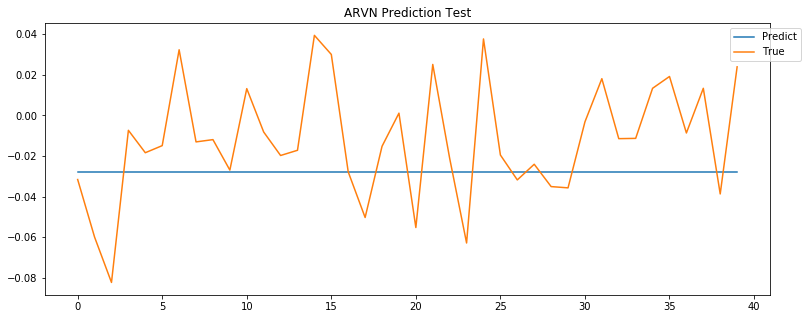

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


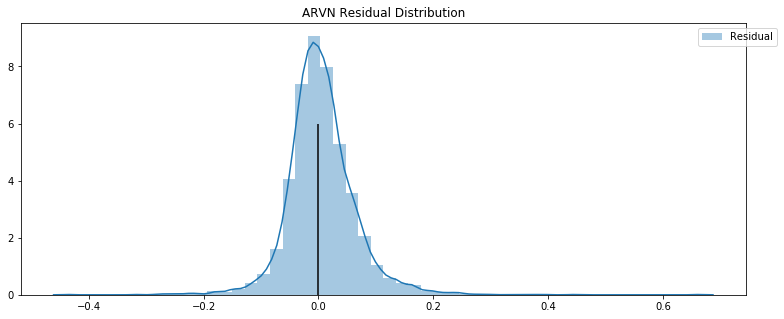

ZYME -302560030073786.7 -71.40937158666294


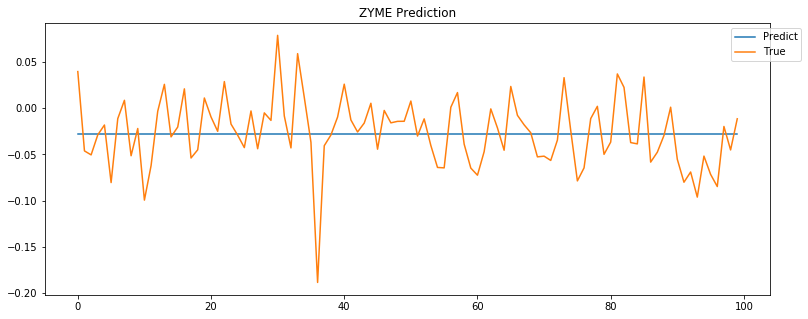

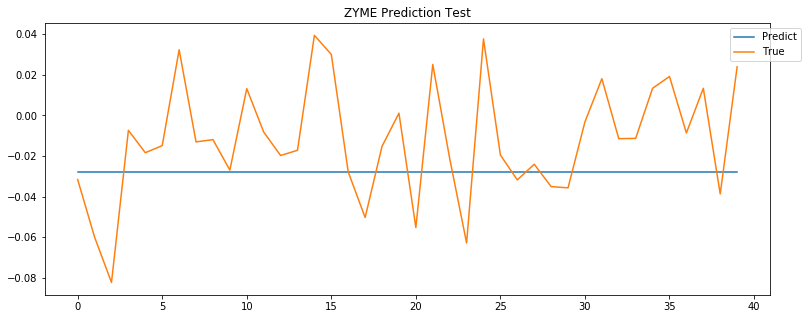

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


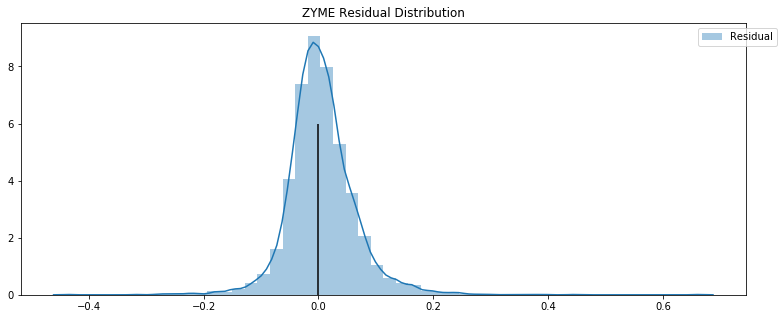

MRNA -302560030073786.7 -71.40937158666294


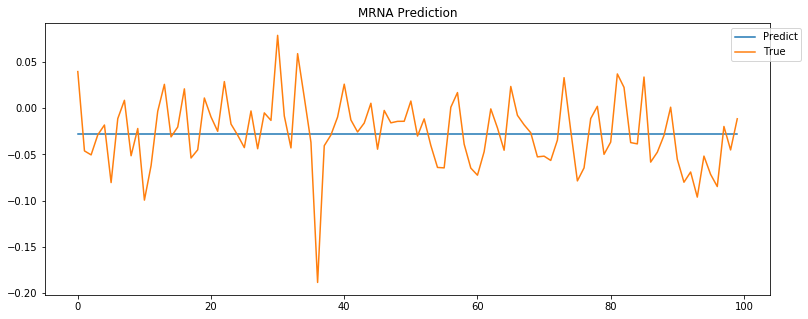

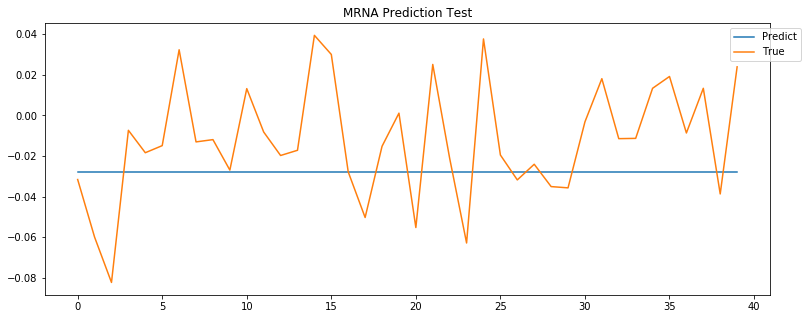

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


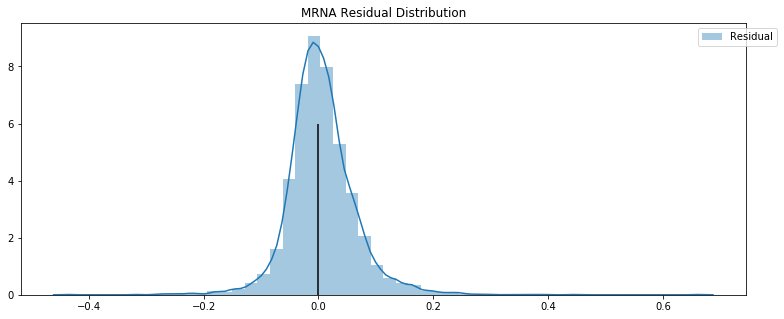

CYTK -302560030073786.7 -71.40937158666294


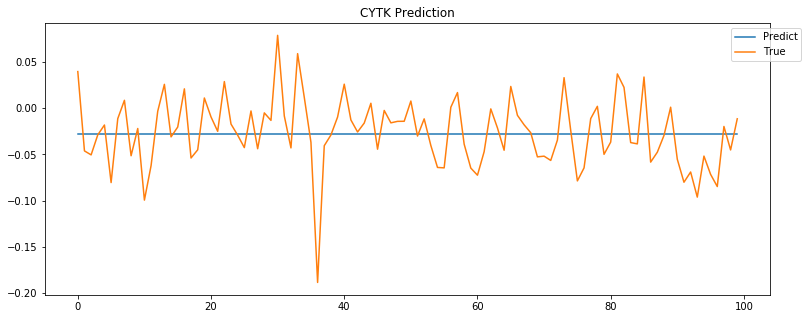

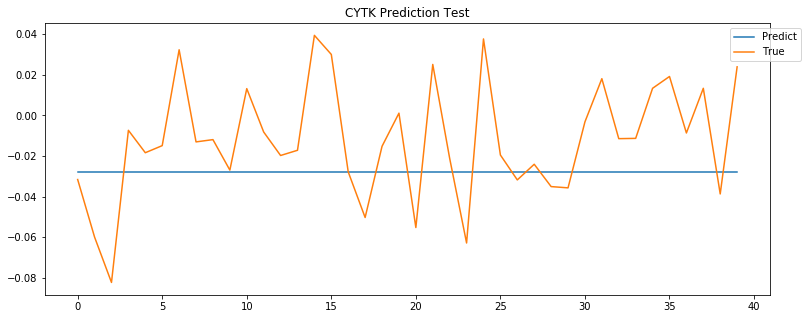

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


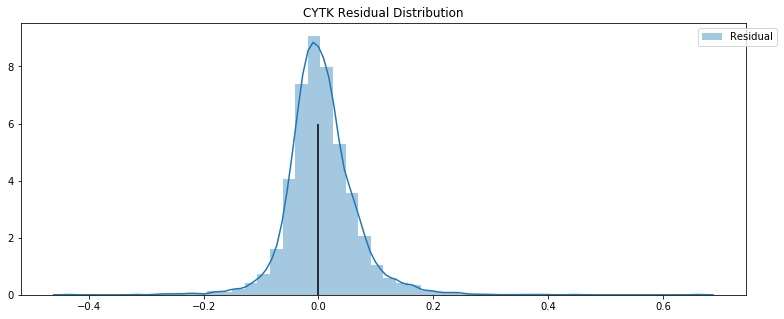

FTSV -302560030073786.7 -71.40937158666294


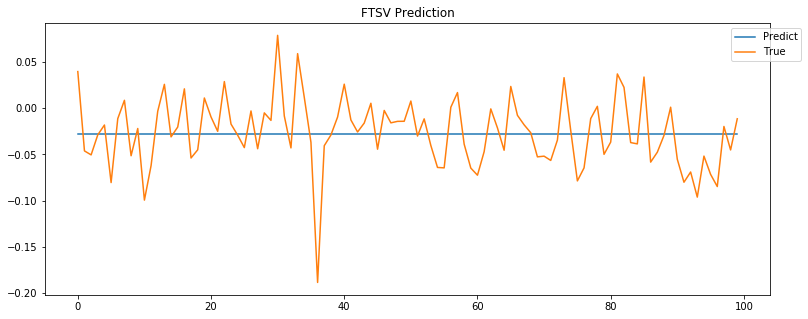

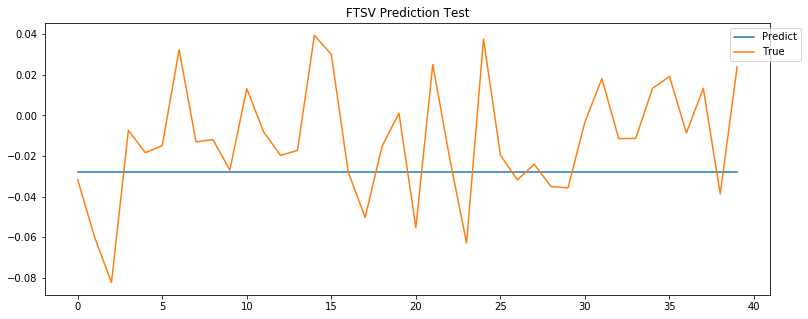

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


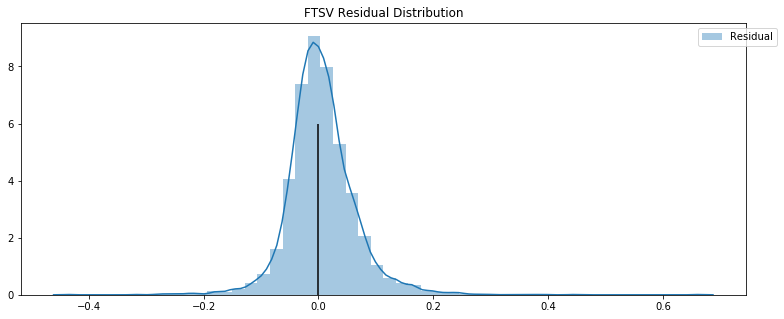

ASND -302560030073786.7 -71.40937158666294


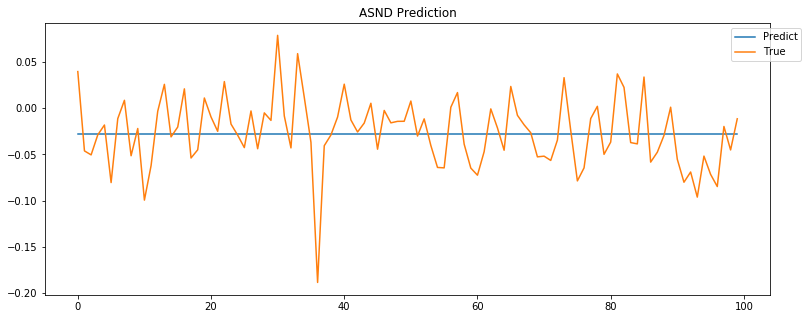

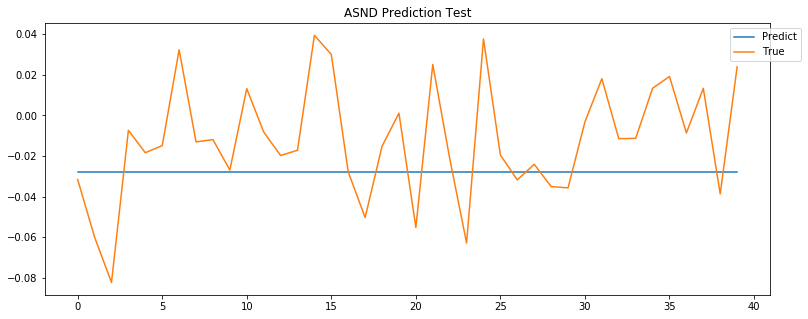

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


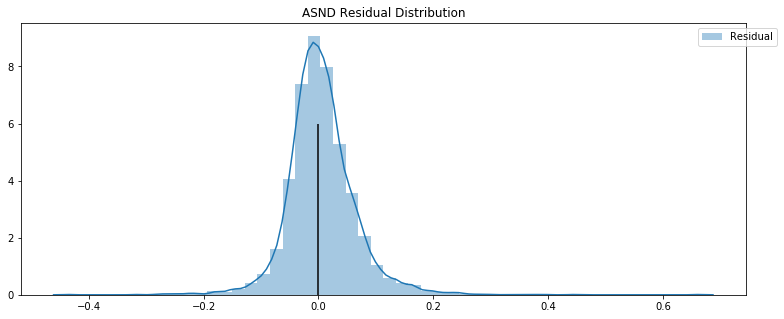

XBIT -302560030073786.7 -71.40937158666294


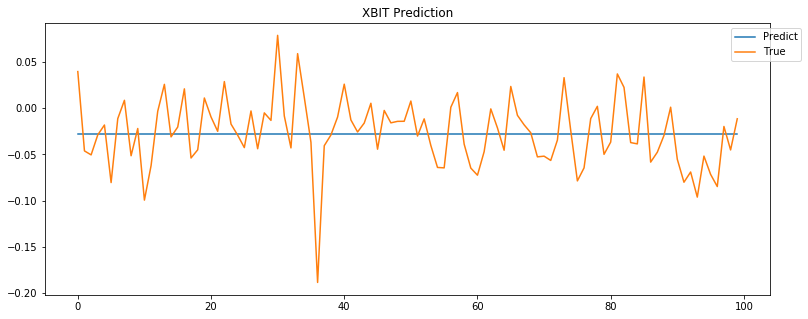

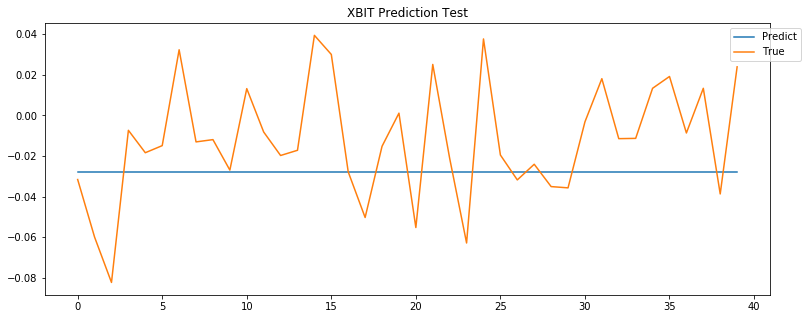

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


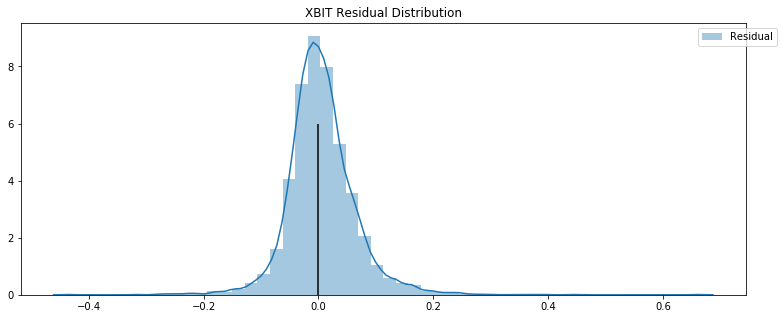

ALEC -302560030073786.7 -71.40937158666294


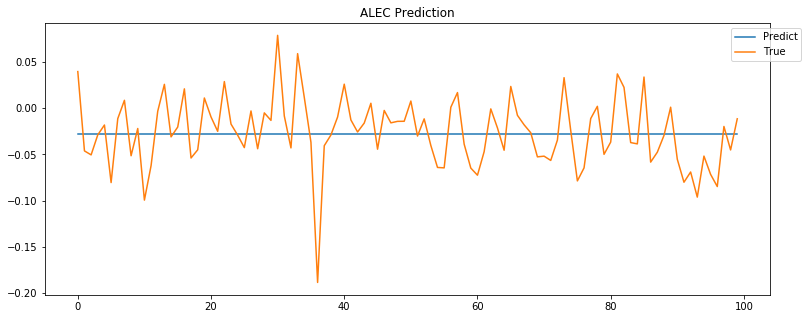

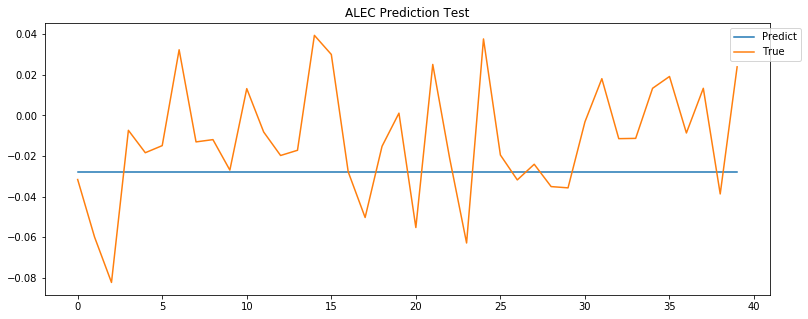

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


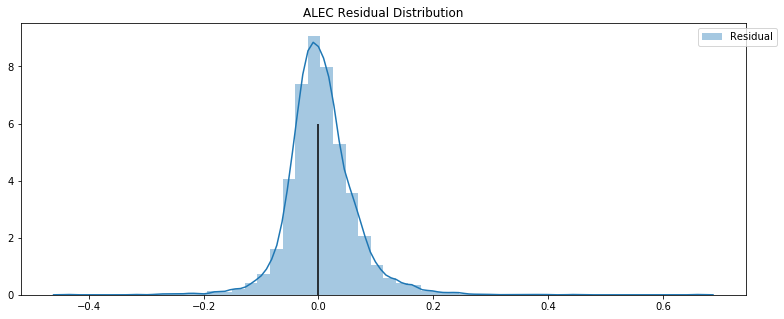

ORTX -302560030073786.7 -71.40937158666294


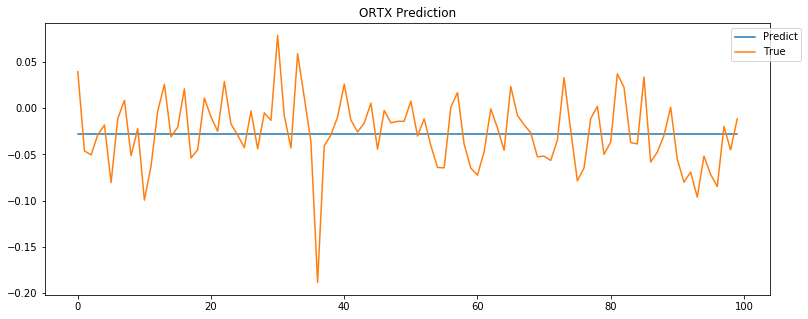

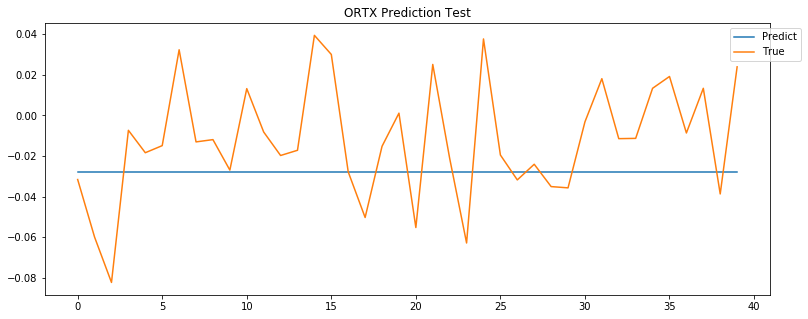

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


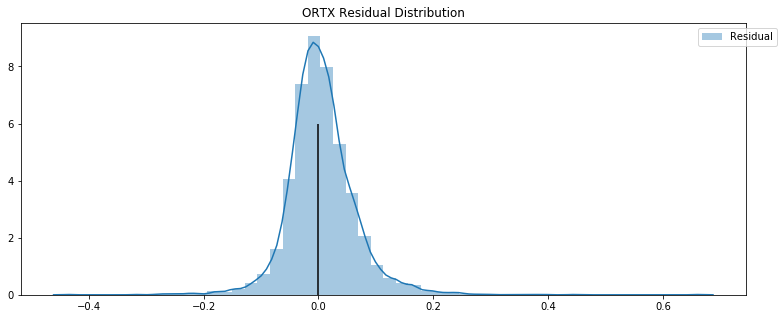

ADVM -302560030073786.7 -71.40937158666294


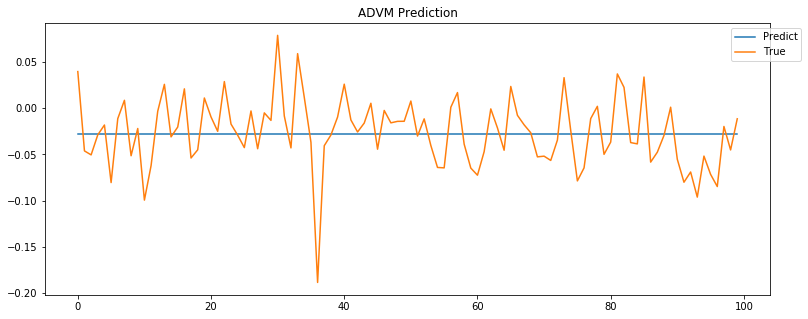

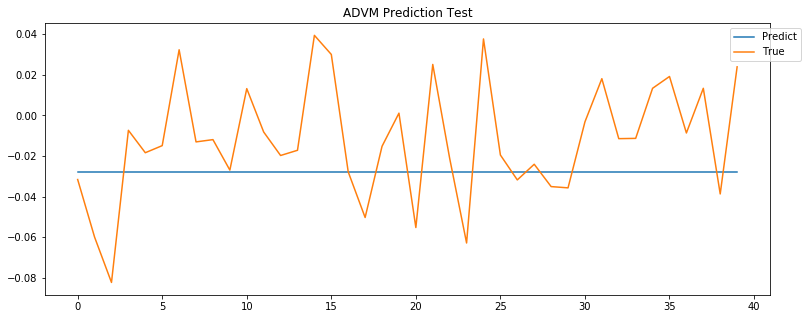

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


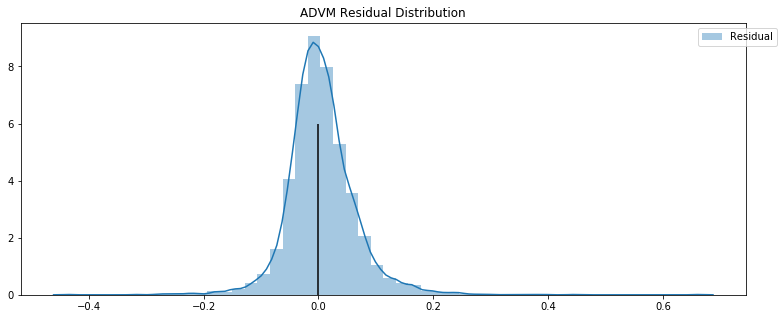

MGNX -302560030073786.7 -71.40937158666294


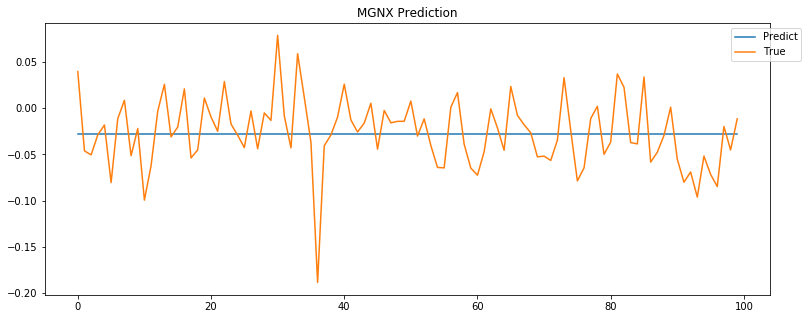

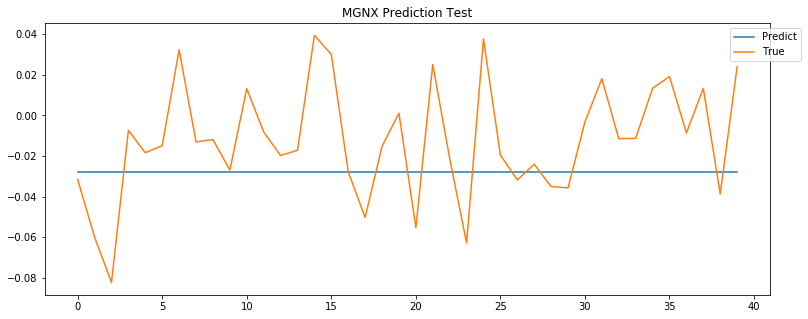

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


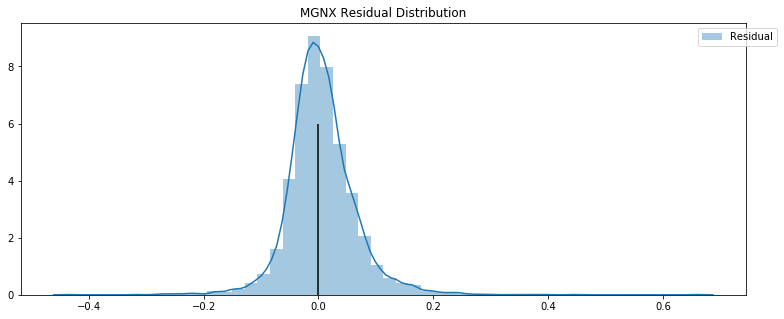

AKRO -302560030073786.7 -71.40937158666294


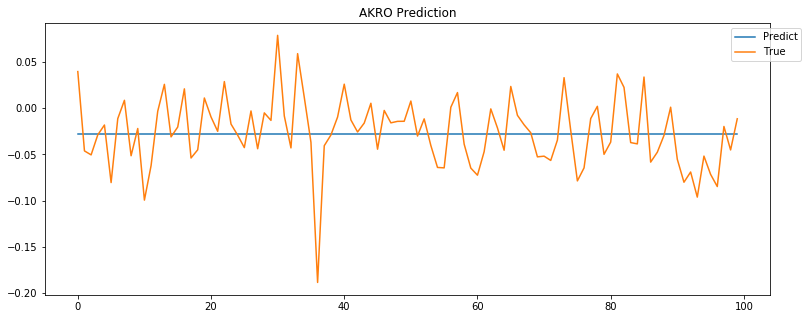

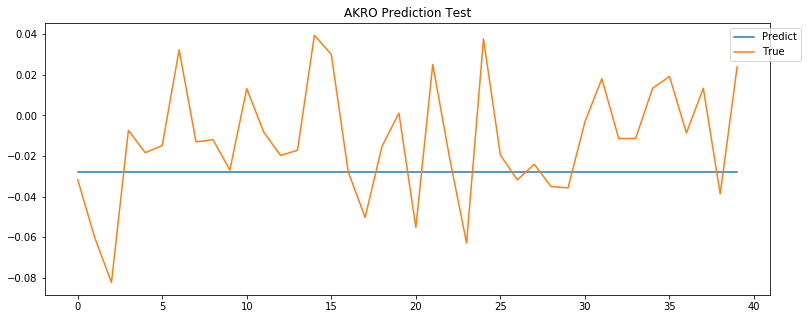

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


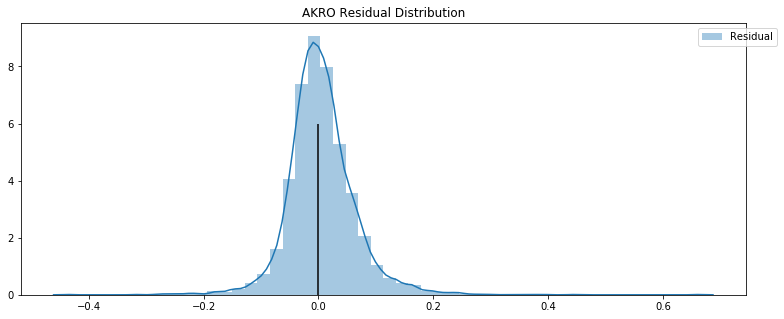

ESPR -302560030073786.7 -71.40937158666294


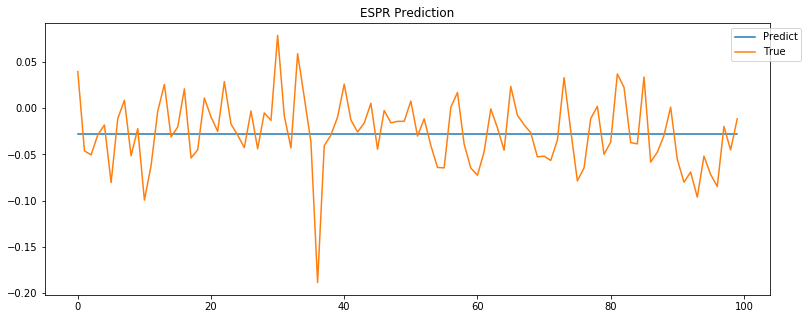

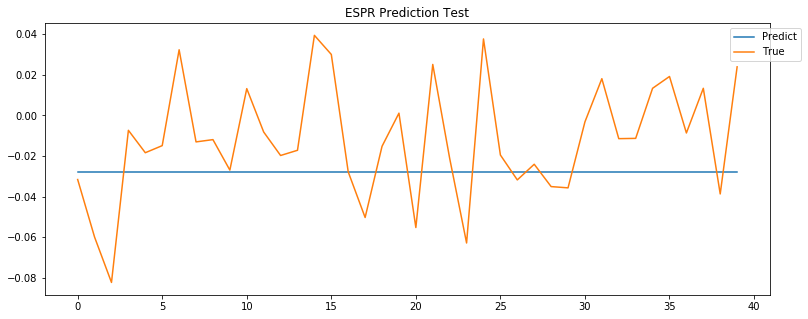

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


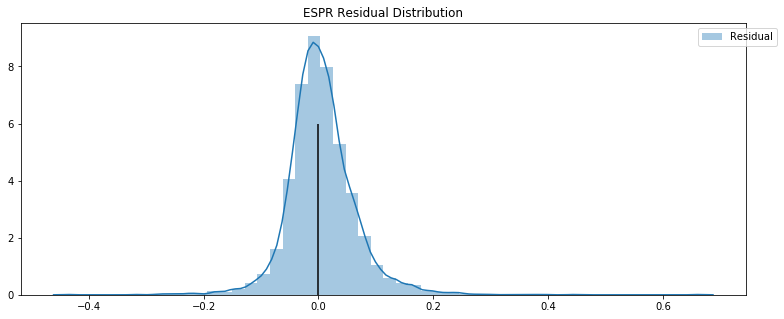

BHVN -302560030073786.7 -71.40937158666294


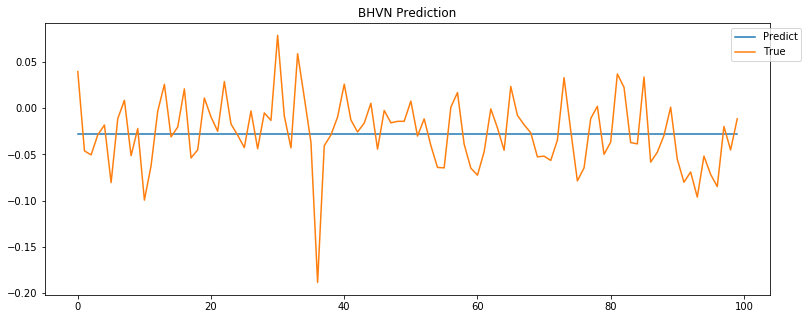

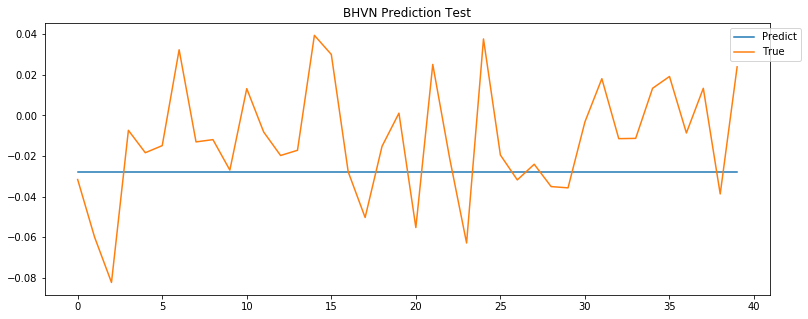

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


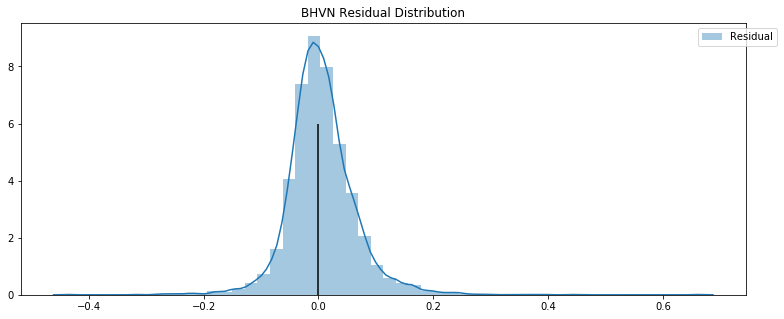

YMAB -302560030073786.7 -71.40937158666294


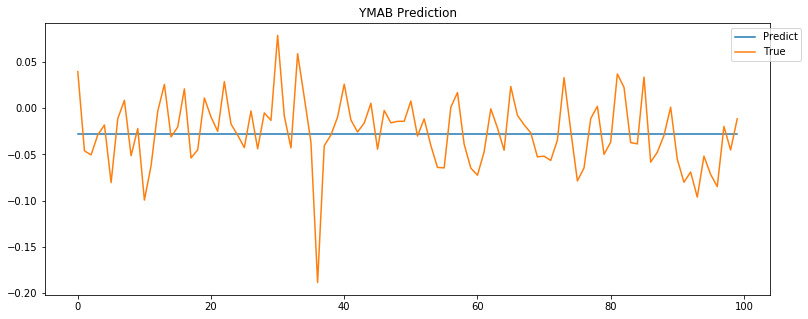

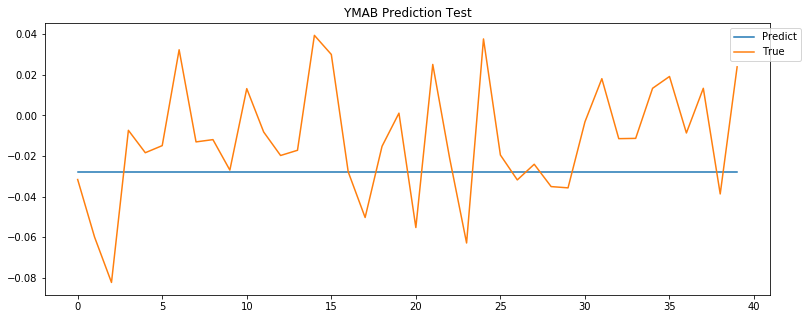

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


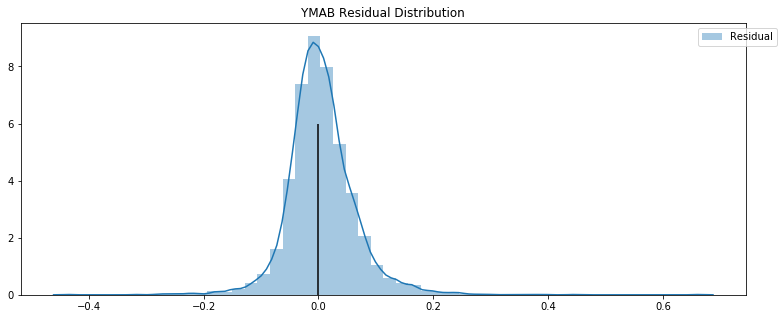

RGNX -302560030073786.7 -71.40937158666294


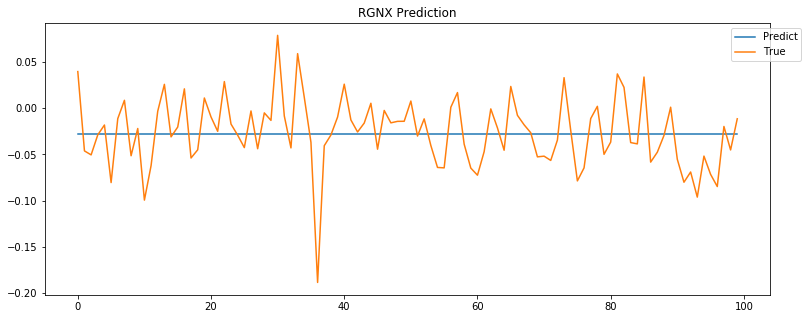

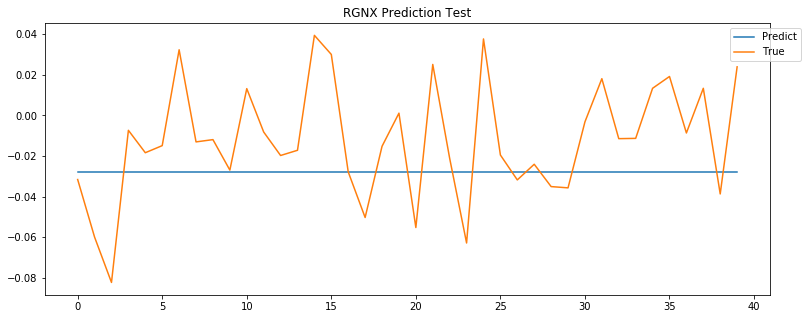

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


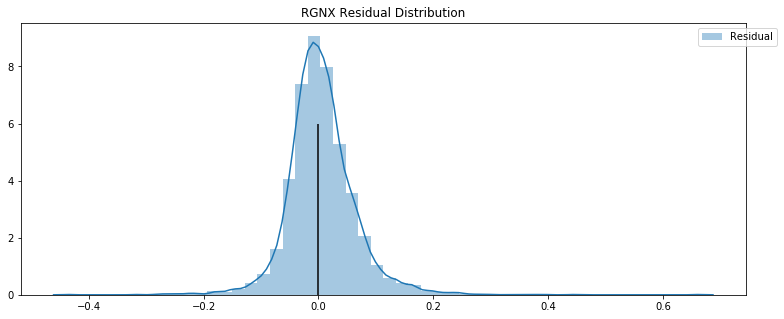

MYOK -302560030073786.7 -71.40937158666294


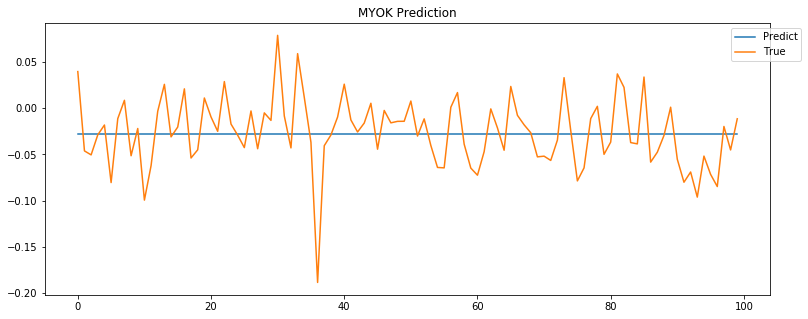

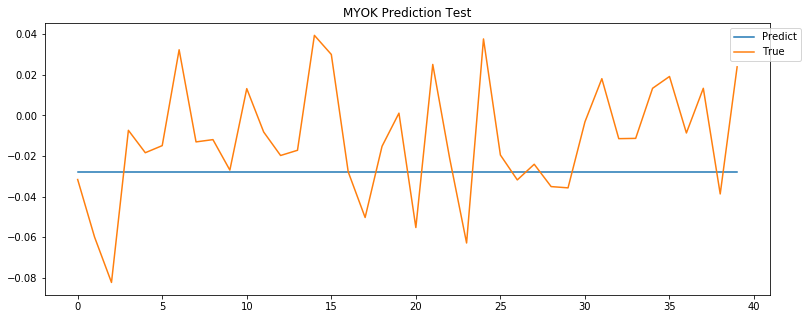

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


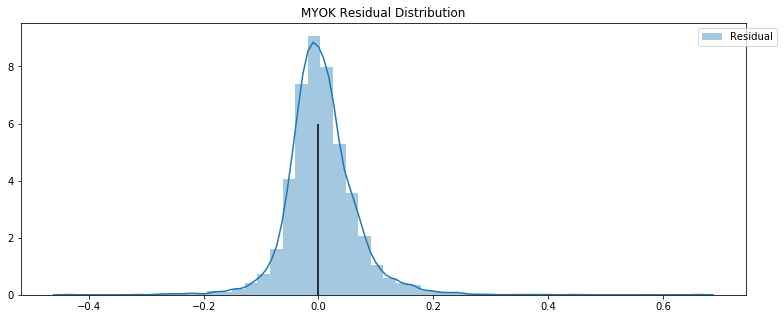

TPTX -302560030073786.7 -71.40937158666294


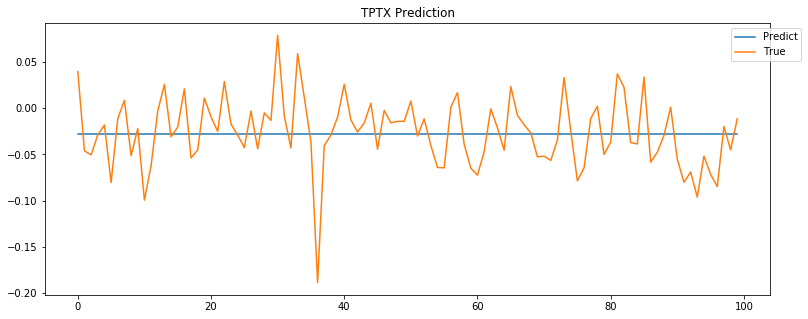

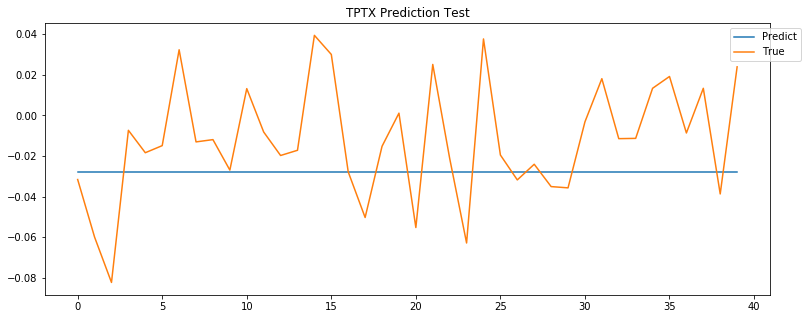

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


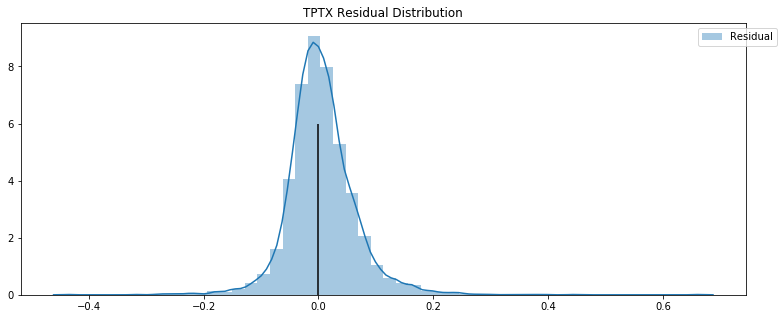

ATNX -302560030073786.7 -71.40937158666294


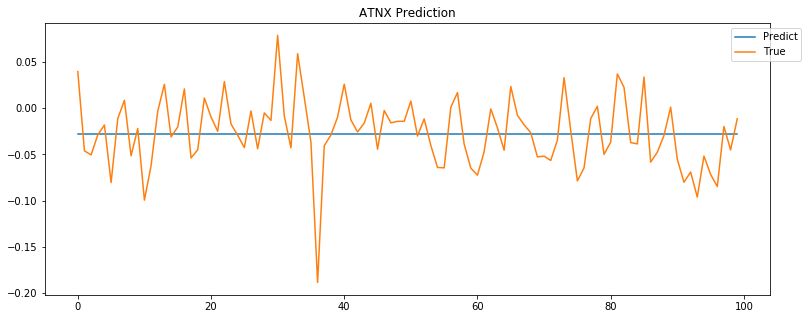

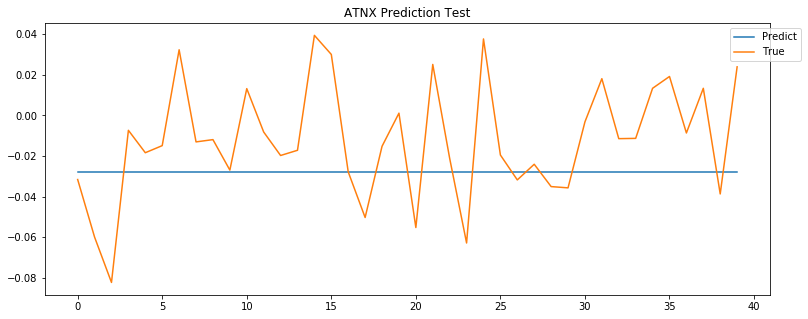

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


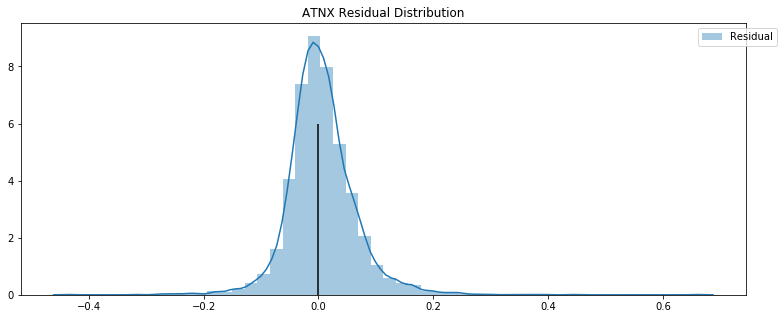

BLUE -302560030073786.7 -71.40937158666294


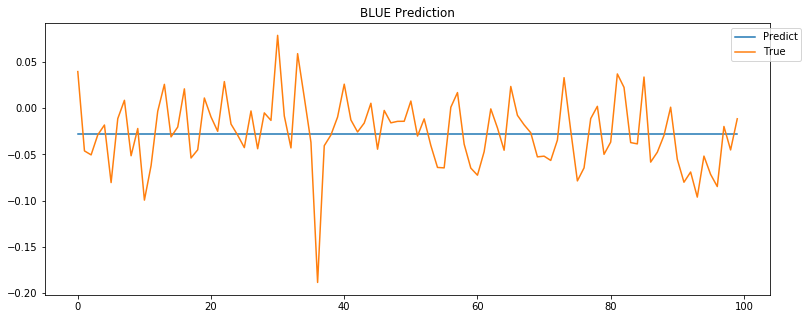

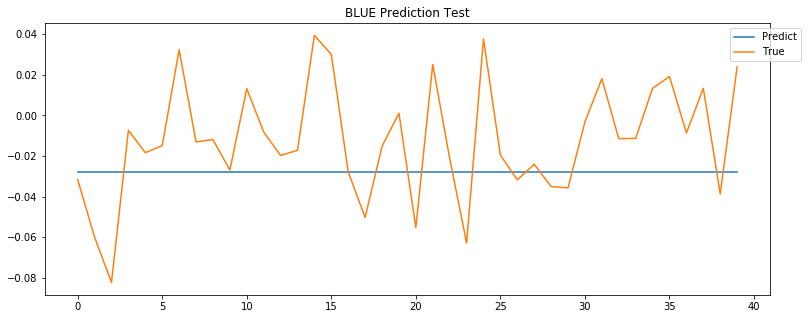

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


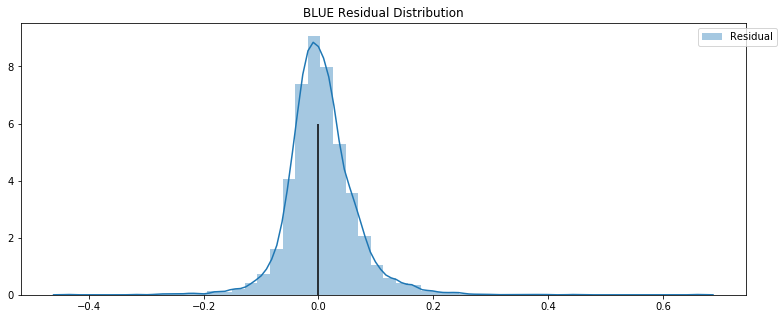

AGEN -302560030073786.7 -71.40937158666294


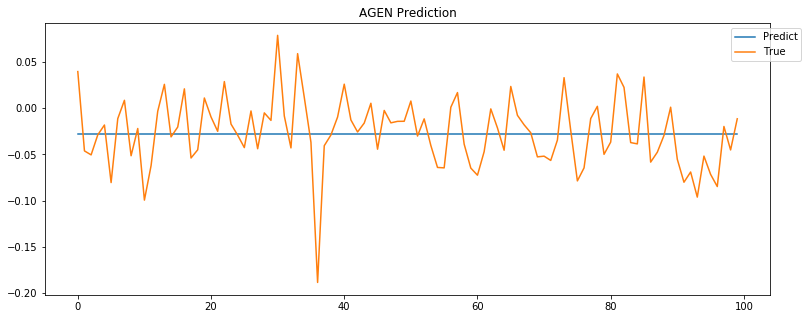

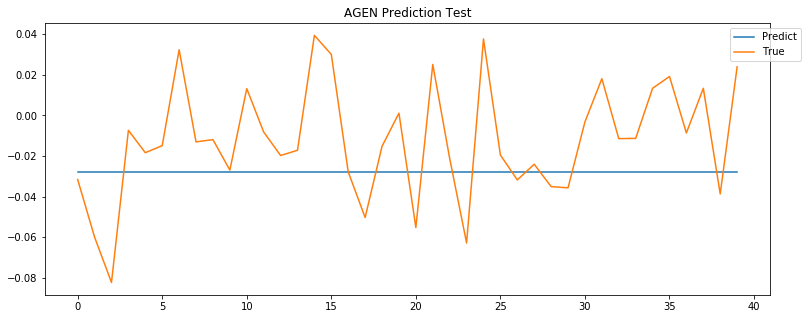

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


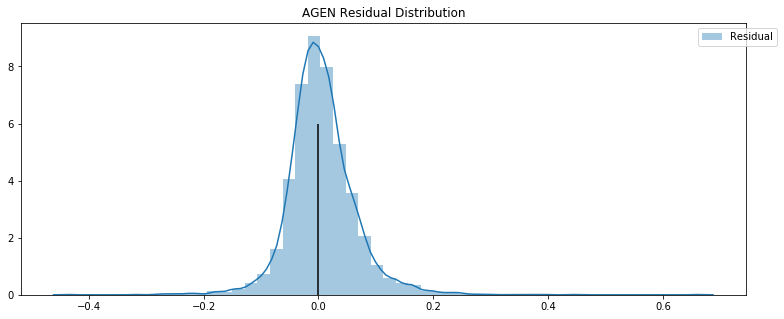

AVRO -302560030073786.7 -71.40937158666294


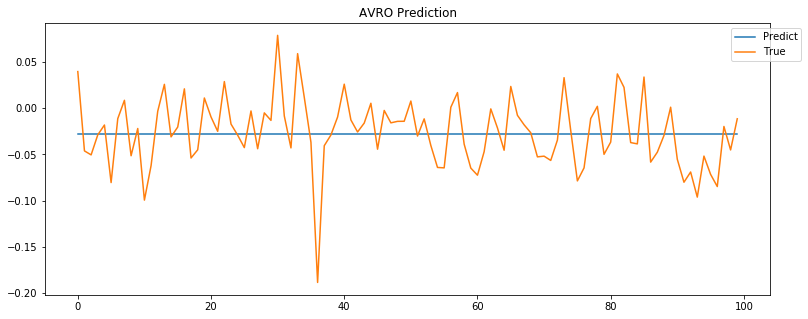

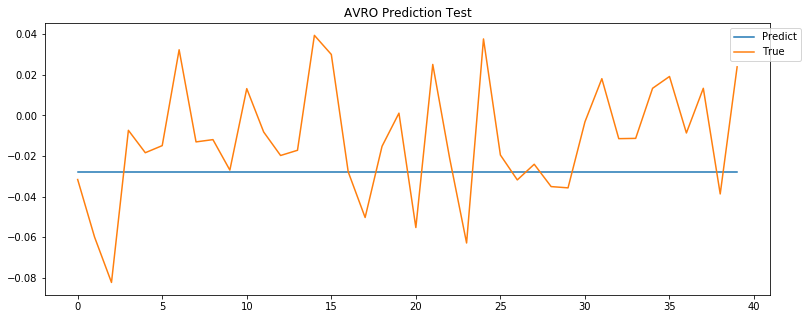

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


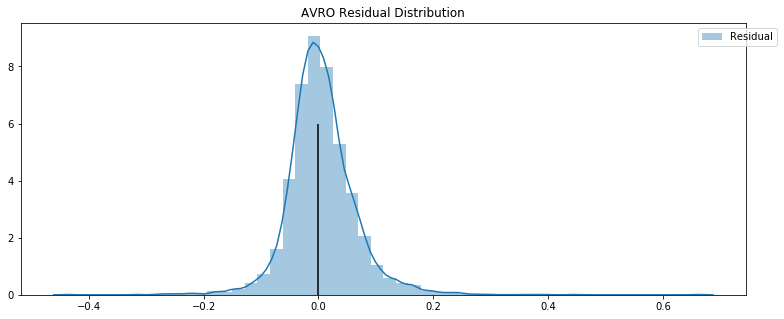

DCPH -302560030073786.7 -71.40937158666294


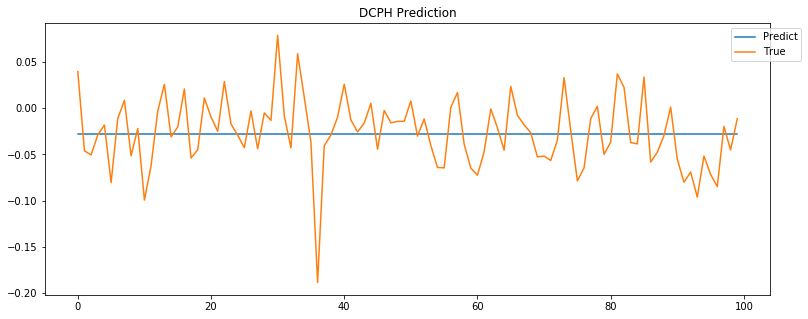

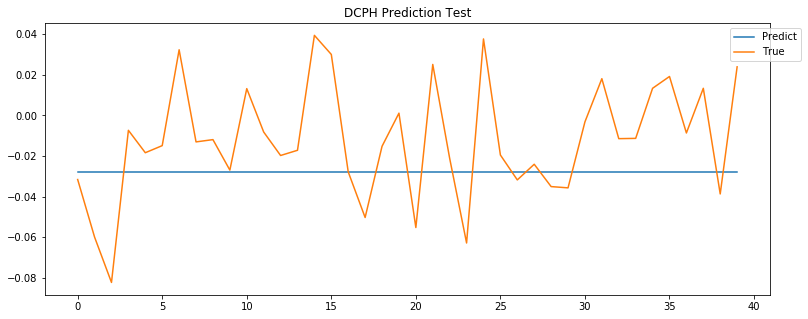

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


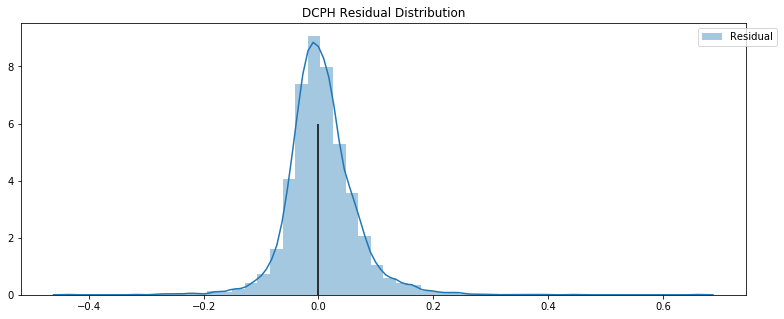

CTMX -302560030073786.7 -71.40937158666294


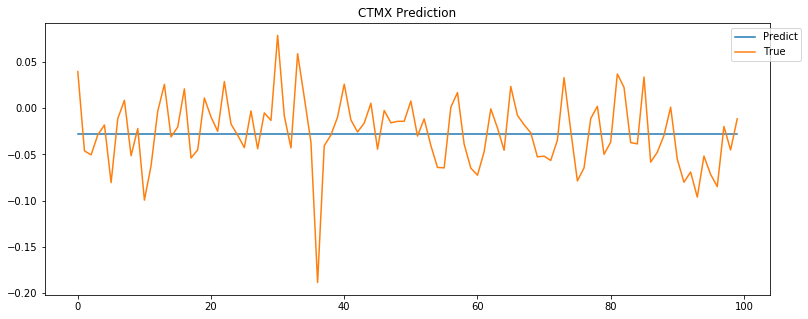

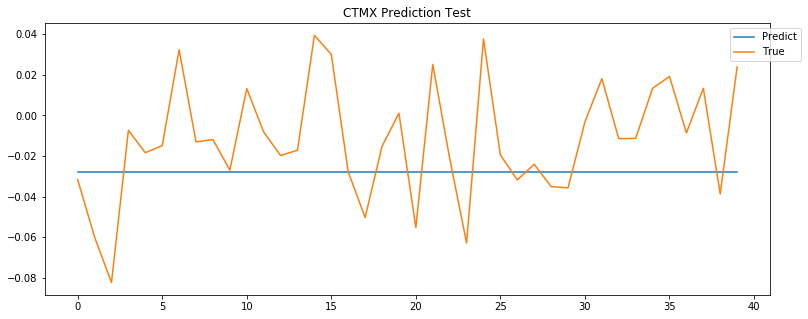

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


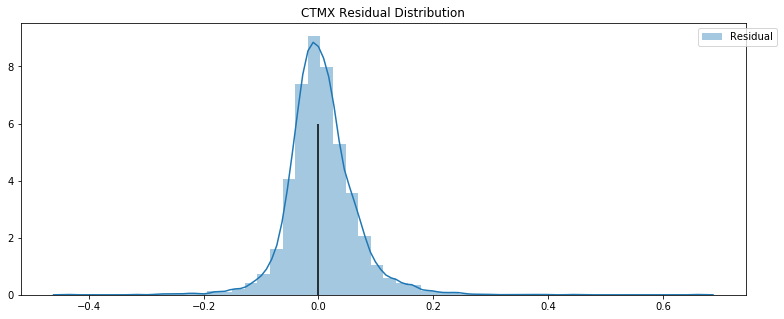

SRNE -302560030073786.7 -71.40937158666294


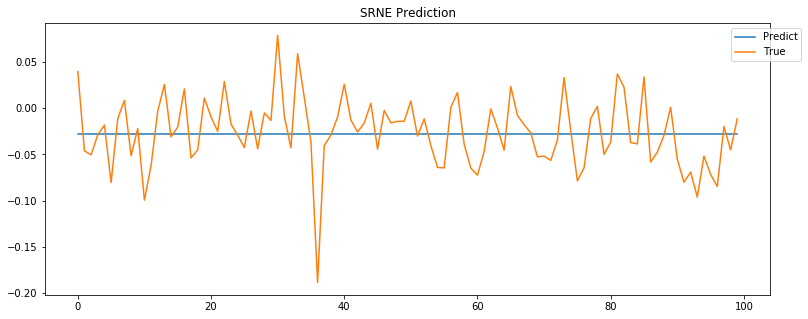

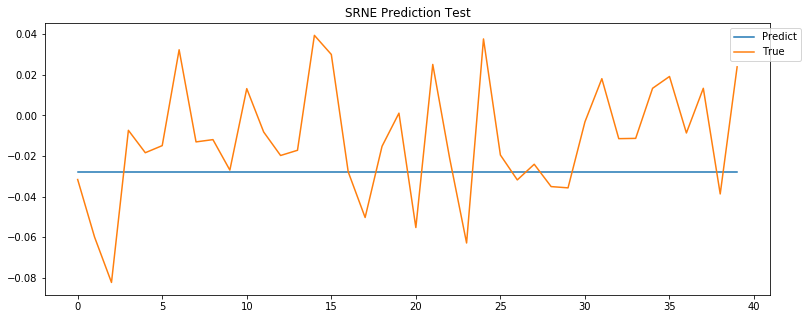

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


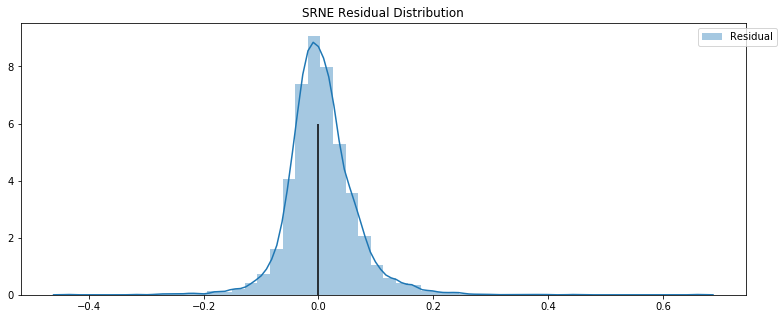

ARDX -302560030073786.7 -71.40937158666294


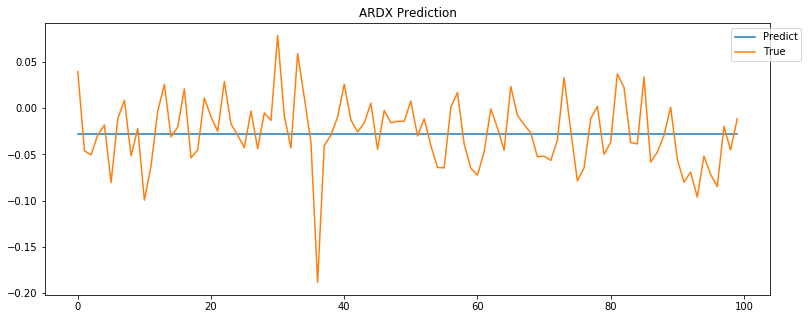

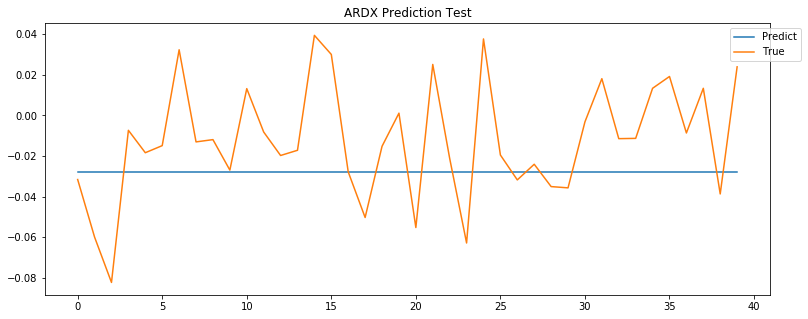

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


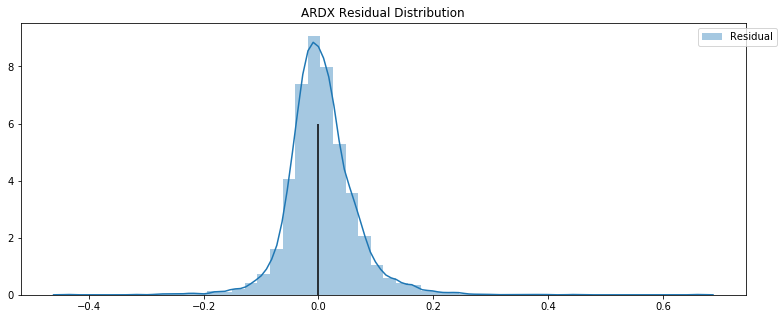

BCRX -302560030073786.7 -71.40937158666294


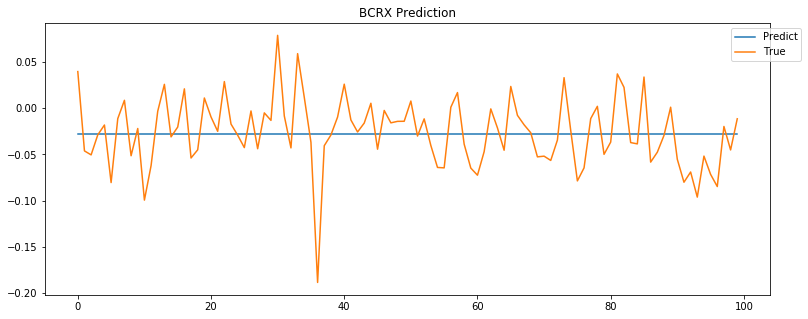

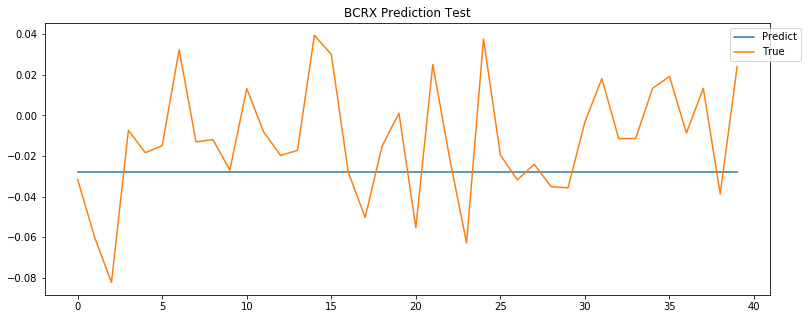

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


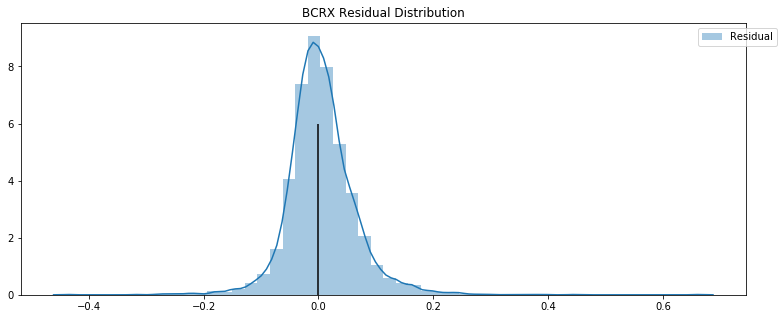

RETA -302560030073786.7 -71.40937158666294


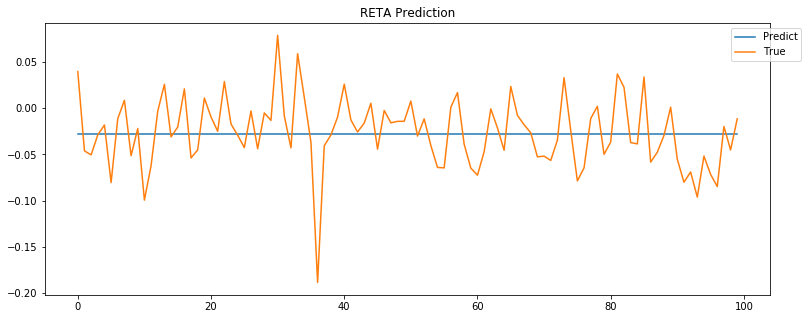

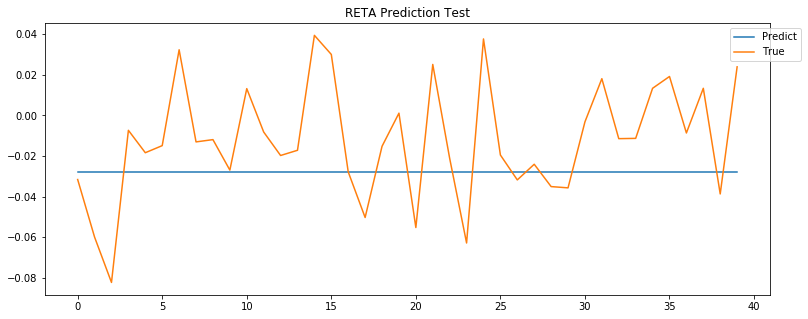

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


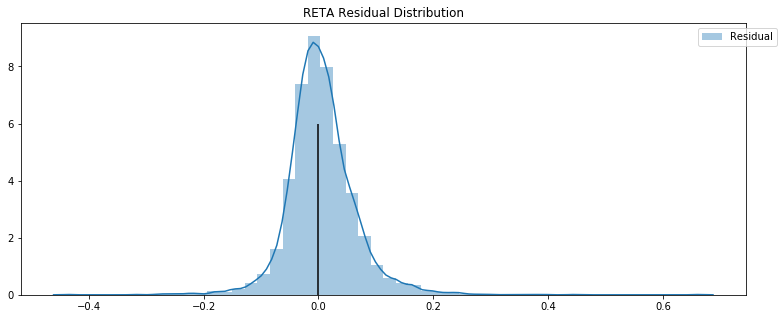

KOD -302560030073786.7 -71.40937158666294


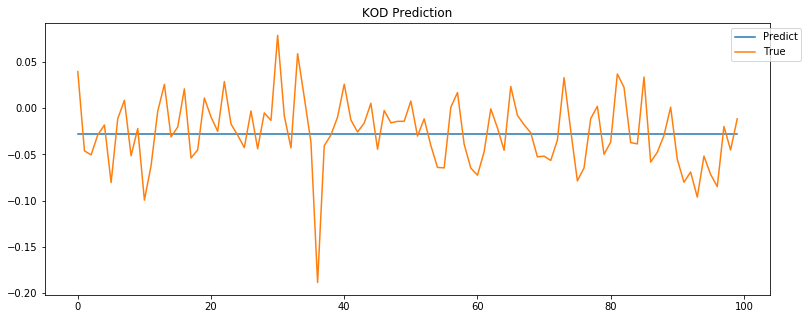

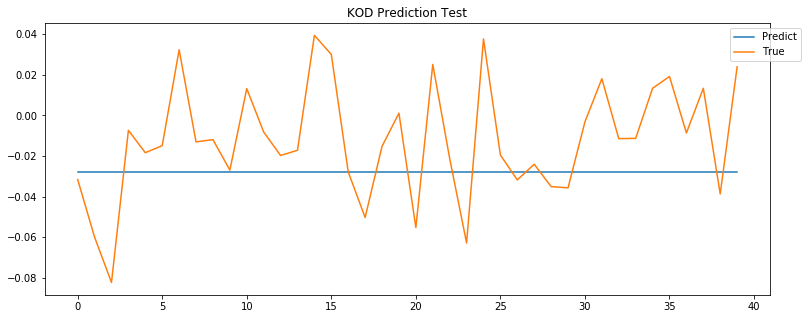

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


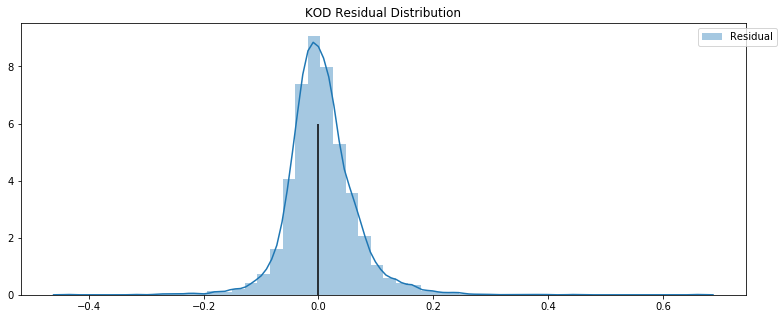

DTIL -302560030073786.7 -71.40937158666294


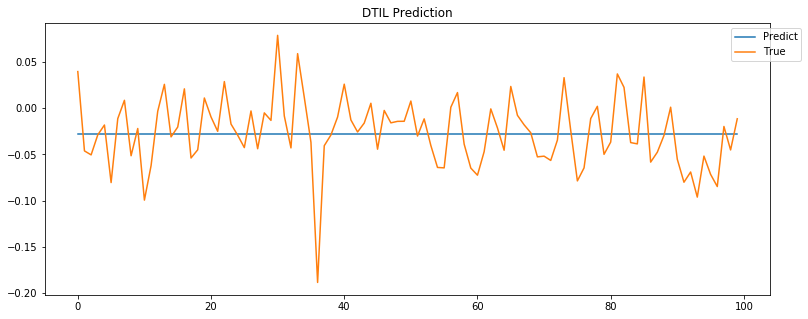

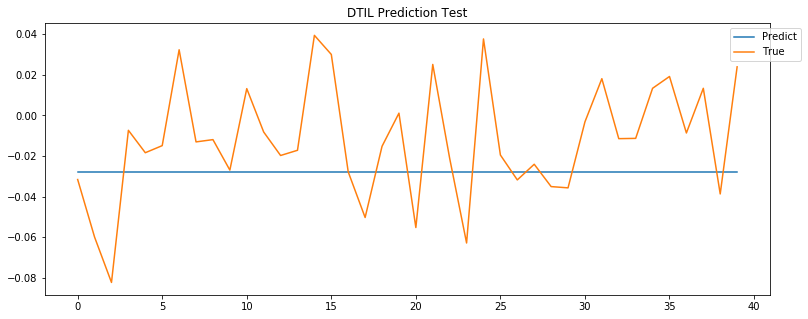

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


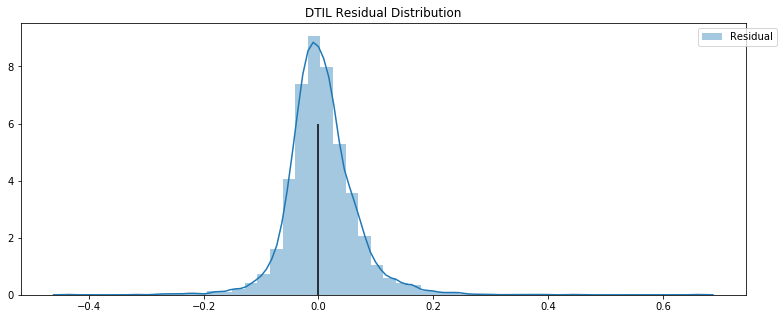

RARX -302560030073786.7 -71.40937158666294


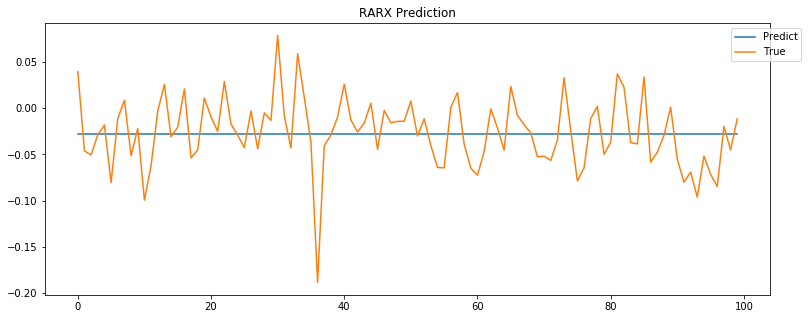

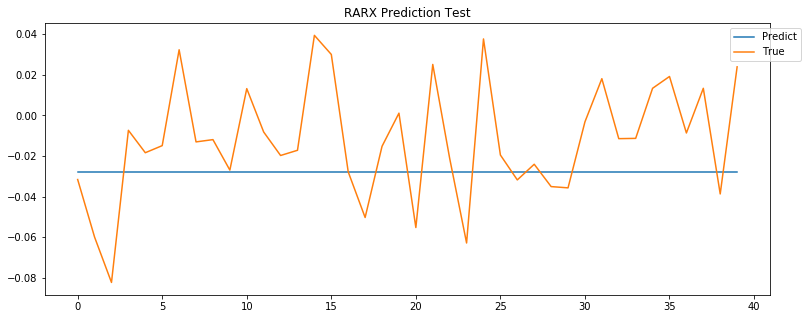

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


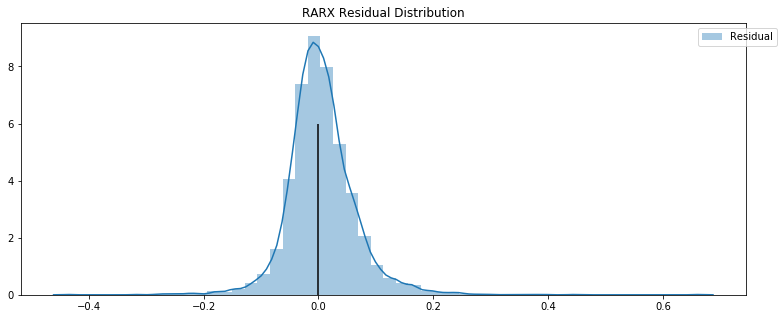

AUTL -302560030073786.7 -71.40937158666294


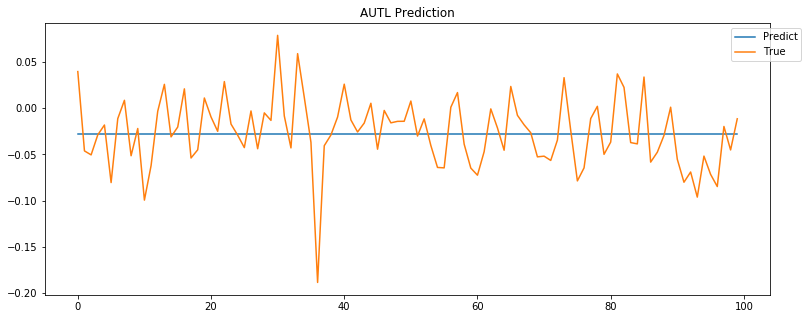

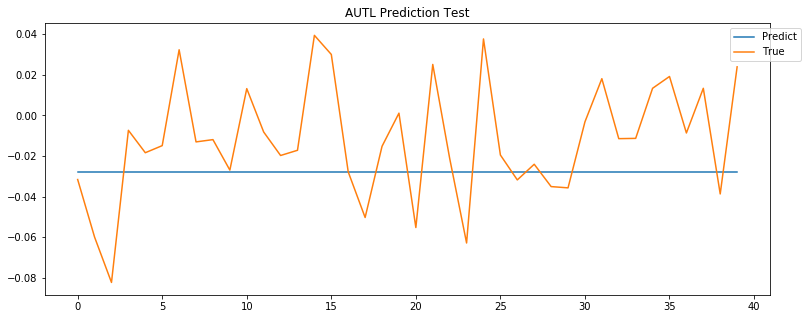

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


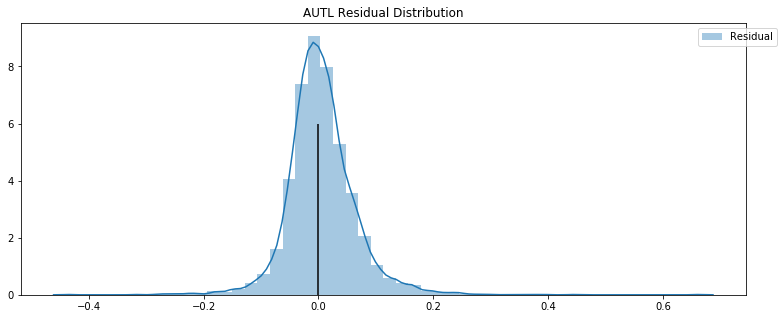

GTHX -302560030073786.7 -71.40937158666294


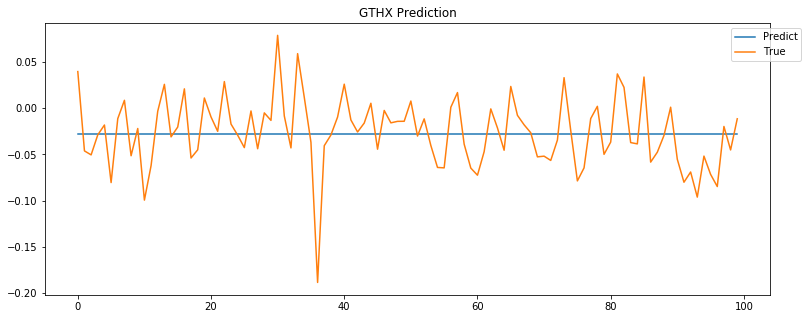

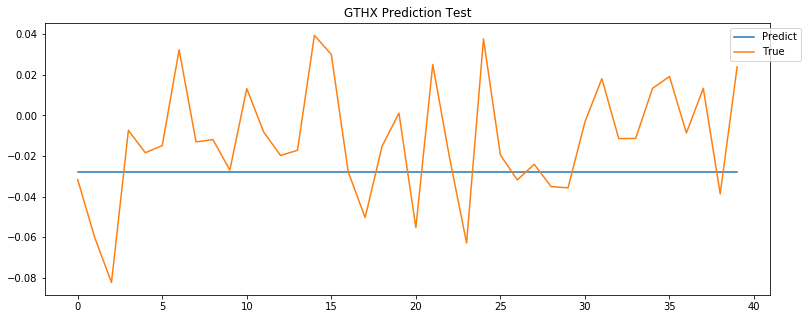

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


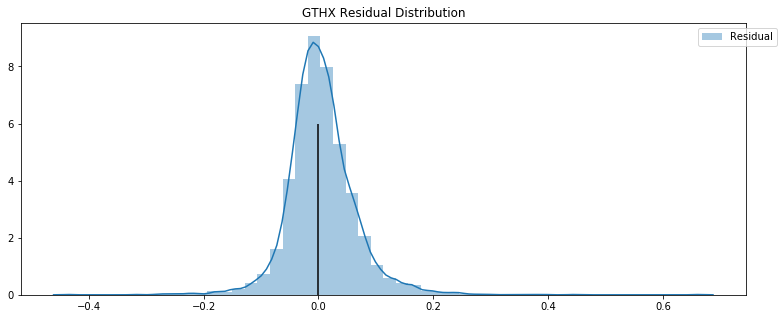

CARA -302560030073786.7 -71.40937158666294


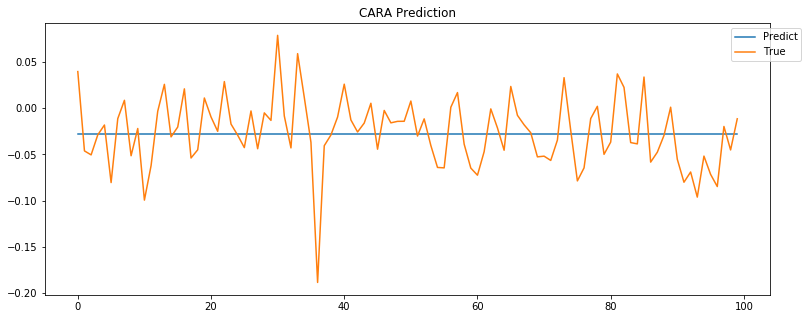

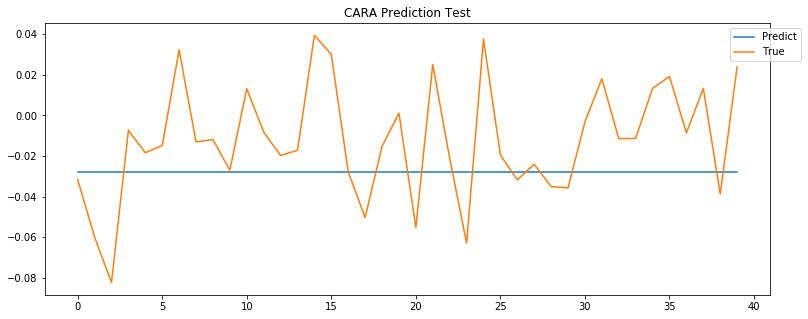

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


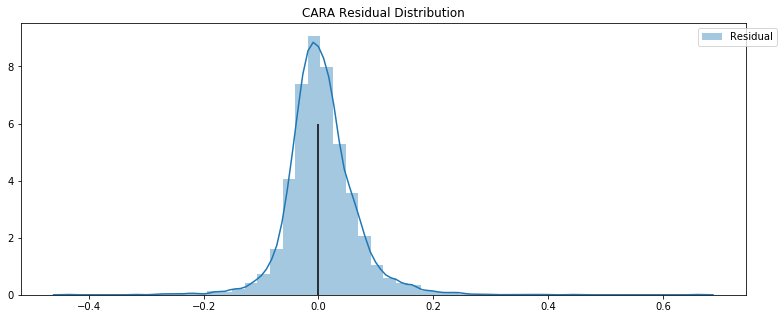

KDMN -302560030073786.7 -71.40937158666294


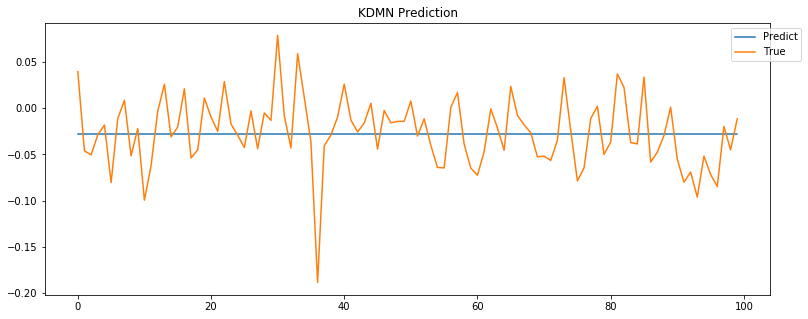

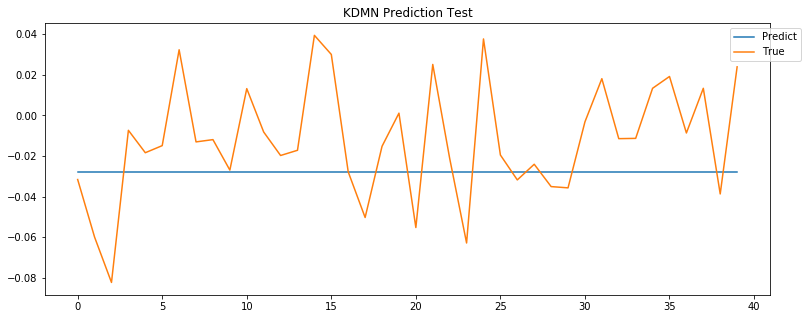

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


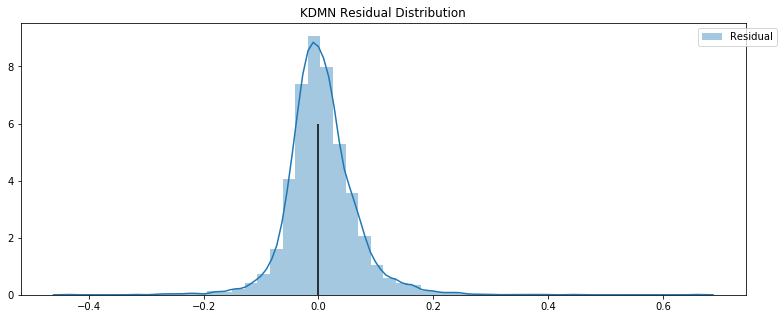

XNCR -302560030073786.7 -71.40937158666294


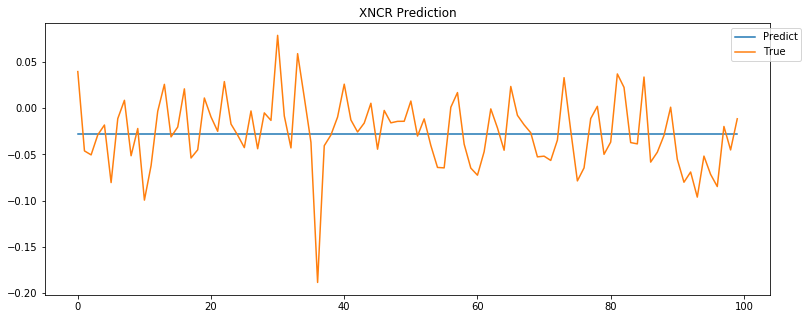

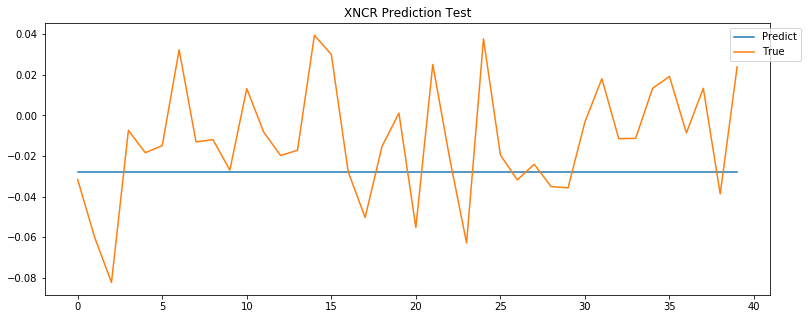

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


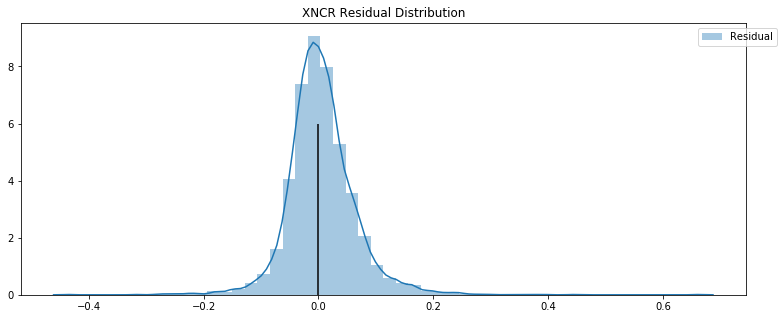

ACHN -302560030073786.7 -71.40937158666294


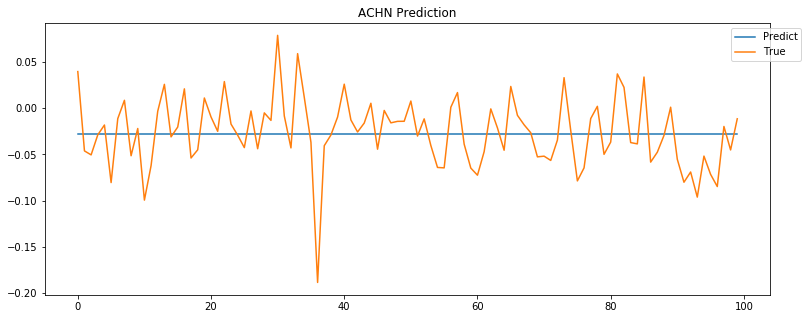

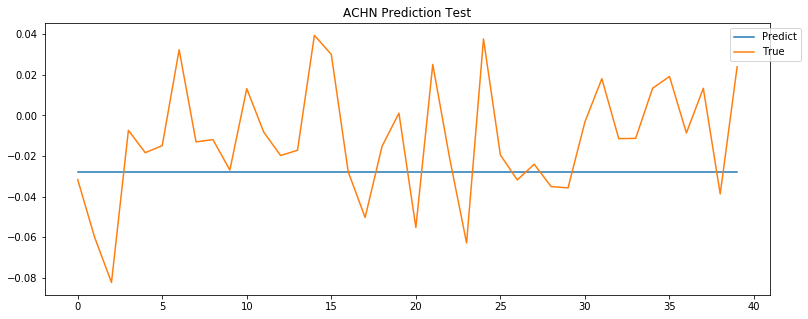

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


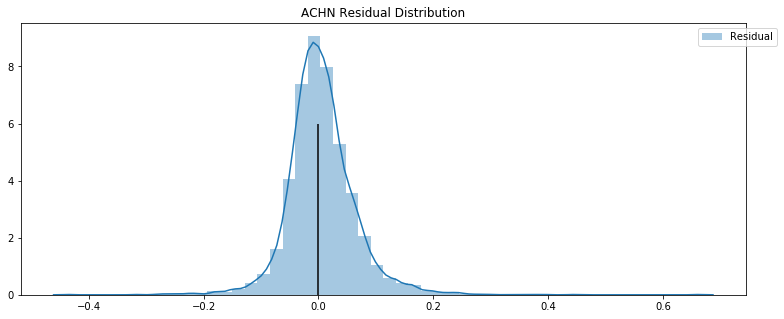

ARNA -302560030073786.7 -71.40937158666294


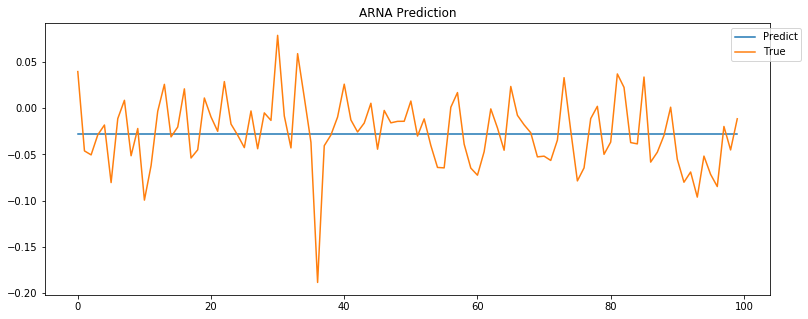

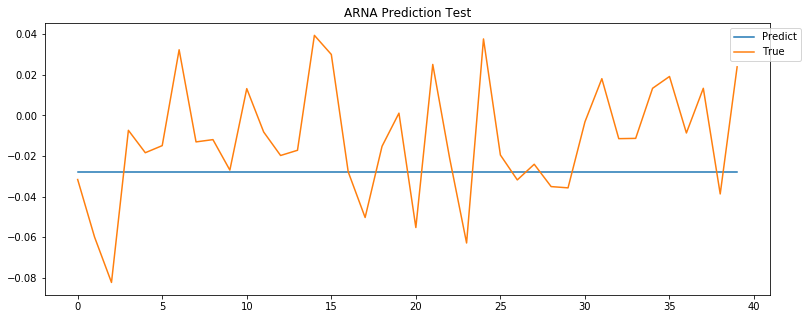

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


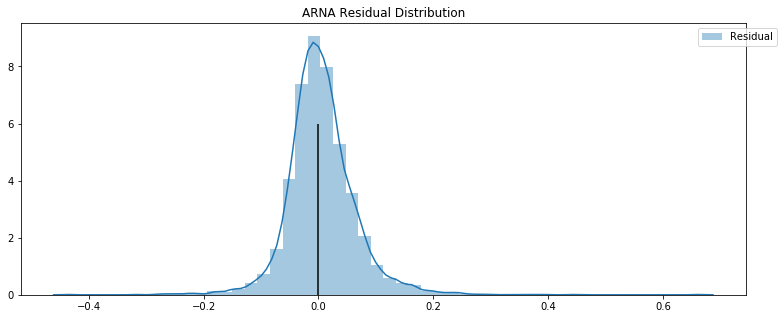

RCKT -302560030073786.7 -71.40937158666294


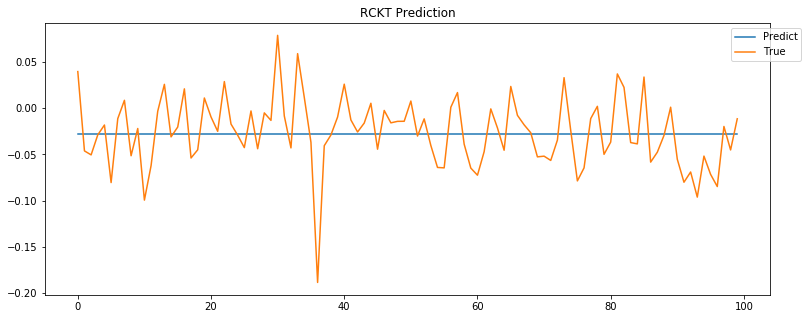

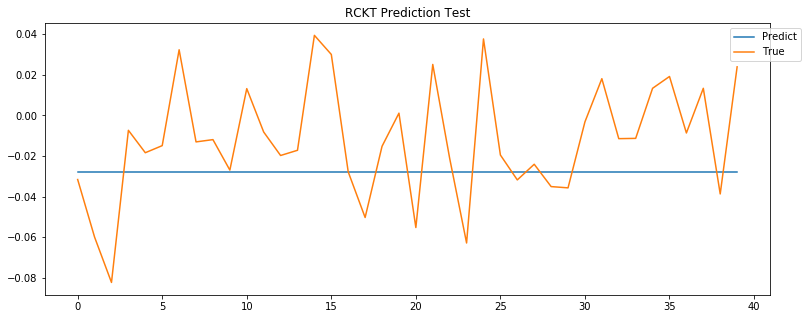

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


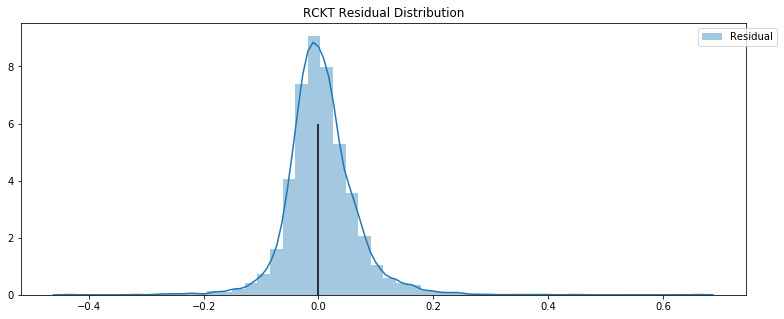

TBIO -302560030073786.7 -71.40937158666294


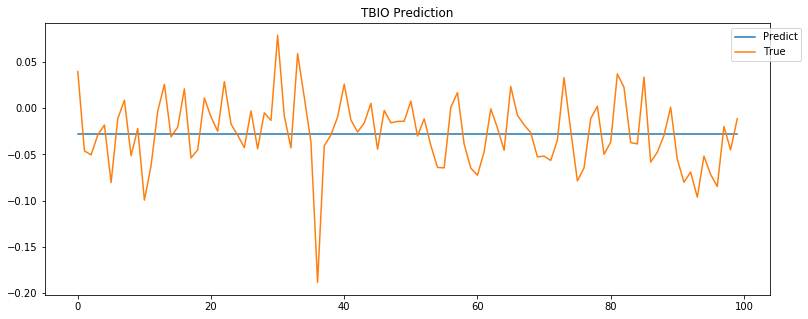

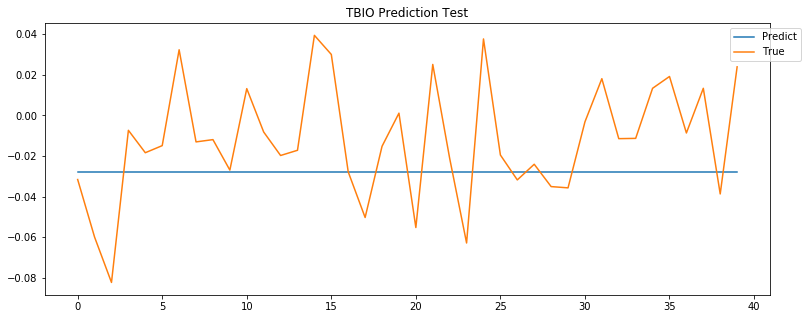

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


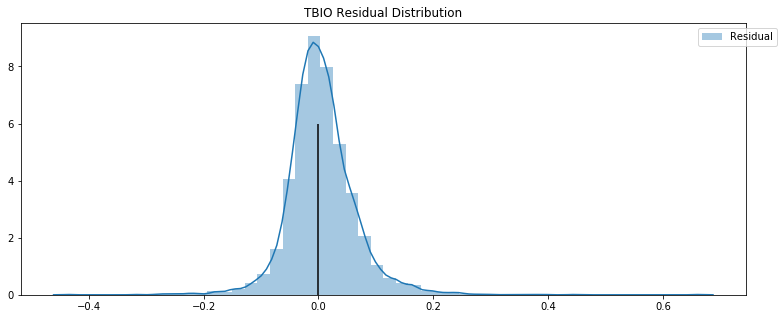

VYGR -302560030073786.7 -71.40937158666294


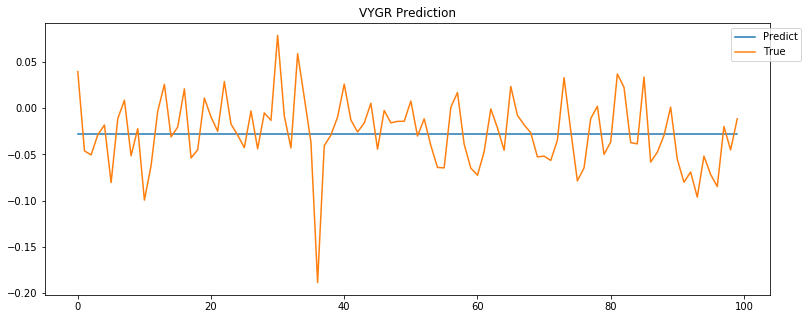

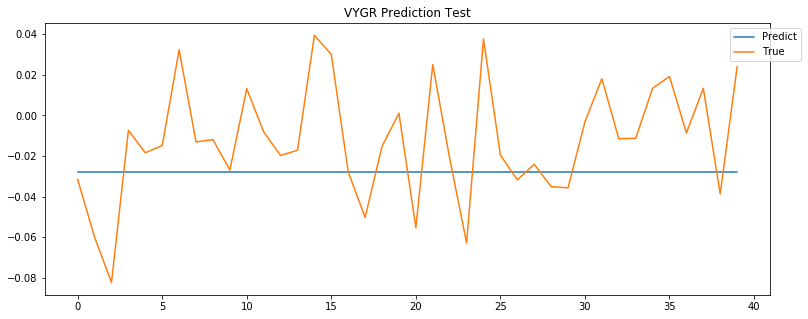

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


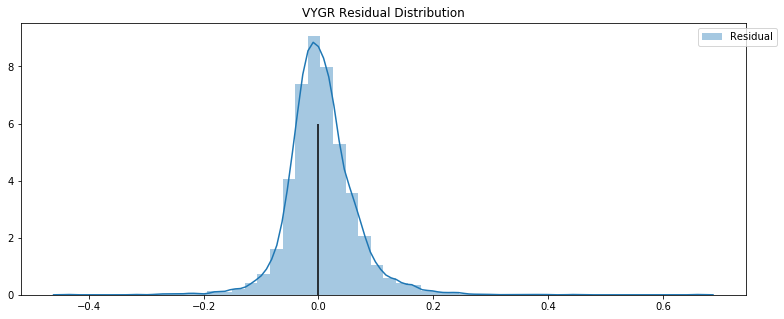

SGMO -302560030073786.7 -71.40937158666294


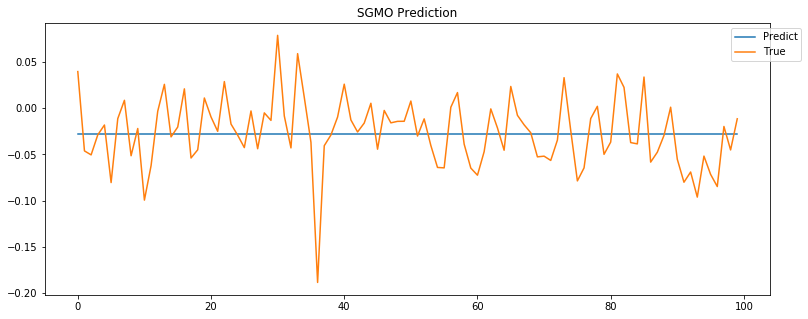

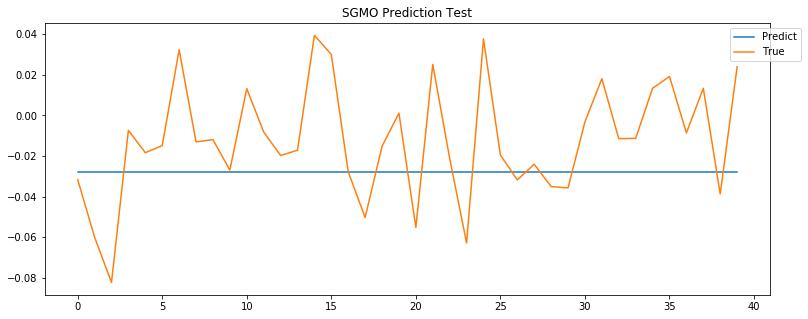

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


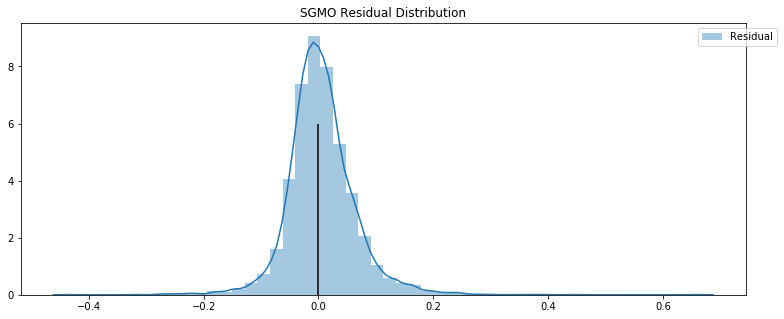

ODT -302560030073786.7 -71.40937158666294


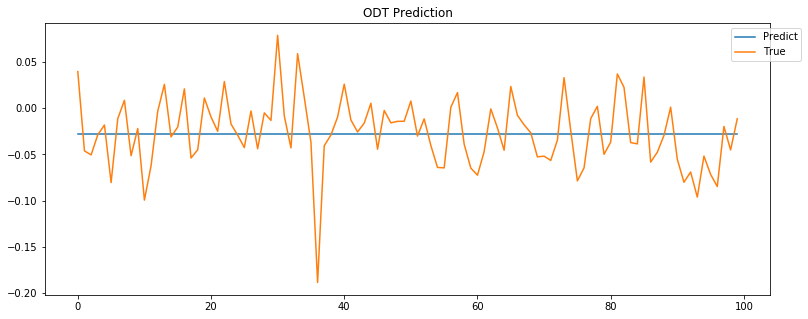

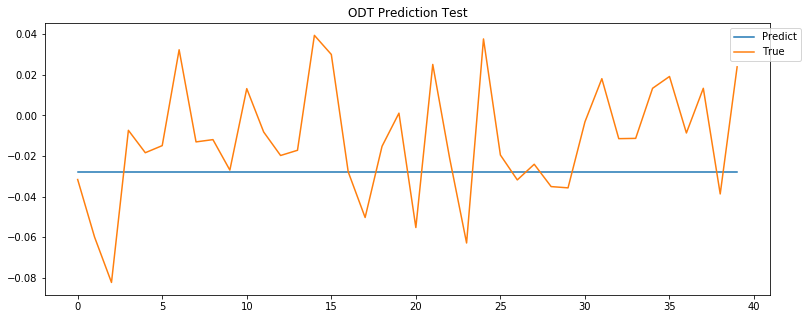

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


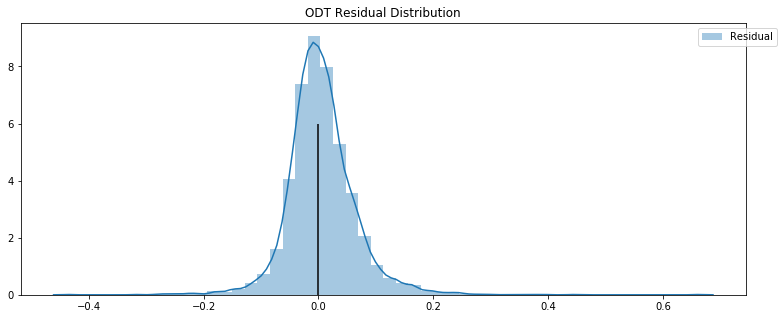

ANAB -302560030073786.7 -71.40937158666294


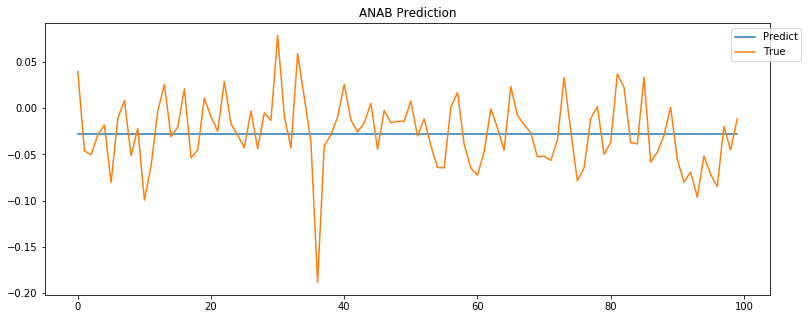

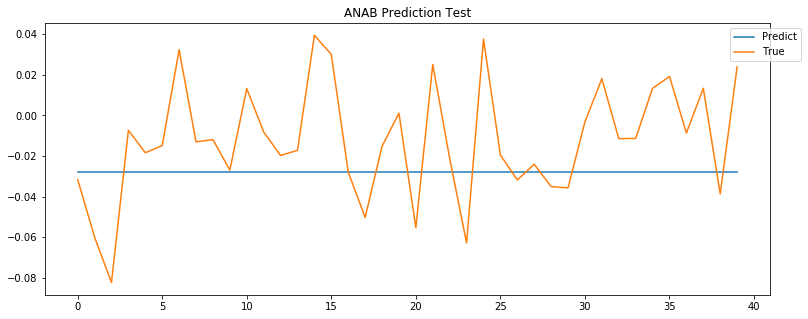

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


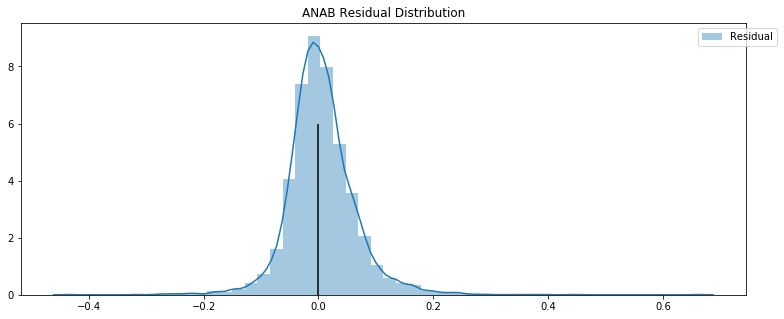

ATRA -302560030073786.7 -71.40937158666294


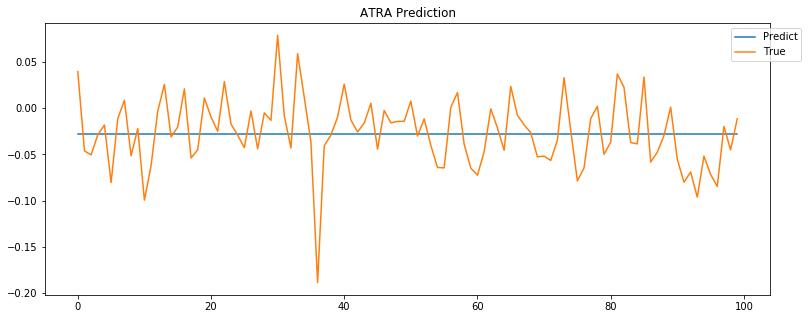

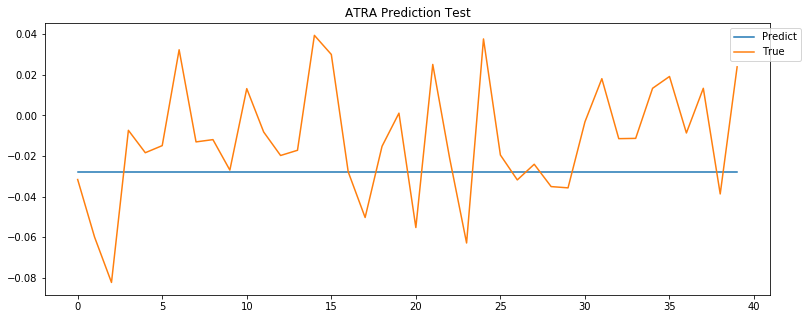

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


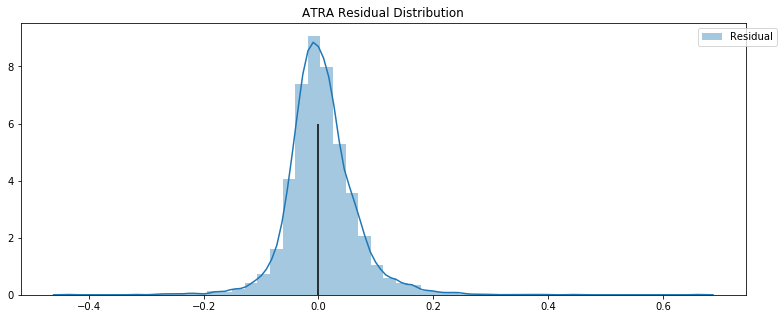

CNST -302560030073786.7 -71.40937158666294


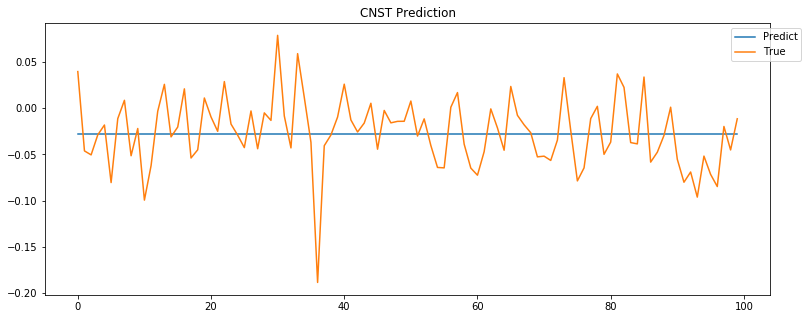

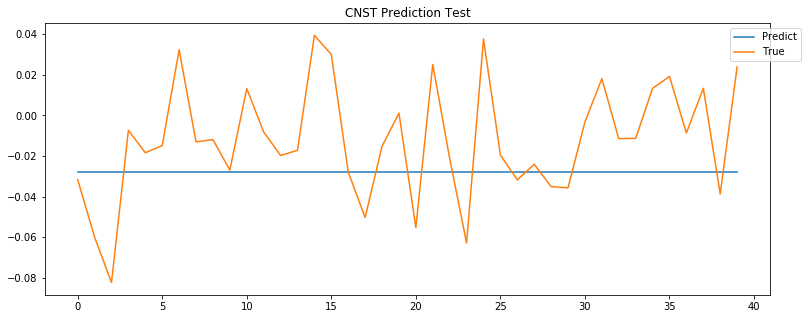

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


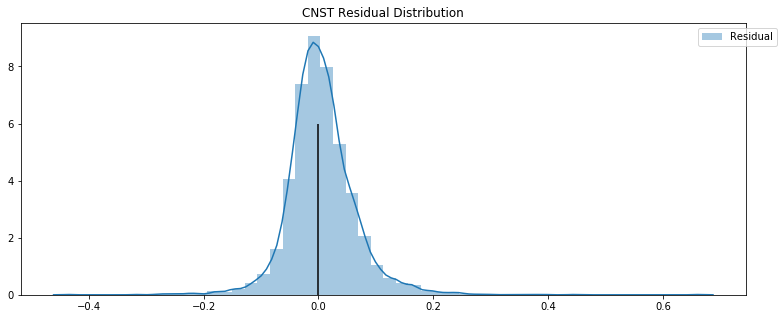

GERN -302560030073786.7 -71.40937158666294


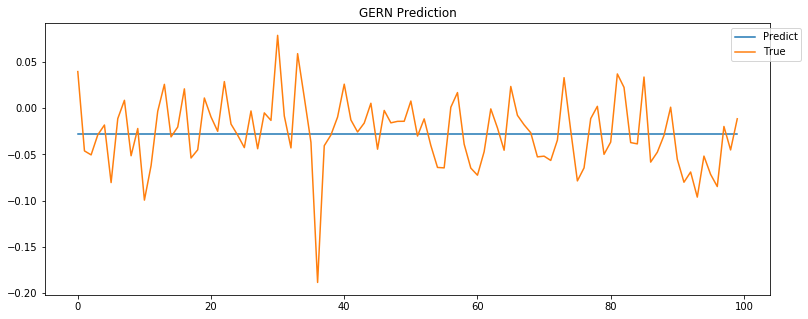

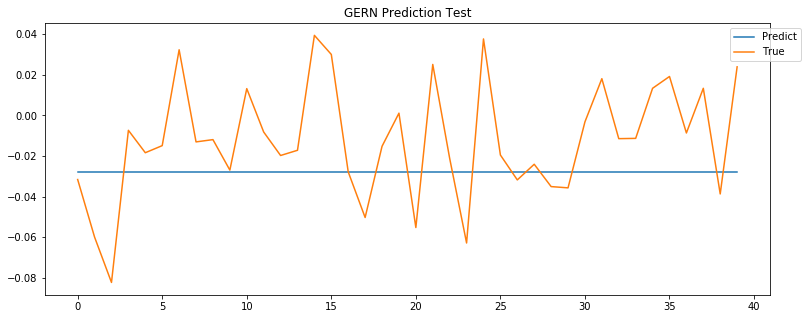

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


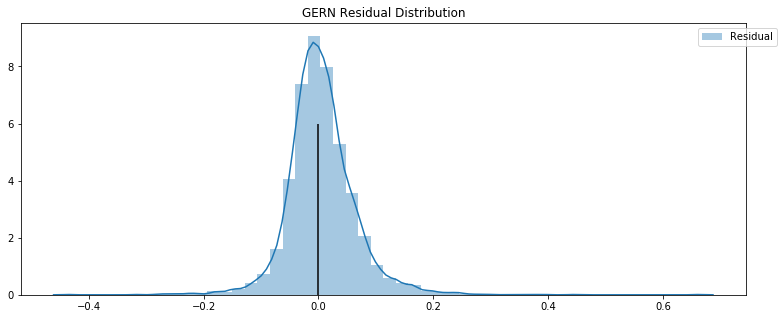

BPMC -302560030073786.7 -71.40937158666294


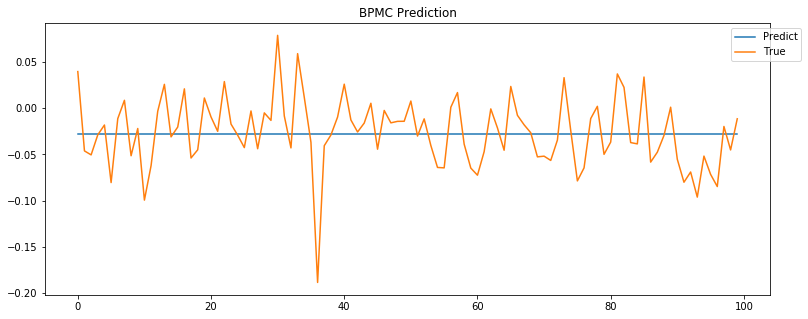

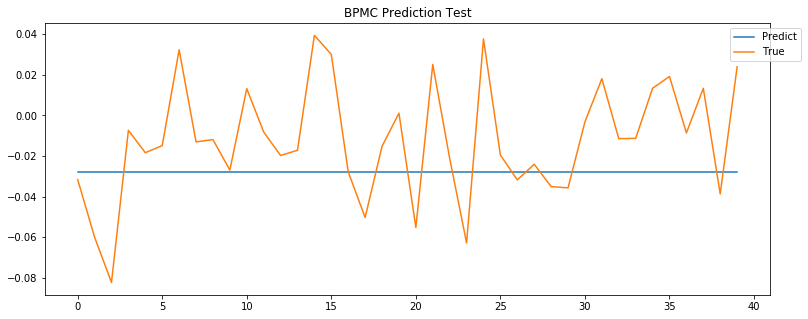

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


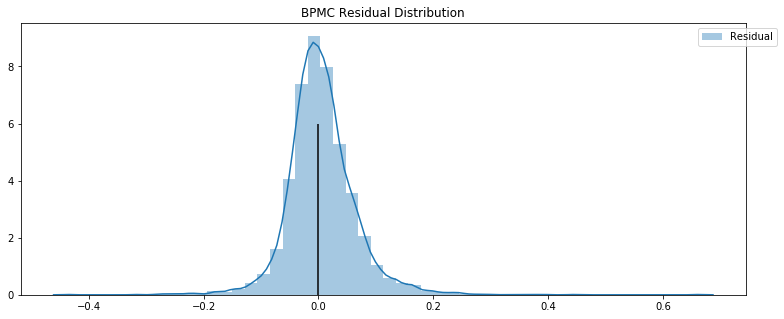

ALLO -302560030073786.7 -71.40937158666294


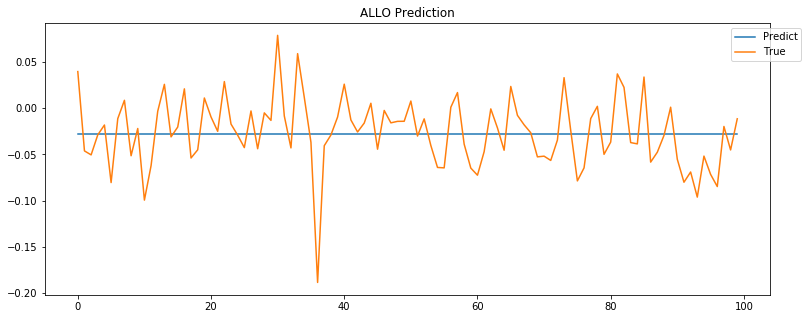

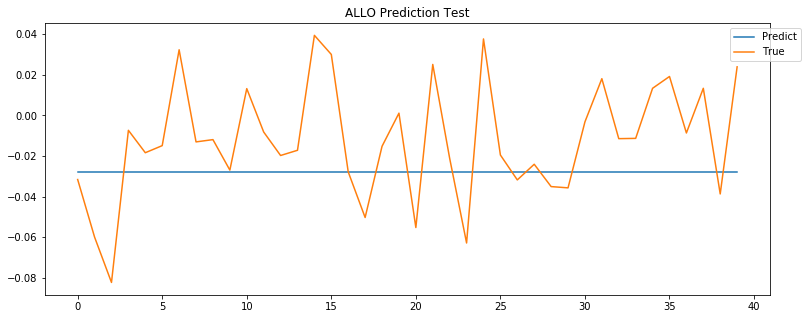

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


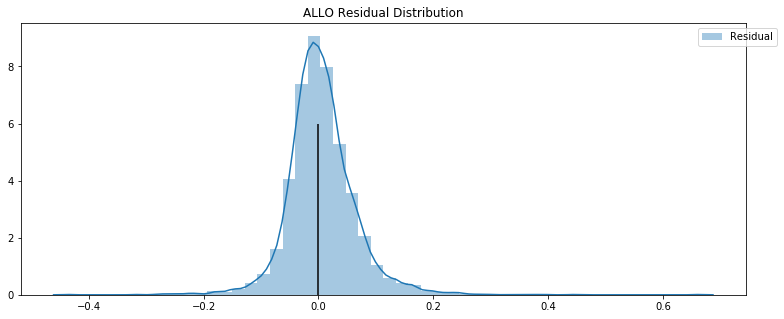

BBIO -302560030073786.7 -71.40937158666294


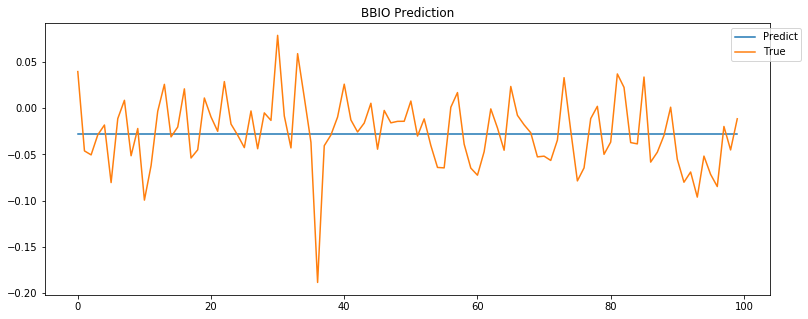

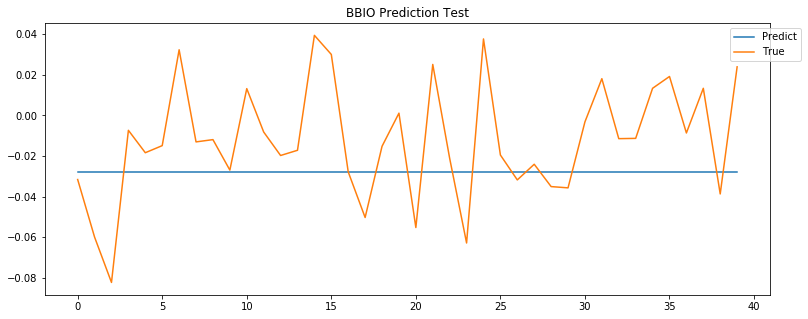

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


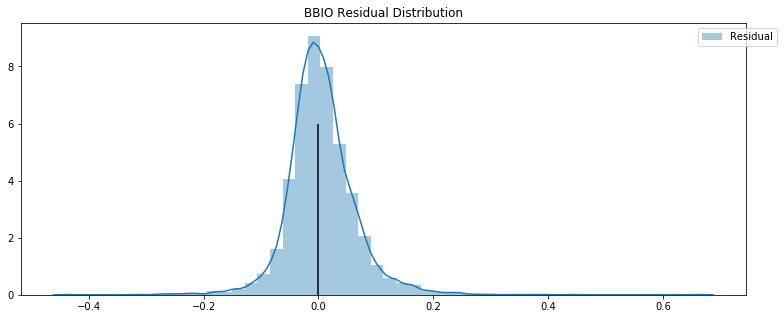

FGEN -302560030073786.7 -71.40937158666294


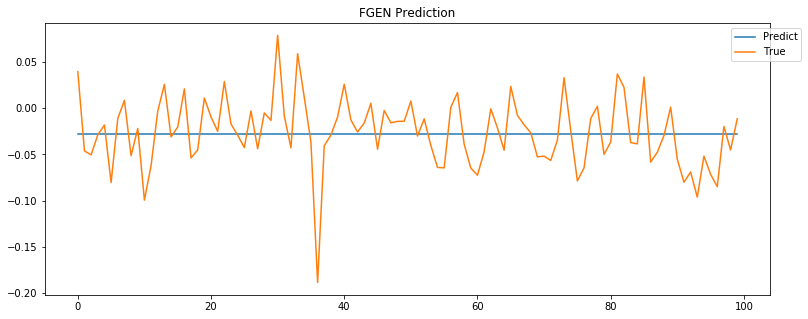

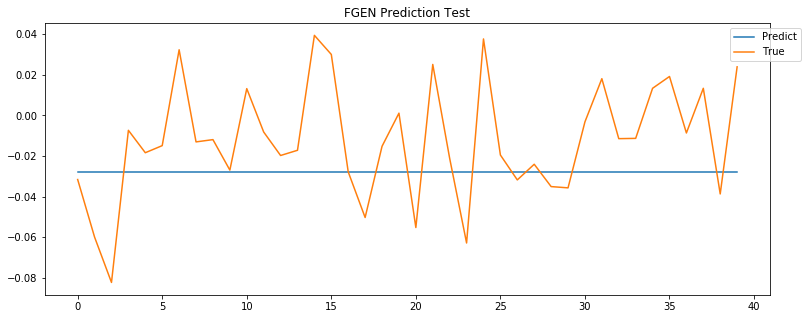

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


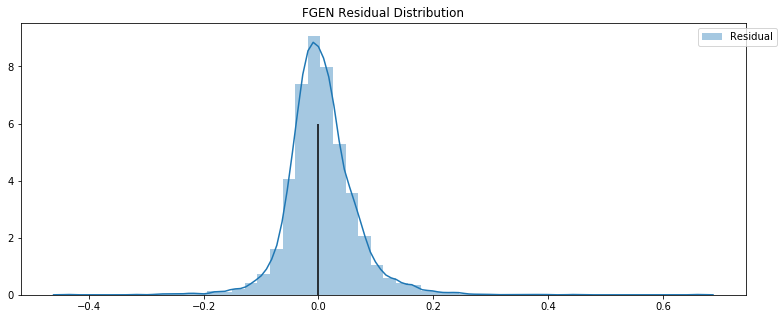

PGNX -302560030073786.7 -71.40937158666294


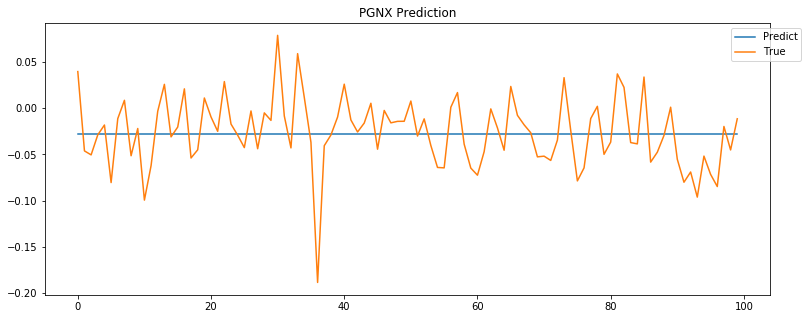

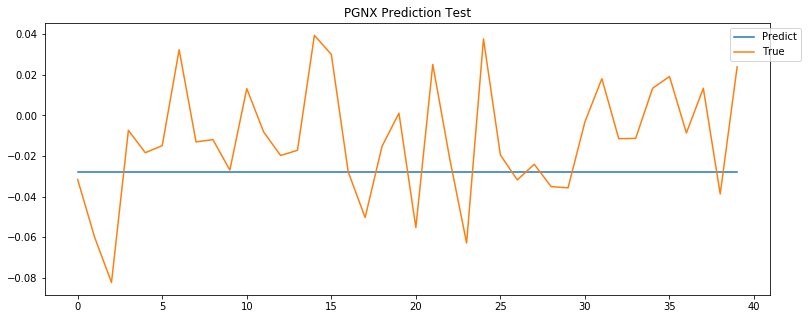

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


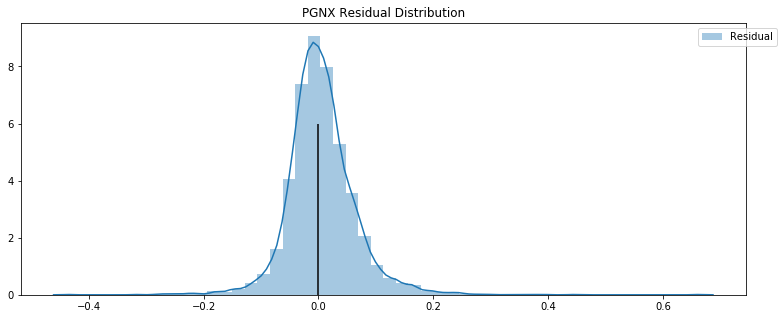

MGTX -302560030073786.7 -71.40937158666294


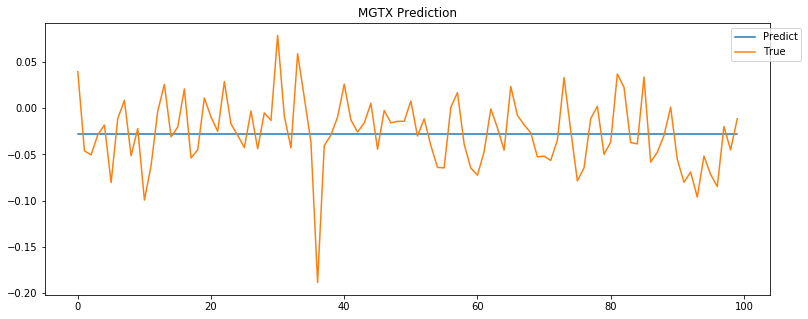

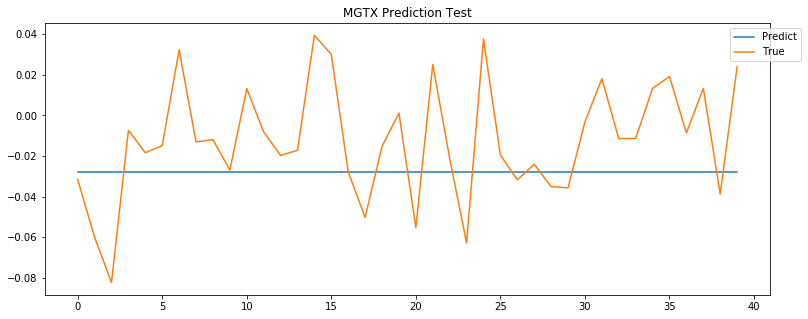

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


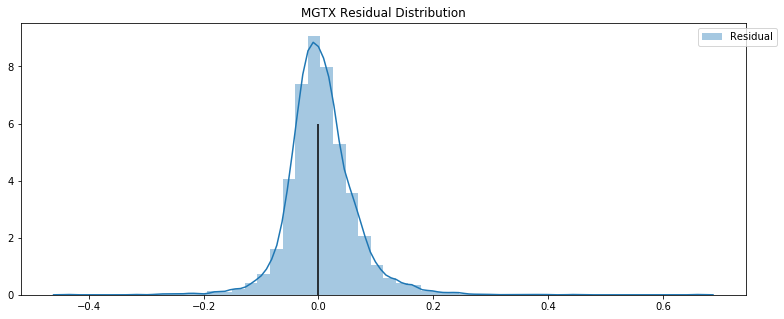

NXTC -302560030073786.7 -71.40937158666294


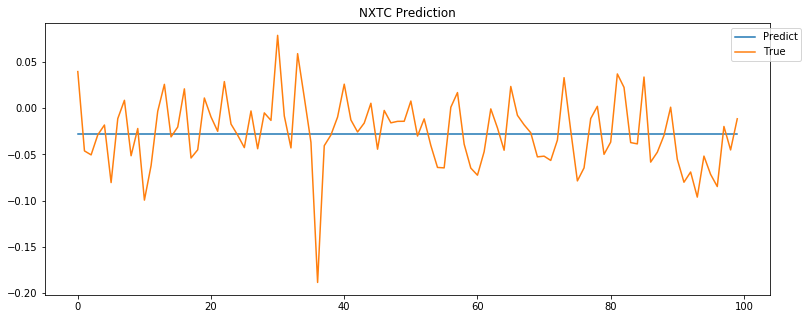

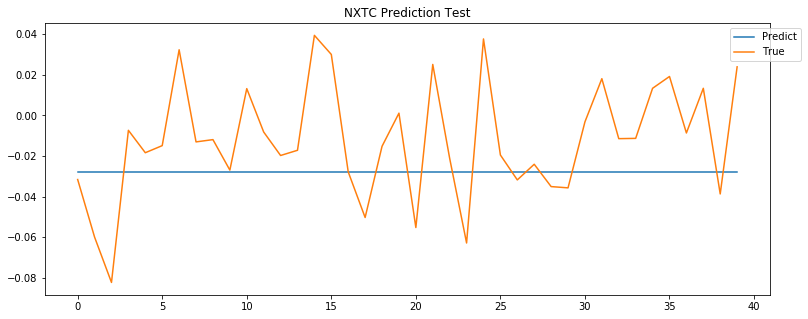

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


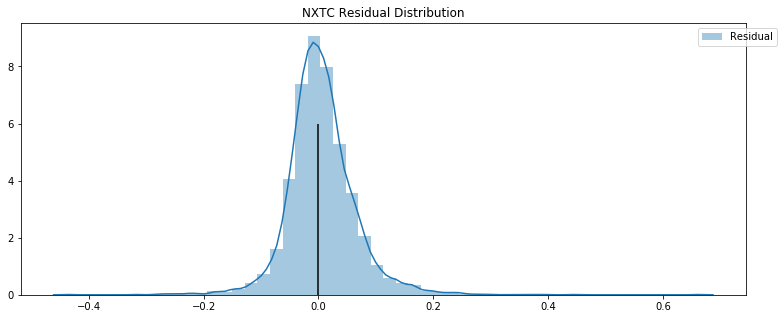

IMMU -302560030073786.7 -71.40937158666294


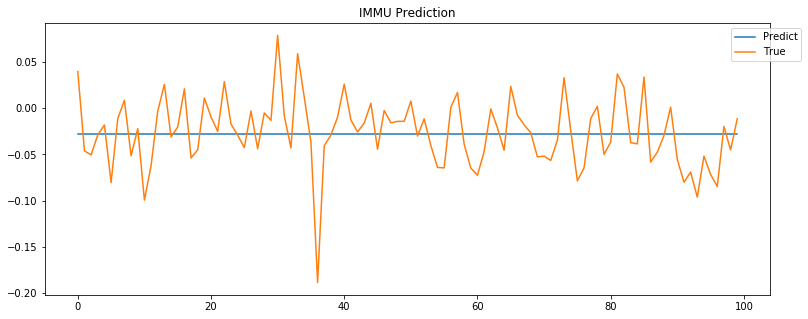

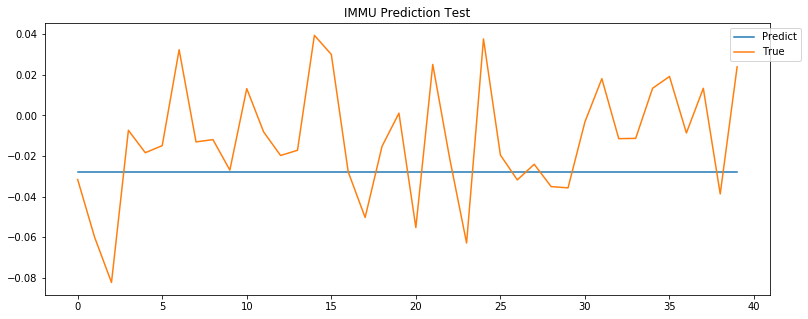

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


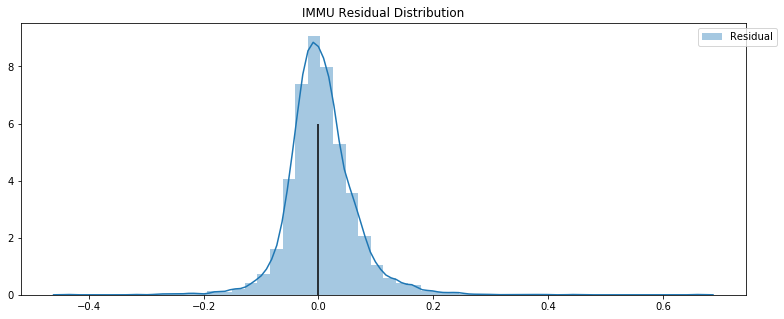

ZIOP -302560030073786.7 -71.40937158666294


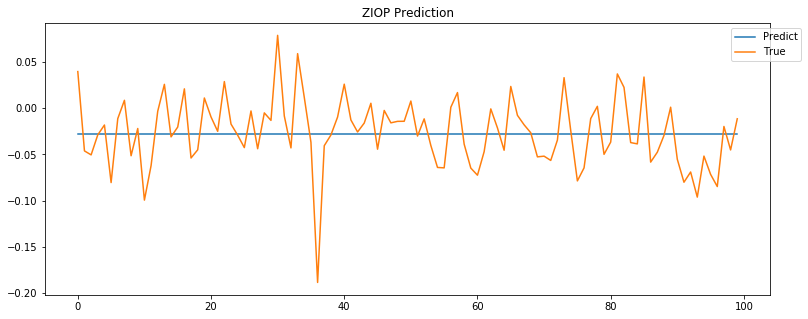

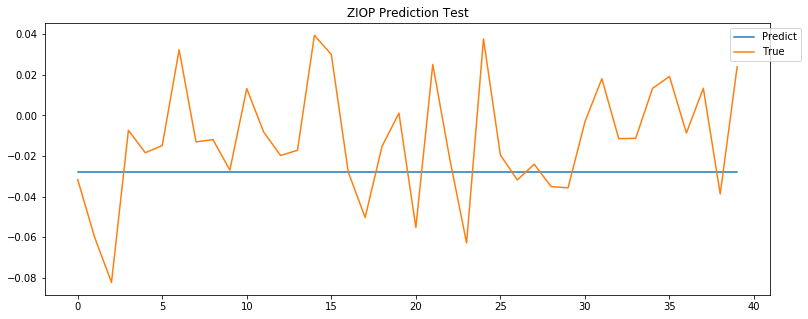

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


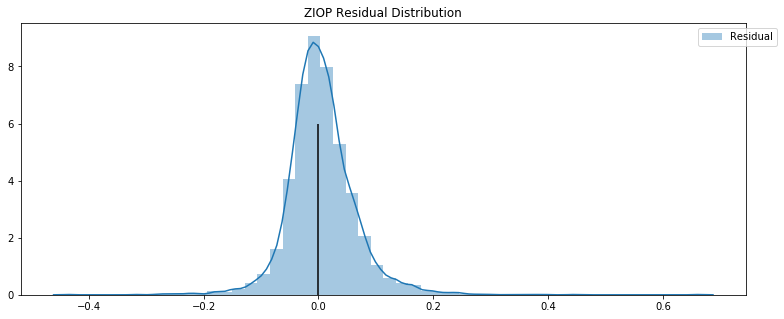

CRSP -302560030073786.7 -71.40937158666294


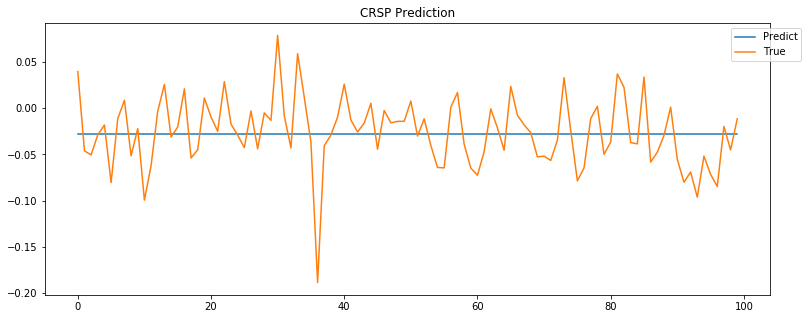

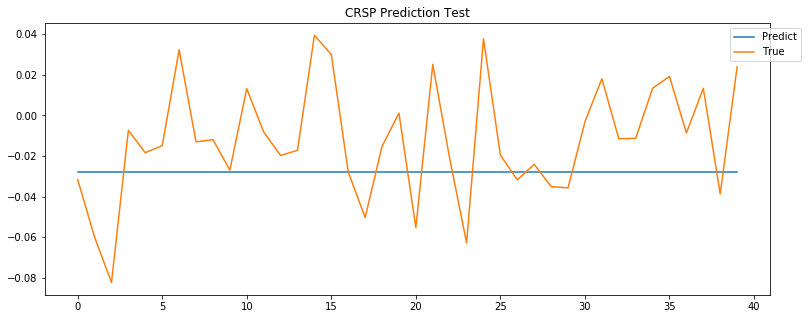

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


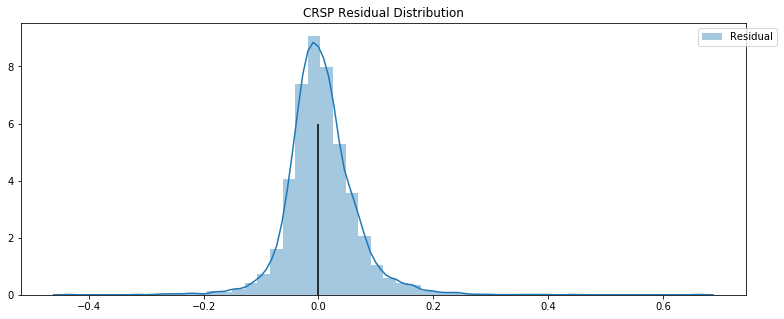

IOVA -302560030073786.7 -71.40937158666294


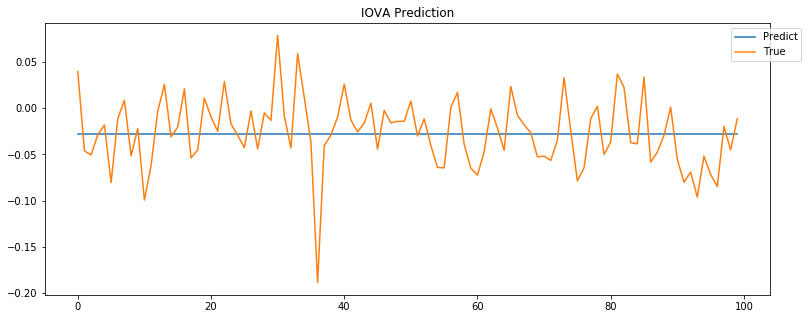

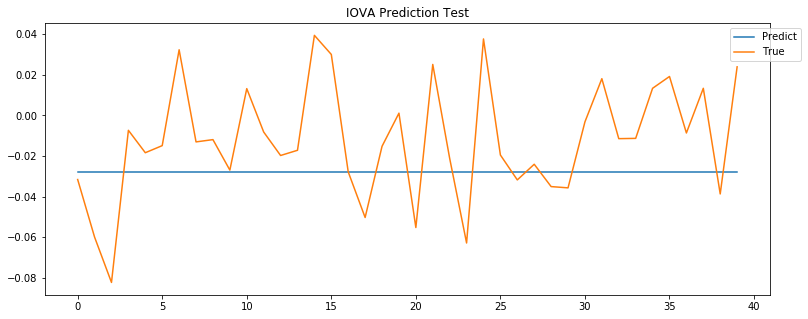

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


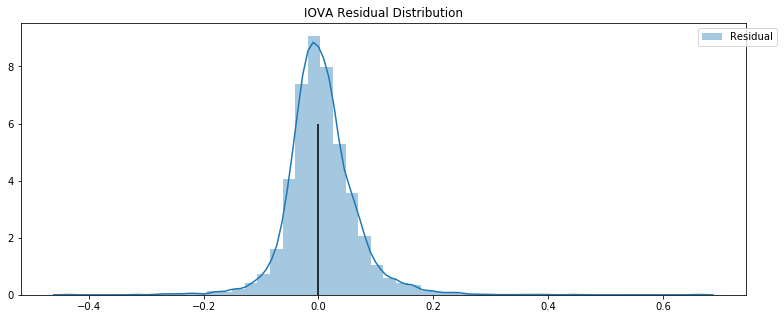

VKTX -302560030073786.7 -71.40937158666294


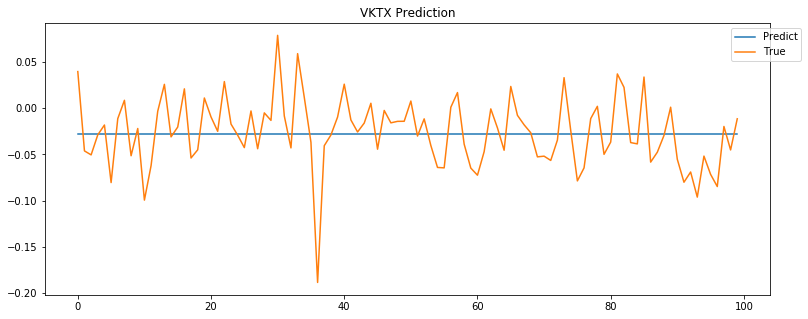

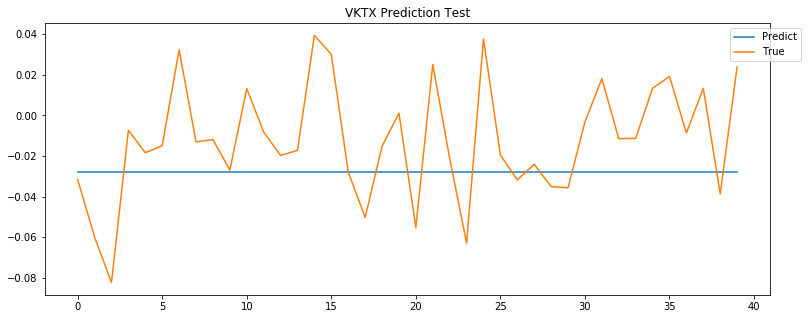

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


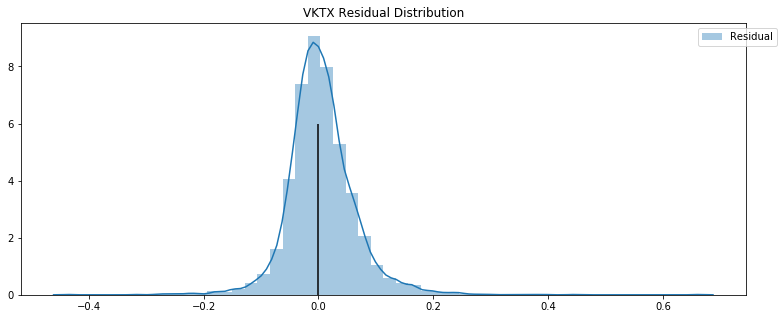

EIDX -302560030073786.7 -71.40937158666294


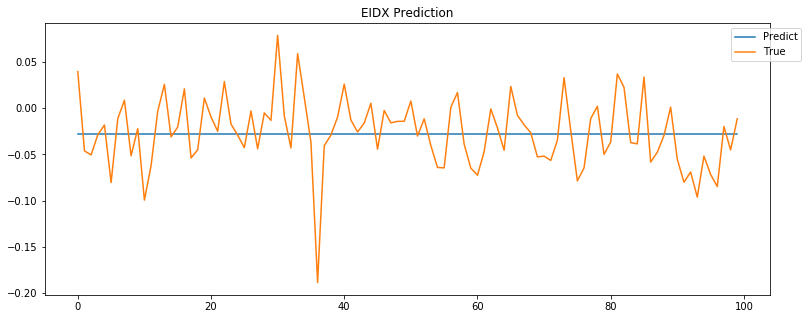

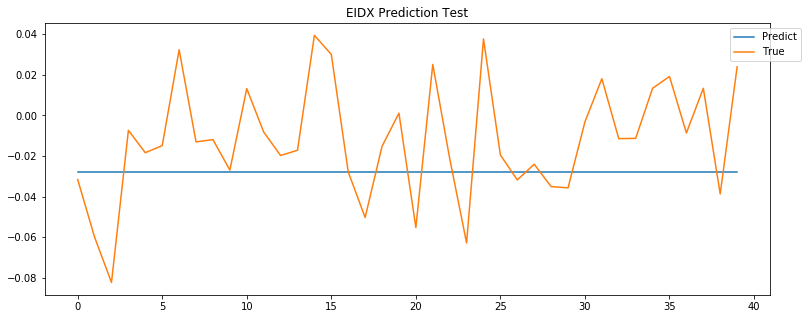

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


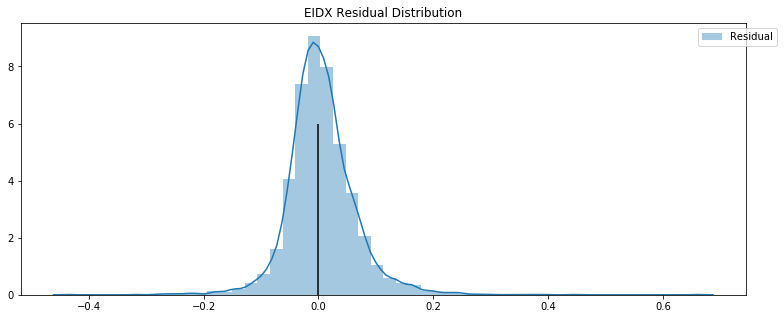

MYOV -302560030073786.7 -71.40937158666294


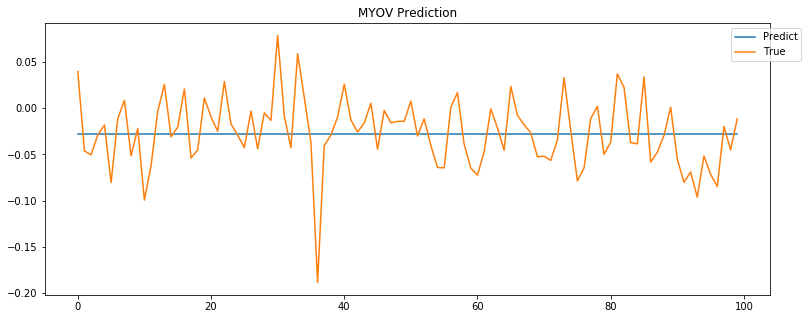

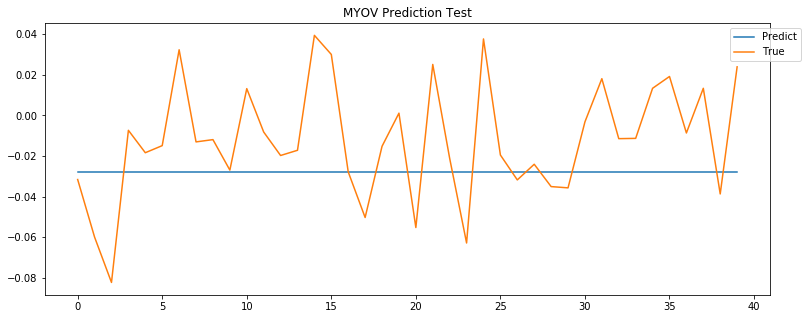

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


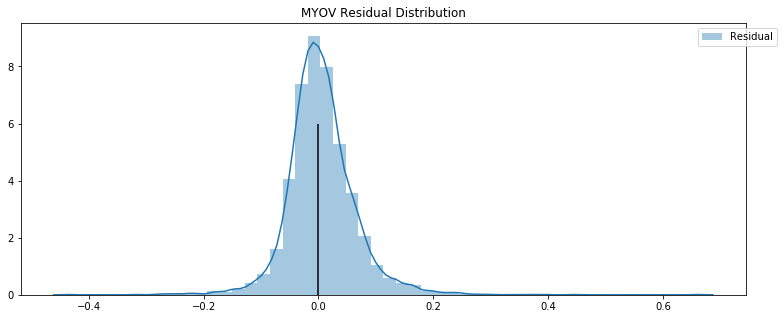

AMRS -302560030073786.7 -71.40937158666294


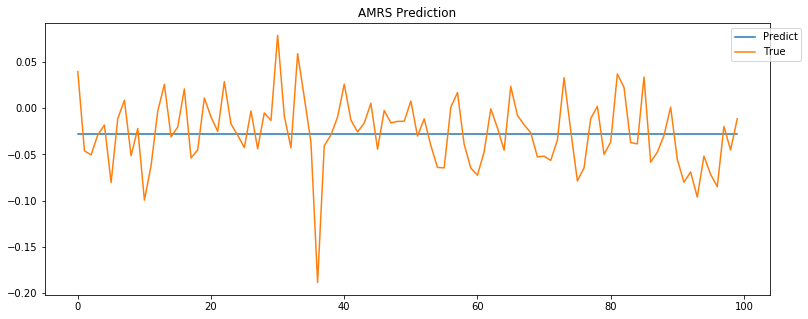

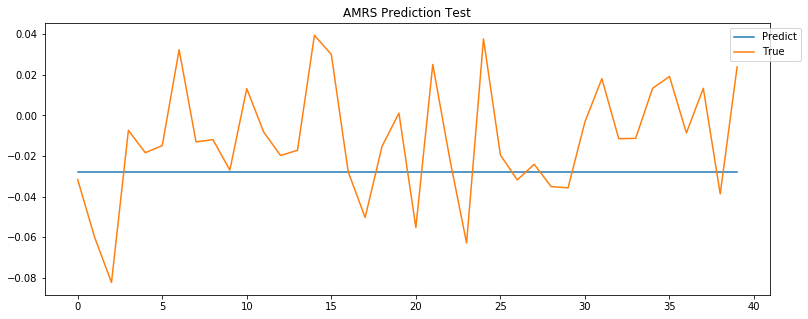

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


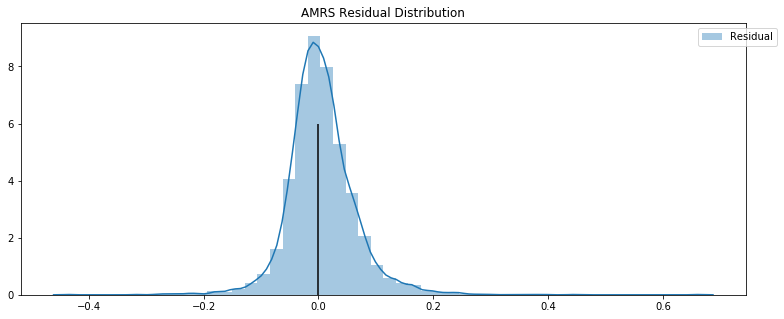

KRYS -302560030073786.7 -71.40937158666294


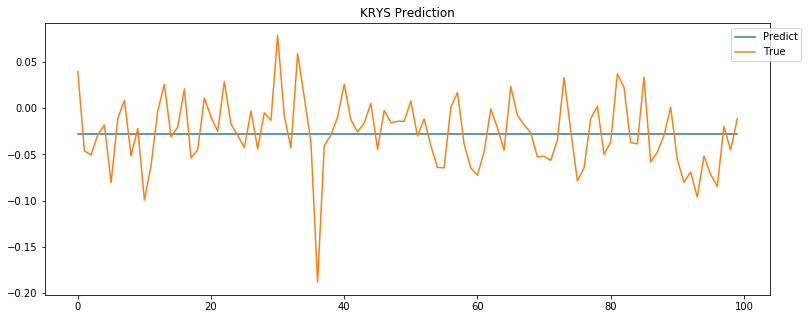

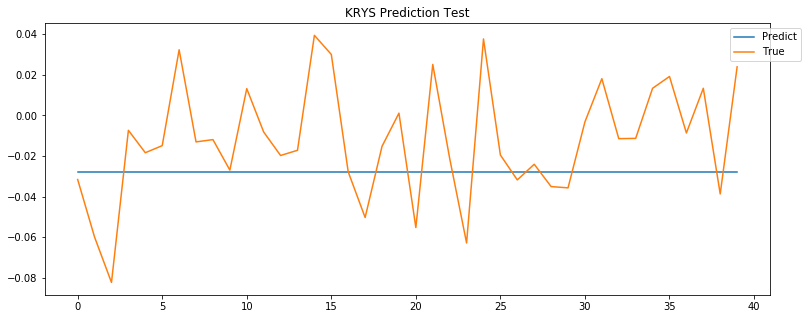

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


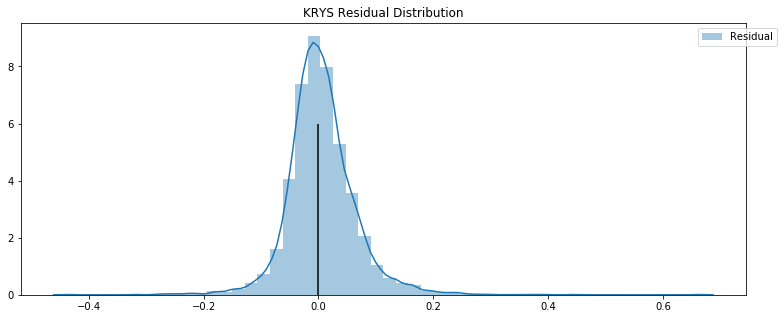

KURA -302560030073786.7 -71.40937158666294


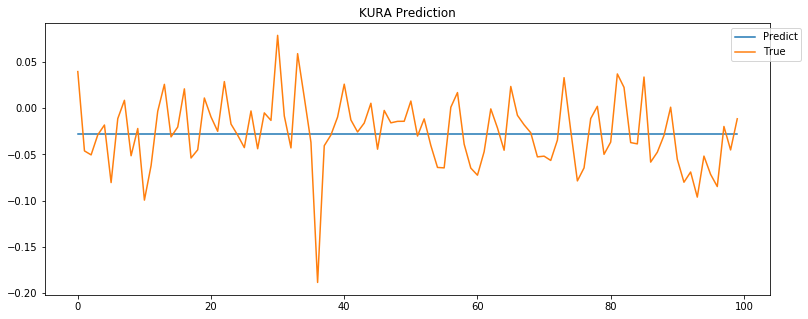

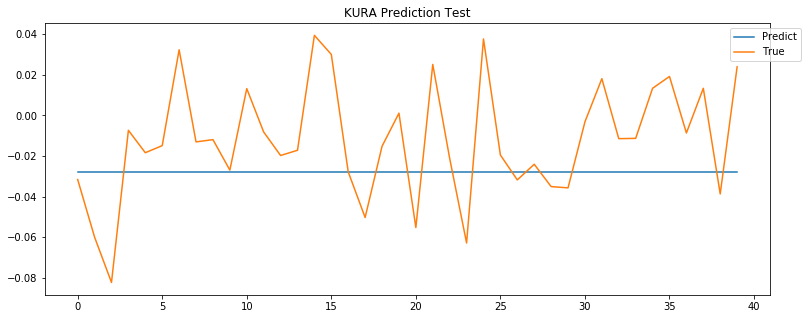

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


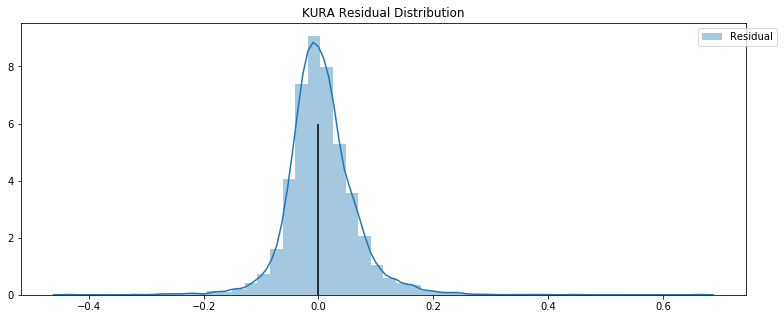

MDGL -302560030073786.7 -71.40937158666294


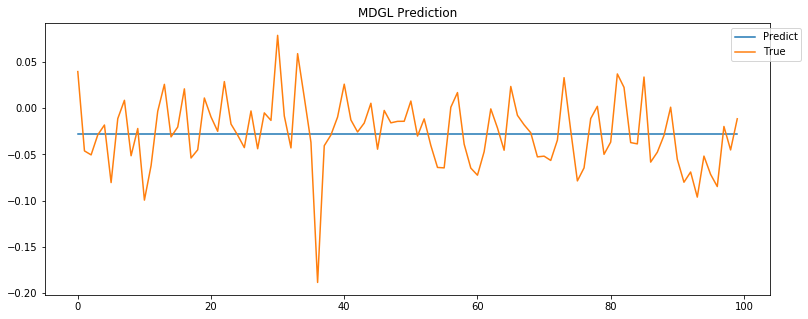

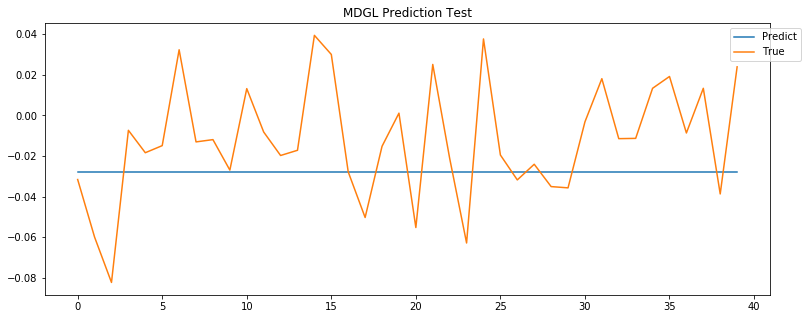

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


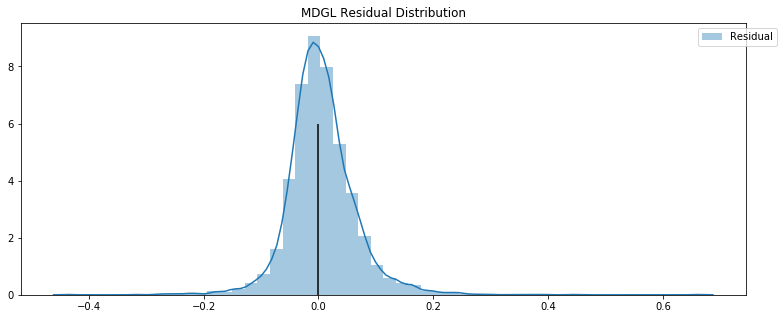

UBX -302560030073786.7 -71.40937158666294


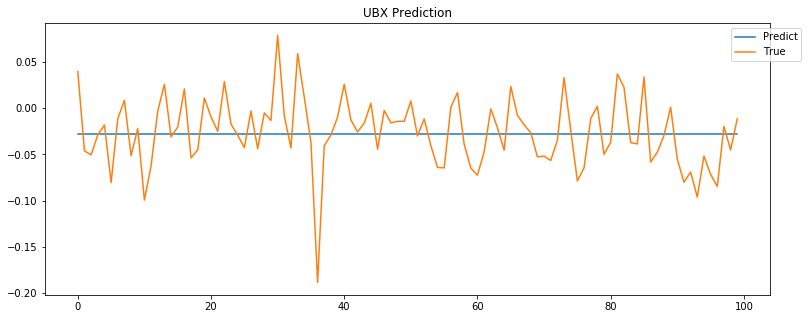

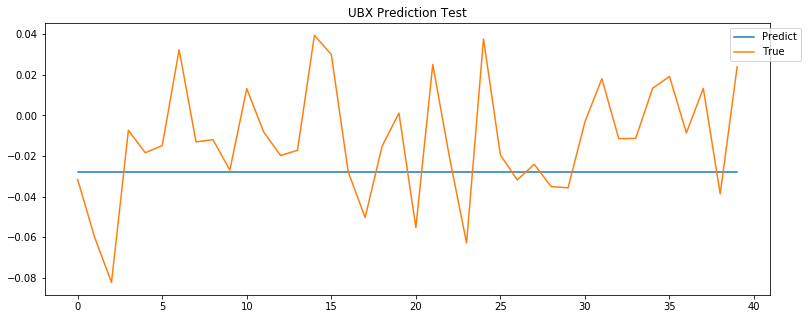

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


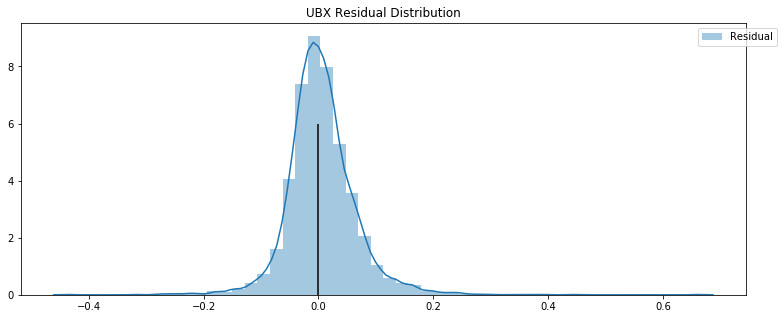

TCDA -302560030073786.7 -71.40937158666294


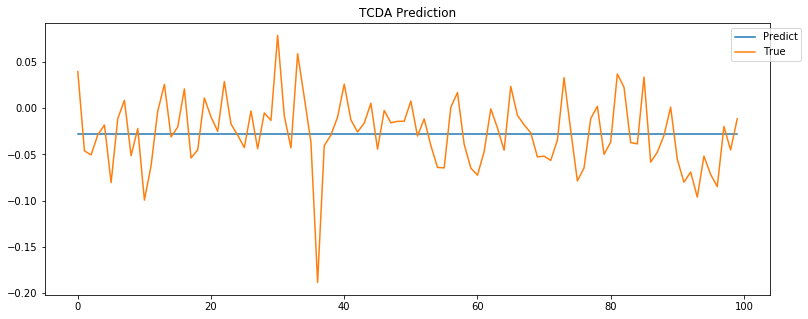

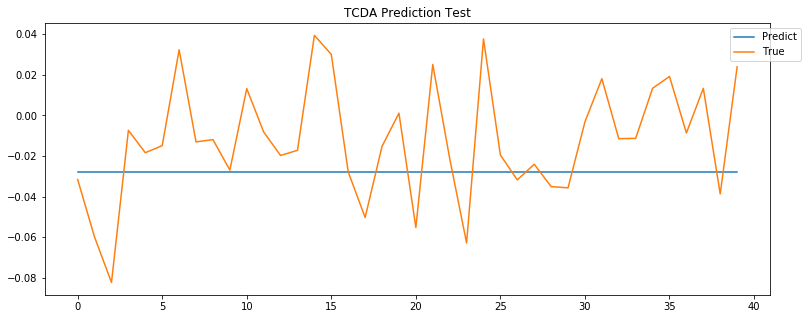

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


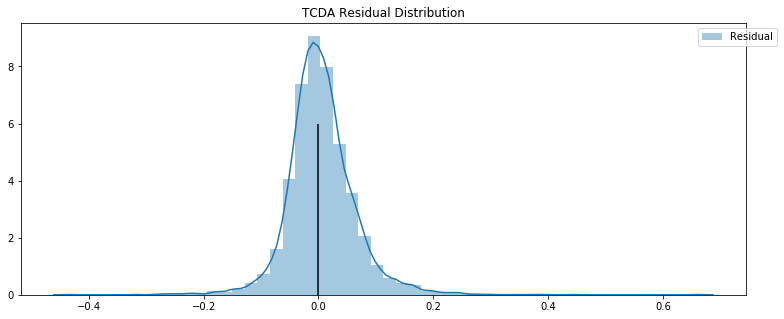

QURE -302560030073786.7 -71.40937158666294


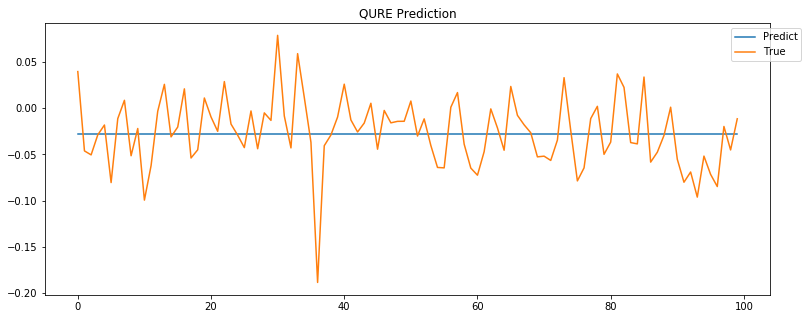

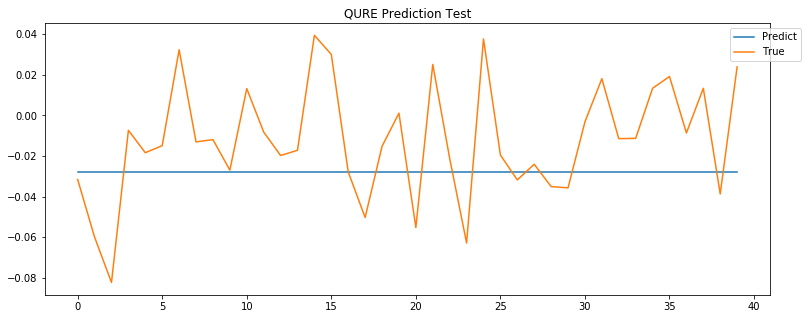

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


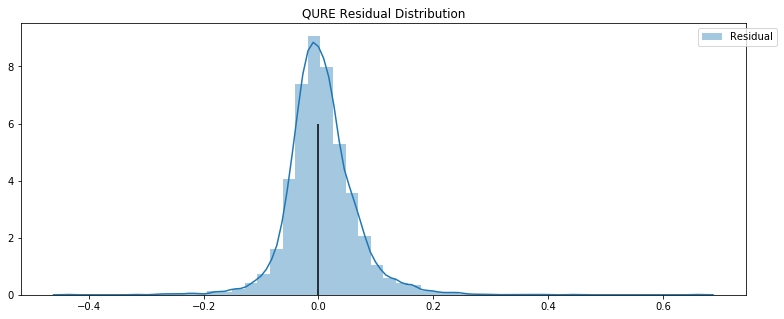

MRTX -302560030073786.7 -71.40937158666294


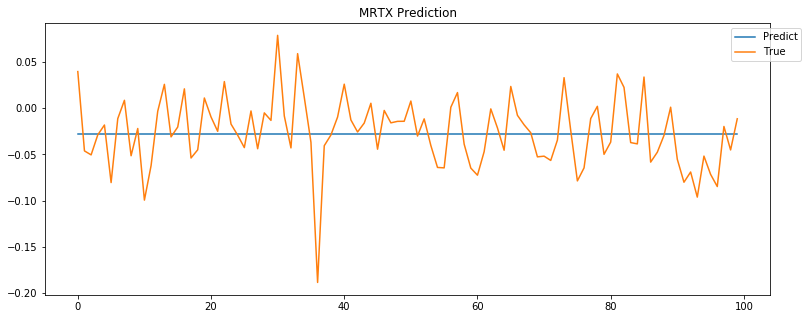

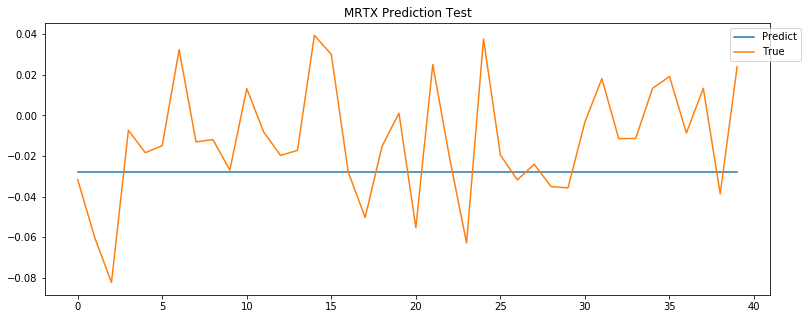

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


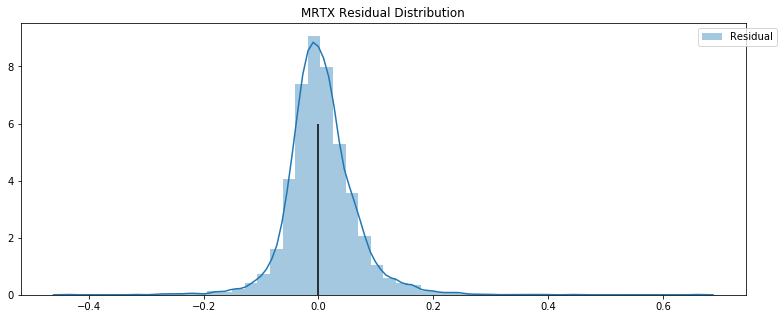

ASMB -302560030073786.7 -71.40937158666294


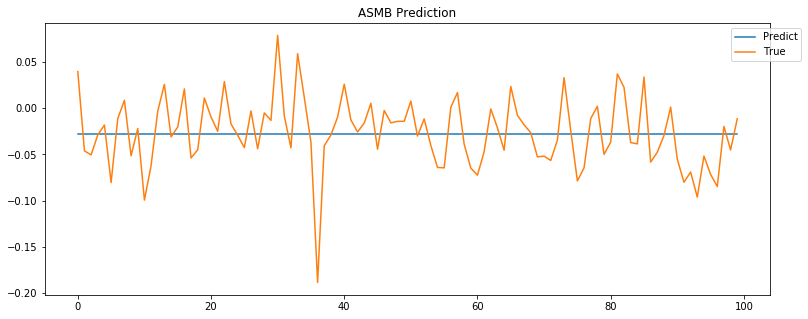

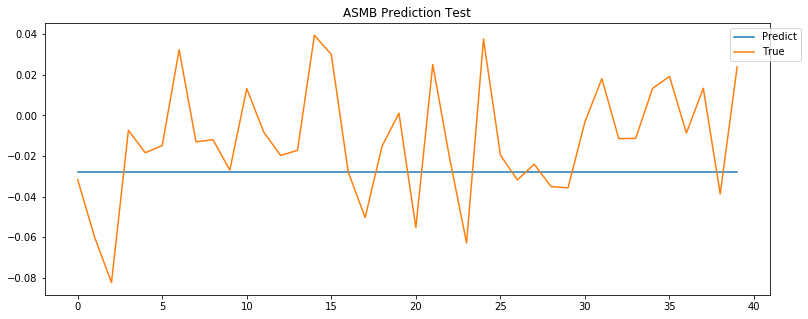

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


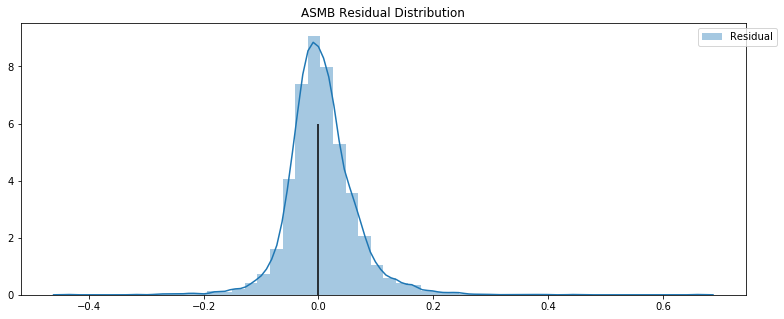

GLYC -302560030073786.7 -71.40937158666294


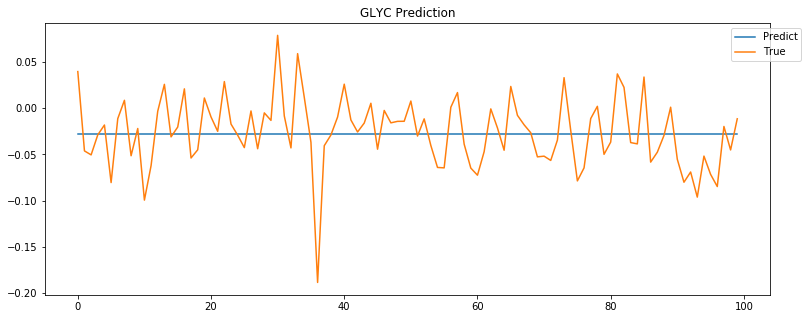

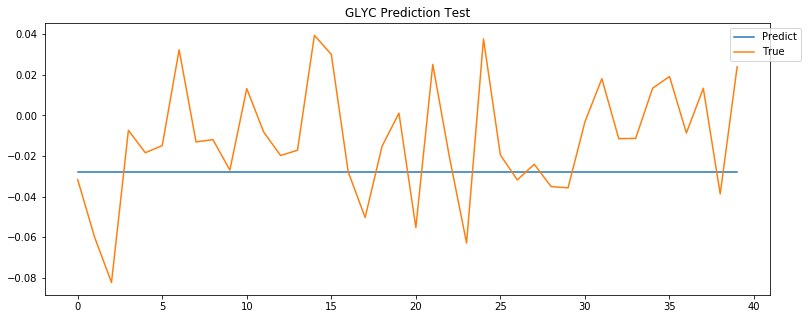

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


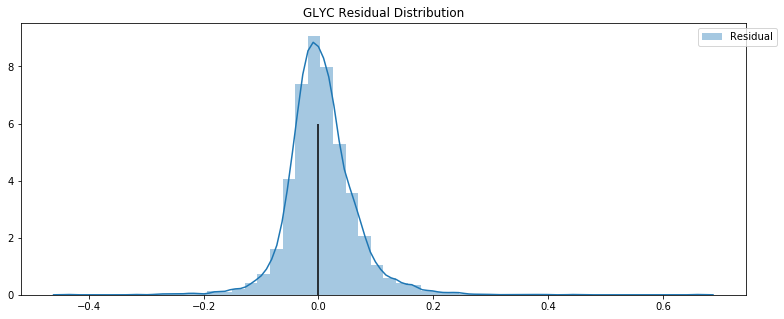

RYTM -302560030073786.7 -71.40937158666294


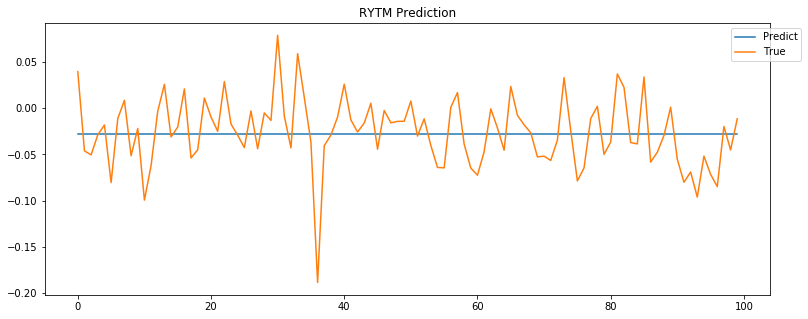

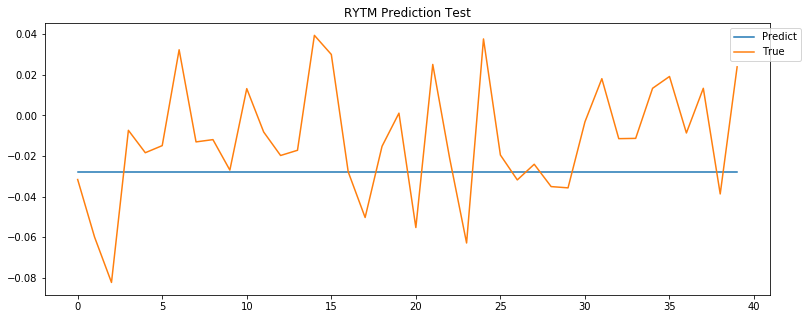

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


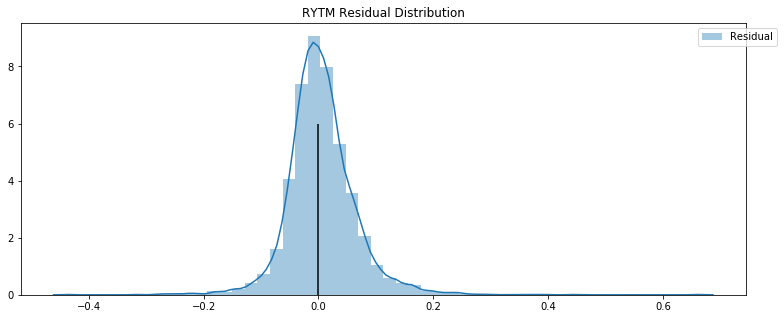

FIXX -302560030073786.7 -71.40937158666294


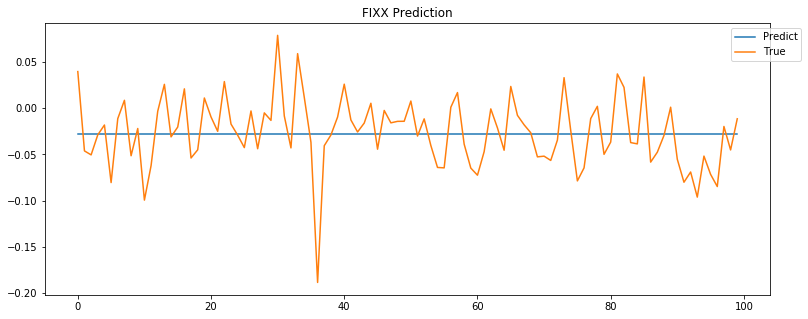

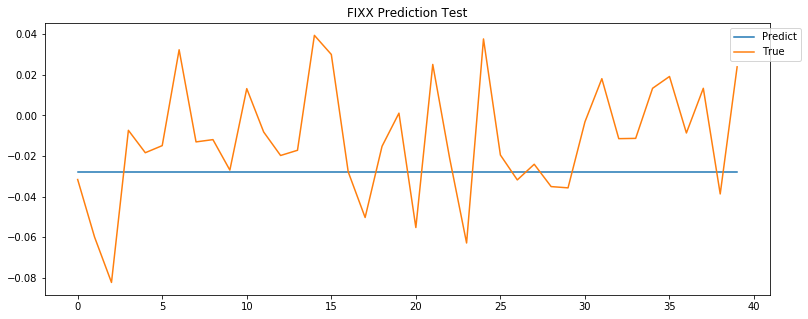

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


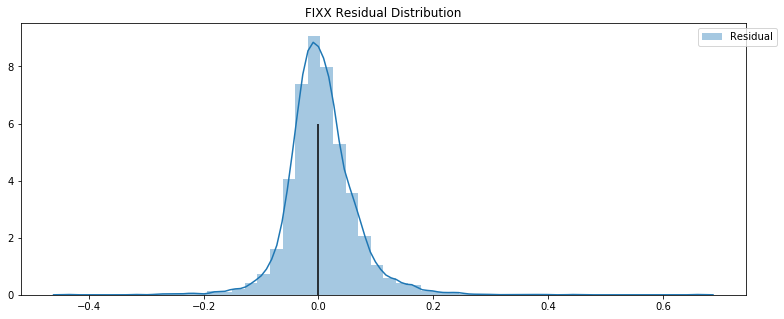

DRNA -302560030073786.7 -71.40937158666294


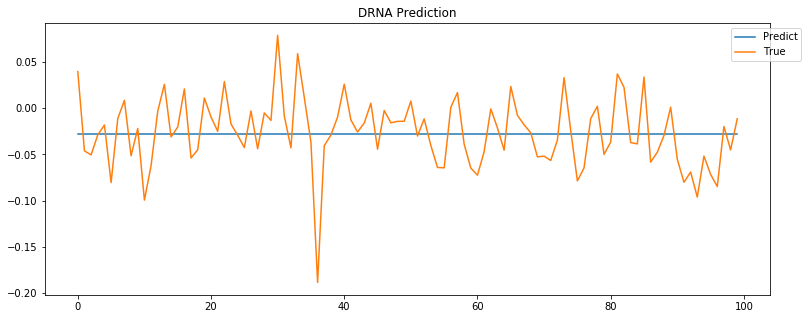

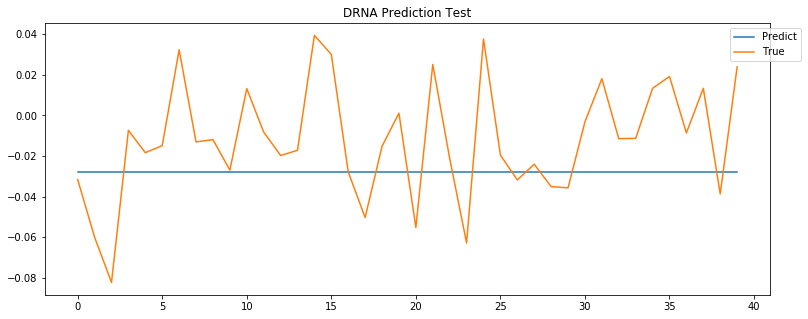

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


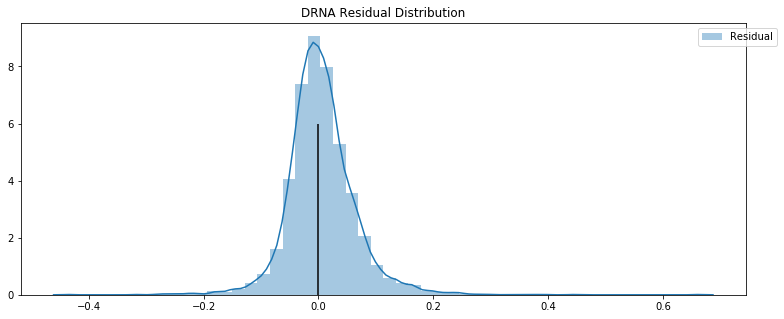

ARWR -302560030073786.7 -71.40937158666294


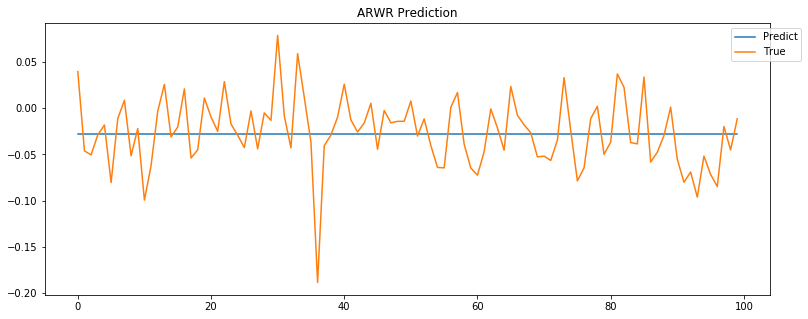

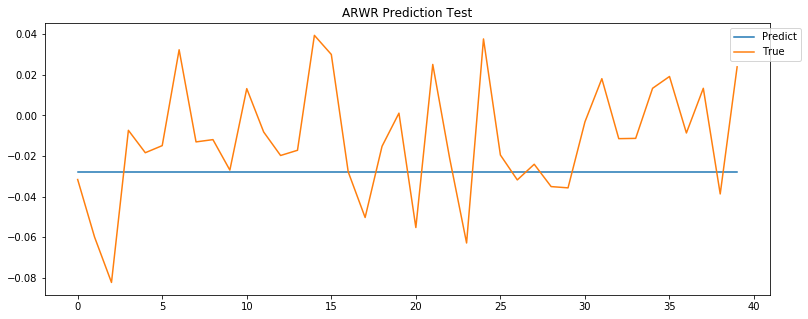

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


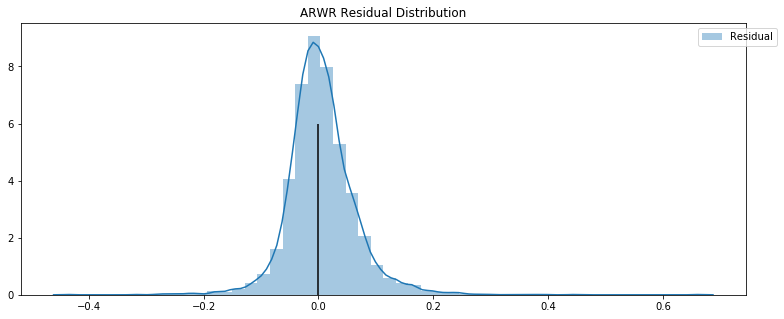

ALLK -302560030073786.7 -71.40937158666294


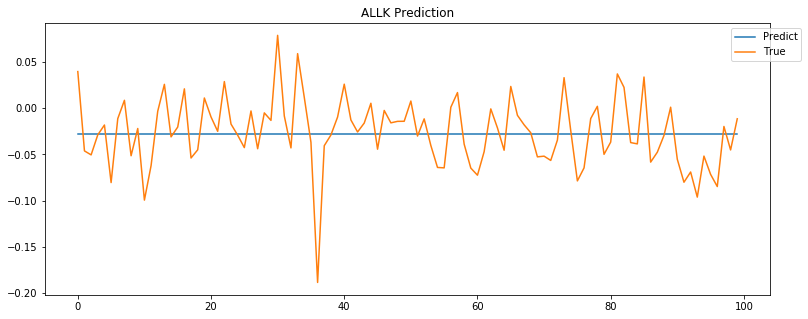

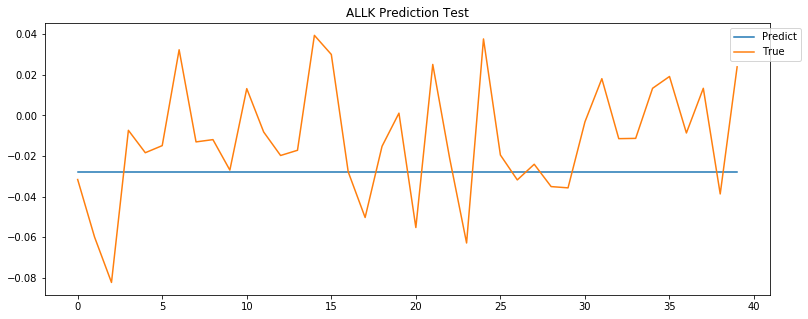

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


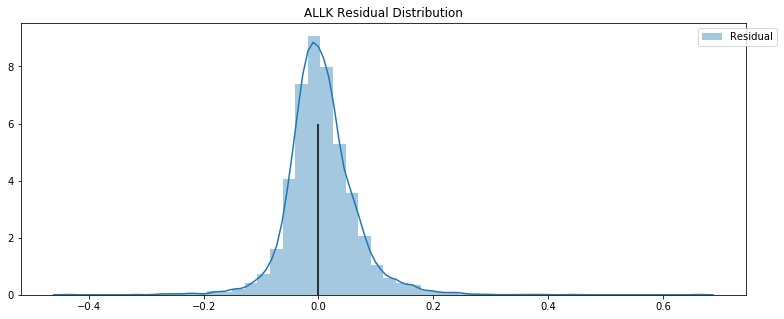

GOSS -302560030073786.7 -71.40937158666294


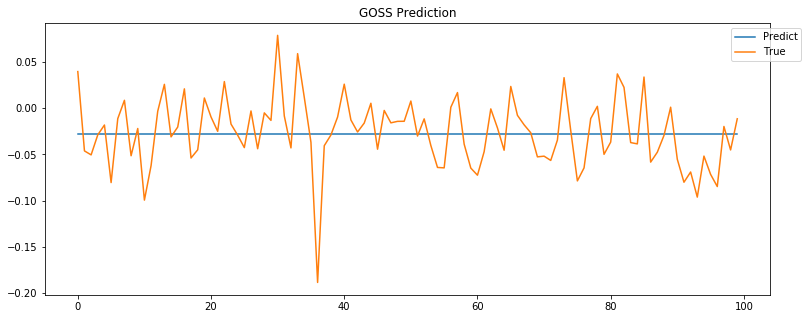

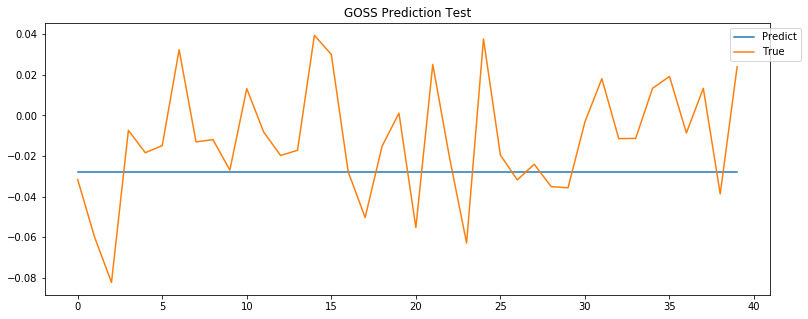

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


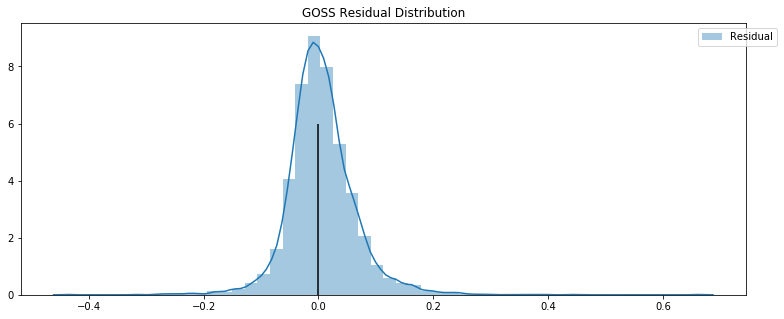

WVE -302560030073786.7 -71.40937158666294


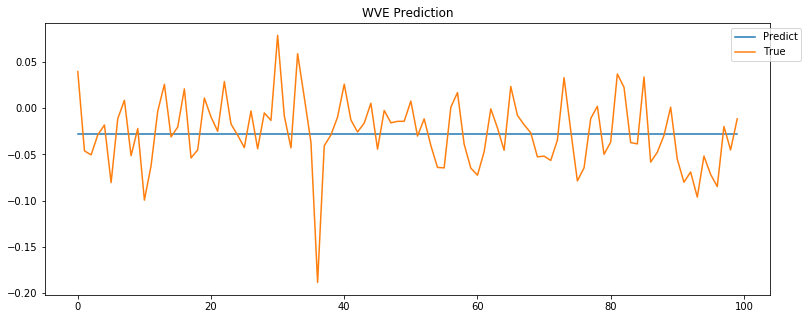

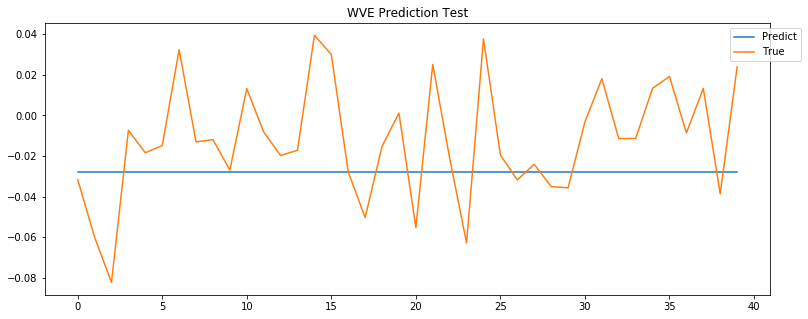

C:\Users\FlatIron_User\.conda\envs\learn-env12_12_19\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


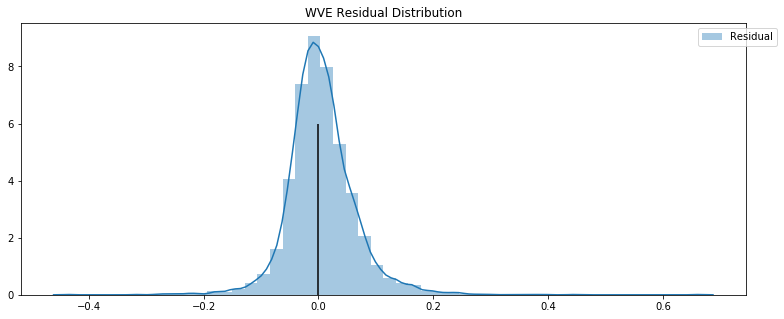

In [20]:
for stock in stocks:
    predict_train = model.predict(feature_train)
    predict_test = model.predict(feature_test)
    print(stock,r2_score(predict_test, label_test), r2_score(predict_train, label_train))
    plt.figure(figsize=(13,5))
    plt.title(f"{stock} Prediction")
    plt.plot(predict_train[-100:], label = 'Predict')
    plt.plot(label_train[-100:], label= 'True')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show()

    plt.figure(figsize=(13,5))
    plt.title(f"{stock} Prediction Test")
    plt.plot(predict_test[-100:], label = 'Predict')
    plt.plot(label_test[-100:], label= 'True')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show()
    plt.figure(figsize=(13,5))
    plt.title(f"{stock} Residual Distribution")
    sns.distplot(predict_train- label_train, label = 'Residual')
    plt.vlines(0,0,6)
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show()

Train on 4905 samples, validate on 40 samples
Epoch 1/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 2/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 3/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 4/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0034 - val_loss: 0.0013
Epoch 5/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0034 - val_loss: 0.0010
Epoch 6/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 7/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 8/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0033 - val_loss: 0.0010
Epoch 9/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0034 - val_loss: 0.0011
Epoch 10/

4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.9553e-04
Epoch 78/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 79/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0010
Epoch 80/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 81/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 82/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 83/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 84/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 85/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 86/1000
4905/4905 [==============================]

4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.5491e-04
Epoch 154/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0010
Epoch 155/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0012
Epoch 156/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.6866e-04
Epoch 157/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0033 - val_loss: 9.1472e-04
Epoch 158/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0033 - val_loss: 0.0012
Epoch 159/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 160/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 161/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0032 - val_loss: 0.0011
Epoch 162/1000
4905/4905 [==============

Epoch 229/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 0.0011
Epoch 230/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0032 - val_loss: 0.0010
Epoch 231/1000
4905/4905 [==============================] - 0s 91us/step - loss: 0.0032 - val_loss: 0.0010
Epoch 232/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0033 - val_loss: 0.0011
Epoch 233/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0032 - val_loss: 9.6183e-04
Epoch 234/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 0.0010
Epoch 235/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 236/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.7978e-04
Epoch 237/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0032 - val_loss: 9.8653e-04
Epoch 238/1000
4905/4905 

4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 305/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0032 - val_loss: 9.6641e-04
Epoch 306/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 0.0010
Epoch 307/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.3379e-04
Epoch 308/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.2681e-04
Epoch 309/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.3804e-04
Epoch 310/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0031 - val_loss: 9.5708e-04
Epoch 311/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0032 - val_loss: 9.9427e-04
Epoch 312/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.9920e-04
Epoch 313/1000
4905/4905

4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.1580e-04
Epoch 380/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 0.0011
Epoch 381/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0032 - val_loss: 9.5365e-04
Epoch 382/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 9.6656e-04
Epoch 383/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0031 - val_loss: 9.1282e-04
Epoch 384/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0032 - val_loss: 0.0011
Epoch 385/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 386/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0031 - val_loss: 0.0011
Epoch 387/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0032 - val_loss: 0.0010
Epoch 388/1000
4905/4905 [==========

4905/4905 [==============================] - 0s 85us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 455/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 456/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 457/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.7867e-04
Epoch 458/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.2484e-04
Epoch 459/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.1013e-04
Epoch 460/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 461/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 0.0010
Epoch 462/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.3482e-04
Epoch 463/1000
4905/4905 [==========

4905/4905 [==============================] - 0s 84us/step - loss: 0.0030 - val_loss: 9.9298e-04
Epoch 529/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0031 - val_loss: 9.9844e-04
Epoch 530/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0030 - val_loss: 9.3429e-04
Epoch 531/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.3263e-04
Epoch 532/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0031 - val_loss: 9.9993e-04
Epoch 533/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.3797e-04
Epoch 534/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.3198e-04
Epoch 535/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.5904e-04
Epoch 536/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0031 - val_loss: 9.1861e-04
Epoch 537/1000
4

Epoch 602/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0029 - val_loss: 8.5325e-04
Epoch 603/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0029 - val_loss: 8.6012e-04
Epoch 604/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0029 - val_loss: 8.9841e-04
Epoch 605/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0029 - val_loss: 8.4604e-04
Epoch 606/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0029 - val_loss: 8.1952e-04
Epoch 607/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0030 - val_loss: 8.4613e-04
Epoch 608/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0030 - val_loss: 8.3033e-04
Epoch 609/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0029 - val_loss: 8.0656e-04
Epoch 610/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0029 - val_loss: 8.6211e-04
E

Epoch 676/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0022 - val_loss: 4.9897e-04
Epoch 677/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0023 - val_loss: 5.6332e-04
Epoch 678/1000
4905/4905 [==============================] - ETA: 0s - loss: 0.002 - 0s 88us/step - loss: 0.0021 - val_loss: 4.2106e-04
Epoch 679/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0022 - val_loss: 6.5183e-04
Epoch 680/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0022 - val_loss: 4.5156e-04
Epoch 681/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0023 - val_loss: 4.8628e-04
Epoch 682/1000
4905/4905 [==============================] - 0s 91us/step - loss: 0.0022 - val_loss: 6.5599e-04
Epoch 683/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0022 - val_loss: 4.8413e-04
Epoch 684/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0021 

4905/4905 [==============================] - 0s 84us/step - loss: 0.0020 - val_loss: 6.2348e-04
Epoch 750/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0021 - val_loss: 5.4546e-04
Epoch 751/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0021 - val_loss: 4.5805e-04
Epoch 752/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0020 - val_loss: 5.9357e-04
Epoch 753/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0021 - val_loss: 5.6196e-04
Epoch 754/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0020 - val_loss: 5.4023e-04
Epoch 755/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0021 - val_loss: 5.7516e-04
Epoch 756/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0020 - val_loss: 6.6987e-04
Epoch 757/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0020 - val_loss: 5.3226e-04
Epoch 758/1000
4

Epoch 823/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.3407e-04
Epoch 824/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0019 - val_loss: 4.2492e-04
Epoch 825/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0019 - val_loss: 4.8531e-04
Epoch 826/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.8632e-04
Epoch 827/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 6.1450e-04
Epoch 828/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 5.3549e-04
Epoch 829/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.9111e-04
Epoch 830/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0019 - val_loss: 4.0529e-04
Epoch 831/1000
4905/4905 [==============================] - 0s 90us/step - loss: 0.0019 - val_loss: 4.7086e-04
E

Epoch 897/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.4697e-04
Epoch 898/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0020 - val_loss: 5.7925e-04
Epoch 899/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 3.9334e-04
Epoch 900/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 5.3224e-04
Epoch 901/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.9727e-04
Epoch 902/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.5223e-04
Epoch 903/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.5796e-04
Epoch 904/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.7307e-04
Epoch 905/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 5.5695e-04
E

Epoch 971/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.7988e-04
Epoch 972/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0019 - val_loss: 5.4983e-04
Epoch 973/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0019 - val_loss: 3.8310e-04
Epoch 974/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0018 - val_loss: 5.8266e-04
Epoch 975/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 5.0553e-04
Epoch 976/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.8033e-04
Epoch 977/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0019 - val_loss: 5.0711e-04
Epoch 978/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.6368e-04
Epoch 979/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0019 - val_loss: 4.9210e-04
E

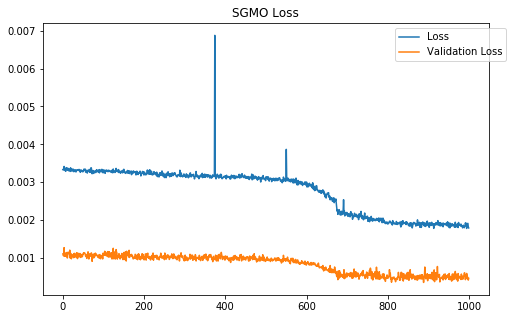

In [21]:
stock = 'SGMO'
(feature_train, label_train, feature_test, label_test) = (processed_data[stock]['data_1'],processed_data[stock]['target_1'], 
                                                            processed_data[stock]['data_test'], processed_data[stock]['target_test']) 
model.fit(feature_train, label_train, batch_size=50, epochs=1000, validation_data = (feature_test, label_test))
dict_ = model.history.history
plt.figure(figsize=(8,5))
plt.title(f"{stock} Loss")
plt.plot(dict_['loss'], label = 'Loss')
plt.plot(dict_['val_loss'], label= 'Validation Loss')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()
model.save('model.h5')

Train on 4905 samples, validate on 40 samples
Epoch 1/1000
4905/4905 [==============================] - 0s 91us/step - loss: 0.0018 - val_loss: 3.8691e-04
Epoch 2/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0019 - val_loss: 4.3649e-04
Epoch 3/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0018 - val_loss: 4.2542e-04
Epoch 4/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0018 - val_loss: 6.4614e-04
Epoch 5/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0019 - val_loss: 4.6169e-04
Epoch 6/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0018 - val_loss: 4.9273e-04
Epoch 7/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0018 - val_loss: 4.4685e-04
Epoch 8/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0018 - val_loss: 4.8595e-04
Epoch 9/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0

4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.3706e-04
Epoch 76/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 4.0260e-04
Epoch 77/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 5.7069e-04
Epoch 78/1000
4905/4905 [==============================] - 1s 121us/step - loss: 0.0018 - val_loss: 5.1452e-04
Epoch 79/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0018 - val_loss: 5.6682e-04
Epoch 80/1000
4905/4905 [==============================] - 0s 102us/step - loss: 0.0018 - val_loss: 5.0585e-04
Epoch 81/1000
4905/4905 [==============================] - 1s 133us/step - loss: 0.0018 - val_loss: 4.9055e-04
Epoch 82/1000
4905/4905 [==============================] - 1s 122us/step - loss: 0.0018 - val_loss: 5.4941e-04
Epoch 83/1000
4905/4905 [==============================] - 1s 135us/step - loss: 0.0018 - val_loss: 4.5713e-04
Epoch 84/1000
4905/

4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.3644e-04
Epoch 150/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.5796e-04
Epoch 151/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 5.0443e-04
Epoch 152/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0018 - val_loss: 4.7430e-04
Epoch 153/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.5211e-04
Epoch 154/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 6.0053e-04
Epoch 155/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.9173e-04
Epoch 156/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0019 - val_loss: 4.2439e-04
Epoch 157/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.4325e-04
Epoch 158/1000
4

Epoch 223/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.4092e-04
Epoch 224/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 6.4863e-04
Epoch 225/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 6.2236e-04
Epoch 226/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.8746e-04
Epoch 227/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.6671e-04
Epoch 228/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 5.0123e-04
Epoch 229/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 5.4095e-04
Epoch 230/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.2795e-04
Epoch 231/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.3965e-04
E

Epoch 297/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.7210e-04
Epoch 298/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 4.0605e-04
Epoch 299/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0018 - val_loss: 4.3445e-04
Epoch 300/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 5.9018e-04
Epoch 301/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0017 - val_loss: 6.1660e-04
Epoch 302/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.6012e-04
Epoch 303/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.0080e-04
Epoch 304/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.1664e-04
Epoch 305/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.0176e-04
E

Epoch 371/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0019 - val_loss: 5.1921e-04
Epoch 372/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.9505e-04
Epoch 373/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.3713e-04
Epoch 374/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.9505e-04
Epoch 375/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.2359e-04
Epoch 376/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.6855e-04
Epoch 377/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.4232e-04
Epoch 378/1000
4905/4905 [==============================] - 0s 87us/step - loss: 0.0018 - val_loss: 5.6919e-04
Epoch 379/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 6.3512e-04
E

Epoch 445/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.7101e-04
Epoch 446/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 3.9672e-04
Epoch 447/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.1970e-04
Epoch 448/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.0324e-04
Epoch 449/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.6845e-04
Epoch 450/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 4.8638e-04
Epoch 451/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.2232e-04
Epoch 452/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.7095e-04
Epoch 453/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.6901e-04
E

Epoch 519/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.7567e-04
Epoch 520/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0017 - val_loss: 4.3238e-04
Epoch 521/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.7288e-04
Epoch 522/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0017 - val_loss: 4.7366e-04
Epoch 523/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.0564e-04
Epoch 524/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.7946e-04
Epoch 525/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 4.3412e-04
Epoch 526/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.4087e-04
Epoch 527/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.9385e-04
E

Epoch 593/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0017 - val_loss: 4.5192e-04
Epoch 594/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0017 - val_loss: 5.3378e-04
Epoch 595/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 6.0144e-04
Epoch 596/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.0486e-04
Epoch 597/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 7.4429e-04
Epoch 598/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.2631e-04
Epoch 599/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0017 - val_loss: 5.2875e-04
Epoch 600/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 3.9110e-04
Epoch 601/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.2601e-04
E

Epoch 667/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.7967e-04
Epoch 668/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.1351e-04
Epoch 669/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.3203e-04
Epoch 670/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.3507e-04
Epoch 671/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.7606e-04
Epoch 672/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0017 - val_loss: 4.8938e-04
Epoch 673/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.7521e-04
Epoch 674/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 5.1917e-04
Epoch 675/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.8535e-04
E

Epoch 741/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0017 - val_loss: 4.5716e-04
Epoch 742/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0017 - val_loss: 4.4812e-04
Epoch 743/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0017 - val_loss: 4.8399e-04
Epoch 744/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0017 - val_loss: 5.4669e-04
Epoch 745/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0017 - val_loss: 4.7330e-04
Epoch 746/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0017 - val_loss: 4.7143e-04
Epoch 747/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0017 - val_loss: 4.3137e-04
Epoch 748/1000
4905/4905 [==============================] - 0s 88us/step - loss: 0.0017 - val_loss: 4.7800e-04
Epoch 749/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.4260e-04
E

Epoch 815/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.9095e-04
Epoch 816/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 3.8138e-04
Epoch 817/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.5860e-04
Epoch 818/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0017 - val_loss: 4.6311e-04
Epoch 819/1000
4905/4905 [==============================] - 0s 89us/step - loss: 0.0018 - val_loss: 4.6958e-04
Epoch 820/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.1443e-04
Epoch 821/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.6070e-04
Epoch 822/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.7659e-04
Epoch 823/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0017 - val_loss: 5.2080e-04
E

Epoch 889/1000
4905/4905 [==============================] - ETA: 0s - loss: 0.001 - 0s 90us/step - loss: 0.0017 - val_loss: 4.8824e-04
Epoch 890/1000
4905/4905 [==============================] - 0s 86us/step - loss: 0.0017 - val_loss: 5.1619e-04
Epoch 891/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.5968e-04
Epoch 892/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.5542e-04
Epoch 893/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.2106e-04
Epoch 894/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0018 - val_loss: 5.0762e-04
Epoch 895/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 5.1233e-04
Epoch 896/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0017 - val_loss: 4.9892e-04
Epoch 897/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 

4905/4905 [==============================] - 0s 83us/step - loss: 0.0017 - val_loss: 4.7040e-04
Epoch 963/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0017 - val_loss: 5.0284e-04
Epoch 964/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0018 - val_loss: 4.8939e-04
Epoch 965/1000
4905/4905 [==============================] - 0s 85us/step - loss: 0.0017 - val_loss: 6.3736e-04
Epoch 966/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.1945e-04
Epoch 967/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.4269e-04
Epoch 968/1000
4905/4905 [==============================] - 0s 83us/step - loss: 0.0017 - val_loss: 6.9602e-04
Epoch 969/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 5.7786e-04
Epoch 970/1000
4905/4905 [==============================] - 0s 84us/step - loss: 0.0017 - val_loss: 4.3507e-04
Epoch 971/1000
4

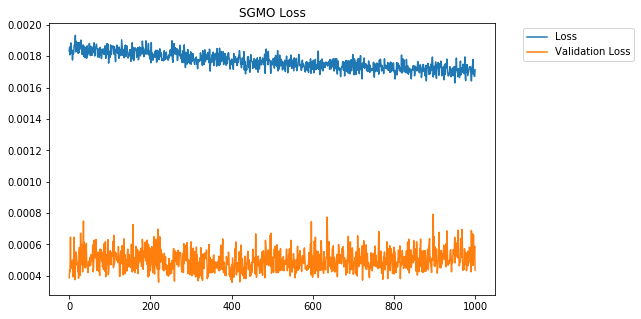

In [22]:
stock = 'SGMO'
(feature_train, label_train, feature_test, label_test) = (processed_data[stock]['data_1'],processed_data[stock]['target_1'], 
                                                            processed_data[stock]['data_test'], processed_data[stock]['target_test']) 
model.fit(feature_train, label_train, batch_size=50, epochs=1000, validation_data = (feature_test, label_test))
dict_ = model.history.history
plt.figure(figsize=(8,5))
plt.title(f"{stock} Loss")
plt.plot(dict_['loss'], label = 'Loss')
plt.plot(dict_['val_loss'], label= 'Validation Loss')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()
model.save('model.h5')